# World Happiness Report (2015-2022)

![green-divider](https://i.postimg.cc/BvHNGMgG/blue.png)

## 1. Opis i określenie celu projektu

### Sprawdzimy jak poziom szczęśliwości ludzi jest uzależniony od czynników znajdujących się w naszym zbiorze i jak bardzo zmienia się w czasie. Analizować będziemy poziomy szczęśliwości z lat 2015-2022.

Wyniki poziomu szczęśliwości w raportach są sumą siedmiu czynników. Im wyższa wartość każdego z nich, tym wyższy poziom szczęścia. Możemy zdefiniować znaczenie tych czynników jako stopień, w jakim te czynniki prowadzą do szczęścia. Celem wyboru tej pracy jest ustalenie, które czynniki są ważniejsze dla szczęśliwszego życia. W rezultacie ludzie i kraje mogą skupić się na ważniejszych czynnikach, aby osiągnąć wyższy poziom szczęścia. Wdrożymy kilka modeli uczenia maszynowego, aby przewidzieć wynik szczęścia i porównać wynik, aby porównać, który algorytm działa lepiej dla tego konkretnego zbioru danych.

### Czym jest World Happiness Report?

World Happiness Report to przełomowe badanie stanu globalnego szczęścia. Raport nadal zyskuje globalne uznanie, ponieważ rządy, organizacje i społeczeństwo obywatelskie coraz częściej wykorzystują wskaźniki szczęścia do podejmowania decyzji politycznych. Wiodący eksperci w różnych dziedzinach - ekonomii, psychologii, analizach ankietowych, statystykach krajowych, zdrowiu, polityce publicznej i innych - opisują, w jaki sposób pomiary zadowolenia mogą być skutecznie wykorzystywane do oceny przemian w społeczeństwach. Raporty przedstawiają stan szczęścia we współczesnym świecie i pokazują, jak nowa nauka o szczęściu wyjaśnia osobiste i narodowe różnice w szczęściu.


Wyniki pochodzą z ogólnokrajowych reprezentatywnych prób i wykorzystują wagi Gallupa, aby szacunki były reprezentatywne. Kolumny następujące po wyniku szczęścia szacują, w jakim stopniu każdy z sześciu czynników – produkcja ekonomiczna, wsparcie społeczne, oczekiwana długość życia, wolność, brak korupcji i hojność – przyczynia się do wyższej oceny życia w każdym kraju niż w Dystopii, czyli hipotetycznym kraju, który ma wartości równe najniższym średnim krajowym na świecie dla każdego z sześciu czynników. Nie mają one wpływu na całkowity wynik zgłoszony dla każdego kraju, ale wyjaśniają, dlaczego niektóre kraje plasują się wyżej niż inne.


Celem ustanowienia Dystopii jest posiadanie punktu odniesienia, z którym wszystkie kraje mogą być korzystnie porównywane (żaden kraj nie działa gorzej niż Dystopia). Najniższe wyniki obserwowane dla sześciu kluczowych zmiennych charakteryzują zatem Dystopię.

### Nasz zbiór zawiera następujące dane:

- Year - Rok
- Country - Kraj
- Happiness - Szczęśliwość, zadowolenie
- GDP per capita - wpływ PKB na zadowolenie
- Socjal support - Pomoc socjalna
- Life Exp - Spodziewana długość zdrowego życia
- Freedom - Wolność osobista
- Generosity - Hojność społeczeństwa
- Gov Corruption - Postrzeganie korupcji
- Dystopia Residual - Porównanie do "Dystopii", hipotetycznym kraju o najgorszych wszystkich wskaźnikach
- Broadband - Dostęp do szerokopasmowego internetu
- Internet individuals - % populacji indywidualnie używającej internet
- Fertility - Dzietność, średnia liczba dzieci urodzonych przez kobietę 
- Annual sunshine - Usłonecznienie

![green-divider](https://i.postimg.cc/BvHNGMgG/blue.png)

## 2. Importy bibliotek

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly
from plotly.offline import iplot, init_notebook_mode 
init_notebook_mode() 
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
from scipy import stats
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor as rfr
from sklearn.metrics import r2_score

![green-divider](https://i.postimg.cc/BvHNGMgG/blue.png)

## 3. Przygotowanie i eksploracja danych (EDA)

**Wczytujemy zbiory dotyczące zadowolenia ludzi w latach 2015 - 2022, usuwamy zbędne kolumny, zmieniamy nazwy niektórych z nich.**

In [2]:
whr15 = pd.read_csv("2015.csv")
whr15.drop(['Standard Error', 'Happiness Rank', 'Region'], axis=1, inplace=True)
whr15.rename({'Happiness Score': 'Happiness', 'Economy (GDP per Capita)': 'GDP per capita', 
              'Health (Life Expectancy)': 'Life Exp', 
              'Trust (Government Corruption)': 'Gov Corruption',
             'Family': 'Social support'}, axis=1, inplace=True)

whr15['Year'] = 2015

whr15 = whr15.loc[:, ["Year","Country","Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]

In [3]:
whr15.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176


In [4]:
whr16 = pd.read_csv("2016.csv")
whr16.drop(['Lower Confidence Interval', 'Happiness Rank', 'Region', 'Upper Confidence Interval'], axis=1, inplace=True)

whr16.rename({'Happiness Score': 'Happiness', 
              'Economy (GDP per Capita)': 'GDP per capita', 'Health (Life Expectancy)': 'Life Exp',
             'Trust (Government Corruption)': 'Gov Corruption',
             'Family': 'Social support'}, axis=1, inplace=True)

whr16['Year'] = 2016

whr16 = whr16.loc[:, ["Year", "Country", "Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]

In [5]:
whr16.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2016,Denmark,7.526,1.44178,1.16374,0.79504,0.57941,0.36171,0.44453,2.73939
1,2016,Switzerland,7.509,1.52733,1.14524,0.86303,0.58557,0.28083,0.41203,2.69463
2,2016,Iceland,7.501,1.42666,1.18326,0.86733,0.56624,0.47678,0.14975,2.83137
3,2016,Norway,7.498,1.57744,1.12690,0.79579,0.59609,0.37895,0.35776,2.66465
4,2016,Finland,7.413,1.40598,1.13464,0.81091,0.57104,0.25492,0.41004,2.82596


In [6]:
whr17 = pd.read_csv("2017.csv")
whr17.drop(['Whisker.high', 'Happiness.Rank', 'Whisker.low'], axis=1, inplace=True)
whr17.rename({'Happiness.Score': 'Happiness', 
              'Economy..GDP.per.Capita.': 'GDP per capita',
              'Health..Life.Expectancy.': 'Life Exp', 'Trust..Government.Corruption.': 'Gov Corruption',
              'Dystopia.Residual': 'Dystopia Residual',
             'Family': 'Social support'}, axis=1, inplace=True)

whr17['Year'] = 2017

whr17 = whr17.loc[:, ["Year", "Country","Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]

In [7]:
whr17.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2017,Norway,7.537,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027
1,2017,Denmark,7.522,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707
2,2017,Iceland,7.504,1.480633,1.610574,0.833552,0.627163,0.475540,0.153527,2.322715
3,2017,Switzerland,7.494,1.564980,1.516912,0.858131,0.620071,0.290549,0.367007,2.276716
4,2017,Finland,7.469,1.443572,1.540247,0.809158,0.617951,0.245483,0.382612,2.430182


In [8]:
whr18 = pd.read_csv("2018.csv")
whr18.drop('Overall rank', axis=1, inplace=True)
whr18.rename({'Country or region': 'Country', 'Score': 'Happiness', 
              'Healthy life expectancy': 'Life Exp', 
              'Perceptions of corruption': 'Gov Corruption', 
             'Freedom to make life choices': 'Freedom'}, axis=1, inplace=True)

whr18.head(5)

,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption
0,Finland,7.632,1.305,1.592,0.874,0.681,0.202,0.393
1,Norway,7.594,1.456,1.582,0.861,0.686,0.286,0.340
2,Denmark,7.555,1.351,1.590,0.868,0.683,0.284,0.408
3,Iceland,7.495,1.343,1.644,0.914,0.677,0.353,0.138
4,Switzerland,7.487,1.420,1.549,0.927,0.660,0.256,0.357


In [9]:
column_list = list(whr18)
print(column_list)

['Country', 'Happiness', 'GDP per capita', 'Social support', 'Life Exp', 'Freedom', 'Generosity', 'Gov Corruption']


In [10]:
column_list.remove("Country")
column_list.remove("Happiness")
print(column_list)

['GDP per capita', 'Social support', 'Life Exp', 'Freedom', 'Generosity', 'Gov Corruption']


In [11]:
whr18["Dystopia Residual"] = whr18[column_list].sum(axis=1)
whr18['Dystopia Residual'] = whr18['Happiness'] - whr18['Dystopia Residual']

In [12]:
whr18['Year'] = 2018
whr18 = whr18.loc[:, ["Year", "Country", "Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]
whr18.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2018,Finland,7.632,1.305,1.592,0.874,0.681,0.202,0.393,2.585
1,2018,Norway,7.594,1.456,1.582,0.861,0.686,0.286,0.340,2.383
2,2018,Denmark,7.555,1.351,1.590,0.868,0.683,0.284,0.408,2.371
3,2018,Iceland,7.495,1.343,1.644,0.914,0.677,0.353,0.138,2.426
4,2018,Switzerland,7.487,1.420,1.549,0.927,0.660,0.256,0.357,2.318


In [13]:
whr19 = pd.read_csv("2019.csv")
whr19.drop('Overall rank', axis=1, inplace=True)
whr19.rename({'Country or region': 'Country', 'Score': 'Happiness', 
              'Healthy life expectancy': 'Life Exp', 
              'Perceptions of corruption': 'Gov Corruption',
             'Freedom to make life choices': 'Freedom'}, axis=1, inplace=True)
whr19.head(5)

,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption
0,Finland,7.769,1.340,1.587,0.986,0.596,0.153,0.393
1,Denmark,7.600,1.383,1.573,0.996,0.592,0.252,0.410
2,Norway,7.554,1.488,1.582,1.028,0.603,0.271,0.341
3,Iceland,7.494,1.380,1.624,1.026,0.591,0.354,0.118
4,Netherlands,7.488,1.396,1.522,0.999,0.557,0.322,0.298


In [14]:
column_list2 = list(whr19)
print(column_list2)

['Country', 'Happiness', 'GDP per capita', 'Social support', 'Life Exp', 'Freedom', 'Generosity', 'Gov Corruption']


In [15]:
column_list2.remove("Country")
column_list2.remove("Happiness")
print(column_list2)

['GDP per capita', 'Social support', 'Life Exp', 'Freedom', 'Generosity', 'Gov Corruption']


In [16]:
whr19["Dystopia Residual"] = whr19[column_list2].sum(axis=1)
whr19['Dystopia Residual'] = whr19['Happiness'] - whr19['Dystopia Residual']

In [17]:
whr19['Year'] = 2019
whr19 = whr19.loc[:, ["Year", "Country", "Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]
whr19.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2019,Finland,7.769,1.340,1.587,0.986,0.596,0.153,0.393,2.714
1,2019,Denmark,7.600,1.383,1.573,0.996,0.592,0.252,0.410,2.394
2,2019,Norway,7.554,1.488,1.582,1.028,0.603,0.271,0.341,2.241
3,2019,Iceland,7.494,1.380,1.624,1.026,0.591,0.354,0.118,2.401
4,2019,Netherlands,7.488,1.396,1.522,0.999,0.557,0.322,0.298,2.394


In [18]:
whr20 = pd.read_csv("2020.csv")
whr20.drop(['Regional indicator', 'Logged GDP per capita', 'Social support', 'Healthy life expectancy', 
            'Freedom to make life choices', 'Generosity', 
            'Perceptions of corruption', 'Ladder score in Dystopia', 'Standard error of ladder score', 
            'upperwhisker', 'lowerwhisker'], axis=1, inplace=True)
whr20.rename({'Country name': 'Country', 'Ladder score': 'Happiness', 
              'Explained by: Log GDP per capita': 'GDP per capita',
              'Explained by: Social support': 'Social support',
              'Explained by: Healthy life expectancy': 'Life Exp', 
              'Dystopia + residual': 'Dystopia Residual',
             'Explained by: Freedom to make life choices': 'Freedom',
             'Explained by: Generosity': 'Generosity',
             'Explained by: Perceptions of corruption': 'Gov Corruption'}, axis=1, inplace=True)

whr20['Year'] = 2020

whr20 = whr20.loc[:, ["Year", "Country", "Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]

In [19]:
whr20.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2020,Finland,7.8087,1.285190,1.499526,0.961271,0.662317,0.159670,0.477857,2.762835
1,2020,Denmark,7.6456,1.326949,1.503449,0.979333,0.665040,0.242793,0.495260,2.432741
2,2020,Switzerland,7.5599,1.390774,1.472403,1.040533,0.628954,0.269056,0.407946,2.350267
3,2020,Iceland,7.5045,1.326502,1.547567,1.000843,0.661981,0.362330,0.144541,2.460688
4,2020,Norway,7.4880,1.424207,1.495173,1.008072,0.670201,0.287985,0.434101,2.168266


In [20]:
whr21 = pd.read_csv("2021.csv")
whr21.drop(['Regional indicator', 'Logged GDP per capita', 'Social support', 'Healthy life expectancy', 
            'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 
            'Ladder score in Dystopia', 'Standard error of ladder score', 
            'upperwhisker', 'lowerwhisker'], axis=1, inplace=True)
whr21.rename({'Country name': 'Country', 'Ladder score': 'Happiness', 
              'Dystopia + residual': 'Dystopia Residual',
              'Explained by: Log GDP per capita': 'GDP per capita',
              'Explained by: Social support': 'Social support',
              'Explained by: Healthy life expectancy': 'Life Exp',
              'Explained by: Generosity': 'Generosity',
              'Explained by: Perceptions of corruption': 'Gov Corruption',
             'Explained by: Freedom to make life choices': 'Freedom'}, axis=1, inplace=True)

whr21['Year'] = 2021

whr21 = whr21.loc[:, ["Year", "Country", "Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]

In [21]:
whr21.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2021,Finland,7.842,1.446,1.106,0.741,0.691,0.124,0.481,3.253
1,2021,Denmark,7.620,1.502,1.108,0.763,0.686,0.208,0.485,2.868
2,2021,Switzerland,7.571,1.566,1.079,0.816,0.653,0.204,0.413,2.839
3,2021,Iceland,7.554,1.482,1.172,0.772,0.698,0.293,0.170,2.967
4,2021,Netherlands,7.464,1.501,1.079,0.753,0.647,0.302,0.384,2.798


In [22]:
whr22 = pd.read_csv("2022.csv")
whr22.drop(['RANK', 'Whisker-high', 'Whisker-low'], axis=1, inplace=True)
whr22.rename({'Happiness score': 'Happiness', 
              'Dystopia (1.83) + residual': 'Dystopia Residual', 
              'Explained by: GDP per capita': 'GDP per capita',
             'Explained by: Healthy life expectancy': 'Life Exp',
             'Explained by: Perceptions of corruption': 'Gov Corruption',
             'Explained by: Freedom to make life choices': 'Freedom',
             'Explained by: Generosity': 'Generosity', 
              'Explained by: Social support': 'Social support'}, axis=1, inplace=True)

whr22['Year'] = 2022

whr22 = whr22.loc[:, ["Year", "Country", "Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]

In [23]:
whr22["Happiness"]=whr22["Happiness"].str.replace(',','.')
whr22["GDP per capita"]=whr22["GDP per capita"].str.replace(',','.')
whr22["Social support"]=whr22["Social support"].str.replace(',','.')
whr22["Life Exp"]=whr22["Life Exp"].str.replace(',','.')
whr22["Freedom"]=whr22["Freedom"].str.replace(',','.')
whr22["Generosity"]=whr22["Generosity"].str.replace(',','.')
whr22["Gov Corruption"]=whr22["Gov Corruption"].str.replace(',','.')
whr22["Dystopia Residual"]=whr22["Dystopia Residual"].str.replace(',','.')


whr22 = whr22.astype({'Happiness':'float64','GDP per capita':'float64', 'Social support':'float64', 
                      'Life Exp':'float64', 'Freedom':'float64', 'Generosity':'float64', 
                      'Gov Corruption':'float64', 'Dystopia Residual':'float64' })

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

**Łączymy wszystkie zbiory dotyczące szczęśliwości w latach 2015 - 2022.**

In [24]:
whr = pd.concat([whr15, whr16, whr17, whr18, whr19, whr20, whr21, whr22], axis=0, ignore_index=True)
whr

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176
...,...,...,...,...,...,...,...,...,...,...
1226,2022,Rwanda*,3.268,0.78500,0.13300,0.46200,0.62100,0.18700,0.54400,0.53600
1227,2022,Zimbabwe,2.995,0.94700,0.69000,0.27000,0.32900,0.10600,0.10500,0.54800
1228,2022,Lebanon,2.955,1.39200,0.49800,0.63100,0.10300,0.08200,0.03400,0.21600
1229,2022,Afghanistan,2.404,0.75800,0.00000,0.28900,0.00000,0.08900,0.00500,1.26300


In [25]:
whr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1231 entries, 0 to 1230
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               1231 non-null   int64  
 1   Country            1231 non-null   object 
 2   Happiness          1230 non-null   float64
 3   GDP per capita     1230 non-null   float64
 4   Social support     1230 non-null   float64
 5   Life Exp           1230 non-null   float64
 6   Freedom            1230 non-null   float64
 7   Generosity         1230 non-null   float64
 8   Gov Corruption     1229 non-null   float64
 9   Dystopia Residual  1230 non-null   float64
dtypes: float64(8), int64(1), object(1)
memory usage: 96.3+ KB


In [26]:
whr.shape

(1231, 10)

In [27]:
whr.sort_values('Year').head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738
101,2015,Greece,4.857,1.15406,0.92933,0.88213,0.07699,0.00000,0.01397,1.80101
102,2015,Lebanon,4.839,1.02564,0.80001,0.83947,0.33916,0.21854,0.04582,1.57059
103,2015,Hungary,4.800,1.12094,1.20215,0.75905,0.32112,0.12800,0.02758,1.24074
104,2015,Honduras,4.788,0.59532,0.95348,0.69510,0.40148,0.23027,0.06825,1.84408


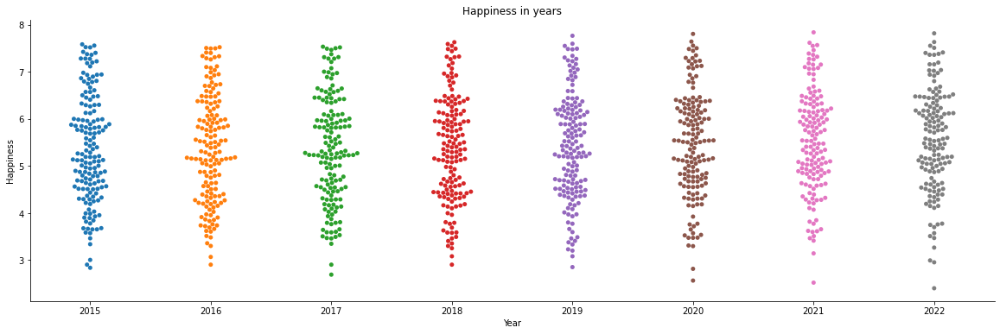

In [28]:
plt.figure(figsize=(20, 6))
sns.swarmplot(x='Year', y='Happiness', data=whr).set(title='Happiness in years')
plt.show()

Powyższy wykres bazujący na World Happiness Reports z lat 2015-2022 pokazuje, że poziom globalnego szczęscia nie wykazuje większych odchyleń. 

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

**Usunięcie niepotrzebnych znaków z nazw krajów, ujednolicenie nazw krajów, usunięcie ostatniego wiersza.**

In [29]:
whr["Country"].unique()

array(['Switzerland', 'Iceland', 'Denmark', 'Norway', 'Canada', 'Finland',
       'Netherlands', 'Sweden', 'New Zealand', 'Australia', 'Israel',
       'Costa Rica', 'Austria', 'Mexico', 'United States', 'Brazil',
       'Luxembourg', 'Ireland', 'Belgium', 'United Arab Emirates',
       'United Kingdom', 'Oman', 'Venezuela', 'Singapore', 'Panama',
       'Germany', 'Chile', 'Qatar', 'France', 'Argentina',
       'Czech Republic', 'Uruguay', 'Colombia', 'Thailand',
       'Saudi Arabia', 'Spain', 'Malta', 'Taiwan', 'Kuwait', 'Suriname',
       'Trinidad and Tobago', 'El Salvador', 'Guatemala', 'Uzbekistan',
       'Slovakia', 'Japan', 'South Korea', 'Ecuador', 'Bahrain', 'Italy',
       'Bolivia', 'Moldova', 'Paraguay', 'Kazakhstan', 'Slovenia',
       'Lithuania', 'Nicaragua', 'Peru', 'Belarus', 'Poland', 'Malaysia',
       'Croatia', 'Libya', 'Russia', 'Jamaica', 'North Cyprus', 'Cyprus',
       'Algeria', 'Kosovo', 'Turkmenistan', 'Mauritius', 'Hong Kong',
       'Estonia', 'Indonesi

In [30]:
whr.Country.str.count("Congo").sum()

14

In [31]:
whr.Country.str.count("Brazzaville").sum()

7

In [32]:
whr.Country.str.count("Kinshasa").sum()

6

In [33]:
whr["Country"] = whr["Country"].str.replace("*","")
whr["Country"] = whr["Country"].replace('Czechia','Czech Republic', regex=True)
whr["Country"] = whr["Country"].replace('Hong Kong S.A.R., China','Hong Kong', regex=True)
whr["Country"] = whr["Country"].replace('Hong Kong S.A.R. of China','Hong Kong', regex=True)
whr["Country"] = whr["Country"].replace('Northern Cyprus','North Cyprus', regex=True)
whr["Country"] = whr["Country"].replace('Somaliland region','Somaliland Region', regex=True)
whr["Country"] = whr["Country"].replace('Taiwan Province of China','Taiwan', regex=True)
whr["Country"] = whr["Country"].replace('Trinidad & Tobago','Trinidad and Tobago', regex=True)
whr["Country"].unique()

array(['Switzerland', 'Iceland', 'Denmark', 'Norway', 'Canada', 'Finland',
       'Netherlands', 'Sweden', 'New Zealand', 'Australia', 'Israel',
       'Costa Rica', 'Austria', 'Mexico', 'United States', 'Brazil',
       'Luxembourg', 'Ireland', 'Belgium', 'United Arab Emirates',
       'United Kingdom', 'Oman', 'Venezuela', 'Singapore', 'Panama',
       'Germany', 'Chile', 'Qatar', 'France', 'Argentina',
       'Czech Republic', 'Uruguay', 'Colombia', 'Thailand',
       'Saudi Arabia', 'Spain', 'Malta', 'Taiwan', 'Kuwait', 'Suriname',
       'Trinidad and Tobago', 'El Salvador', 'Guatemala', 'Uzbekistan',
       'Slovakia', 'Japan', 'South Korea', 'Ecuador', 'Bahrain', 'Italy',
       'Bolivia', 'Moldova', 'Paraguay', 'Kazakhstan', 'Slovenia',
       'Lithuania', 'Nicaragua', 'Peru', 'Belarus', 'Poland', 'Malaysia',
       'Croatia', 'Libya', 'Russia', 'Jamaica', 'North Cyprus', 'Cyprus',
       'Algeria', 'Kosovo', 'Turkmenistan', 'Mauritius', 'Hong Kong',
       'Estonia', 'Indonesi

In [34]:
whr['Country'] =  whr['Country'].apply(lambda x: x.replace('(','').replace(')',''))
whr["Country"] = whr["Country"].replace(' Kinshasa','', regex=True)

In [35]:
whr.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176


In [36]:
whr=whr.drop(whr.index[-1])

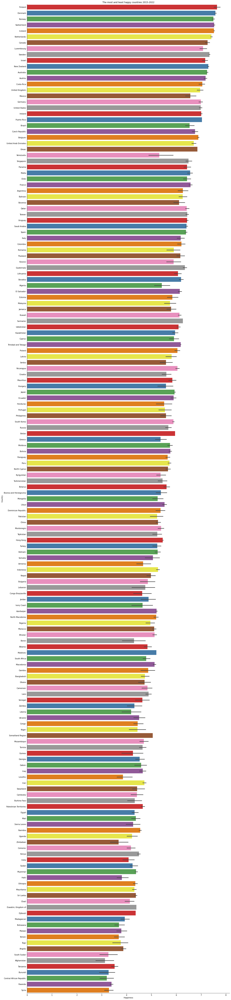

In [37]:
plt.figure(figsize = (20,100))

plt.title("The most and least happy countries 2015-2022")
sns.barplot(x = "Happiness", y = "Country", data = whr.sort_values(('Happiness'), ascending = (False)), palette = "Set1")
plt.show()

Powyższy wykres obrazuje poziom szczęśliwości od wartości najwyższych do najniższych.

In [38]:
fig = px.choropleth(whr.sort_values("Year"), 
                    locations = "Country", 
                    color = "Happiness",
                    locationmode = "country names",
                    animation_frame = "Year")
fig.update_layout(title = "Happiness by Countries")
fig.show()

Powyższa mapa obrazuje zmiany poziomu zadowolenia w poszczególnych krajach w latach 2015-2022.

In [39]:
fig = px.sunburst(data_frame=whr,
                  path=["Country"],
                  values="Happiness",
                  color="Happiness",
                  width=900, 
                  height=900)
fig.show()

In [40]:
%%html
<div class='tableauPlaceholder' id='viz1655659489658' style='position: relative'><noscript><a href='#'><img alt='Dashboard 1 ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;5N&#47;5N3XZ67XH&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='path' value='shared&#47;5N3XZ67XH' /> <param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;5N&#47;5N3XZ67XH&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1655659489658');                    var vizElement = divElement.getElementsByTagName('object')[0];                    if ( divElement.offsetWidth > 800 ) { vizElement.style.width='950px';vizElement.style.minHeight='727px';vizElement.style.maxHeight='1107px';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';} else if ( divElement.offsetWidth > 500 ) { vizElement.style.width='950px';vizElement.style.minHeight='727px';vizElement.style.maxHeight='1107px';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';} else { vizElement.style.width='100%';vizElement.style.height='1027px';}                     var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

Interaktywny dashboard z danymi z World Happiness Report (2015-2022)

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

**Dodanie danych określających dostęp do szerokopasmowego internetu.**

In [41]:
internet_coverage = pd.read_csv("broadband-penetration-by-country.csv")
internet_coverage.drop(['Code'], axis=1, inplace=True)

In [42]:
internet_coverage.head(3)

,Entity,Year,Fixed broadband subscriptions (per 100 people)
0,Afghanistan,2004,0.000809
1,Afghanistan,2005,0.000858
2,Afghanistan,2006,0.001892


In [43]:
internet_coverage.rename({'Entity': 'Country', 'Fixed broadband subscriptions (per 100 people)': 'Broadband'}, 
                         axis=1, inplace=True)

In [44]:
internet_coverage.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4175 entries, 0 to 4174
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Country    4175 non-null   object 
 1   Year       4175 non-null   int64  
 2   Broadband  4175 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 98.0+ KB


In [45]:
whr = pd.merge(whr, internet_coverage, on=['Year', 'Country'], how='left')

In [46]:
whr.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738,44.602427
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201,37.680133
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204,42.276164
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531,39.433167
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176,36.404624


In [47]:
internet_coverage.rename({'Broadband': 'BB'}, 
                         axis=1, inplace=True)
broadband_2015_2019=internet_coverage.groupby(["Country"])[["BB"]].median()
broadband_2015_2019['Year']=2020
whr = pd.merge(whr, broadband_2015_2019, on=['Year','Country'], how='left')
whr['Broadband'] = whr['Broadband'].fillna(whr['BB'])
whr.drop(['BB'], axis=1, inplace=True)
whr.loc[whr['Year']==2020]

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband
782,2020,Finland,7.8087,1.285190,1.499526,0.961271,0.662317,0.159670,0.477857,2.762835,30.106196
783,2020,Denmark,7.6456,1.326949,1.503449,0.979333,0.665040,0.242793,0.495260,2.432741,37.314551
784,2020,Switzerland,7.5599,1.390774,1.472403,1.040533,0.628954,0.269056,0.407946,2.350267,36.423566
785,2020,Iceland,7.5045,1.326502,1.547567,1.000843,0.661981,0.362330,0.144541,2.460688,34.093804
786,2020,Norway,7.4880,1.424207,1.495173,1.008072,0.670201,0.287985,0.434101,2.168266,34.916832
...,...,...,...,...,...,...,...,...,...,...,...
930,2020,Central African Republic,3.4759,0.041072,0.000000,0.000000,0.292814,0.253513,0.028265,2.860198,0.013637
931,2020,Rwanda,3.3123,0.343243,0.522876,0.572383,0.604088,0.235705,0.485542,0.548445,0.033344
932,2020,Zimbabwe,3.2992,0.425564,1.047835,0.375038,0.377405,0.151349,0.080929,0.841031,0.263682
933,2020,South Sudan,2.8166,0.289083,0.553279,0.208809,0.065609,0.209935,0.111157,1.378751,0.001175


In [48]:
temp_whr = whr.copy()
temp_whr.rename({'Broadband': 'BB'}, 
                         axis=1, inplace=True)
broadband_2015_2020=temp_whr.groupby(["Country"])[["BB"]].median()
broadband_2015_2020['Year']=2021
whr = pd.merge(whr, broadband_2015_2020, on=['Year', 'Country'], how='left')
whr['Broadband'] = whr['Broadband'].fillna(whr['BB'])
whr.drop(['BB'], axis=1, inplace=True)
whr.loc[whr['Year']==2021]

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband
935,2021,Finland,7.842,1.446,1.106,0.741,0.691,0.124,0.481,3.253,31.296467
936,2021,Denmark,7.620,1.502,1.108,0.763,0.686,0.208,0.485,2.868,43.458250
937,2021,Switzerland,7.571,1.566,1.079,0.816,0.653,0.204,0.413,2.839,45.307265
938,2021,Iceland,7.554,1.482,1.172,0.772,0.698,0.293,0.170,2.967,39.398224
939,2021,Netherlands,7.464,1.501,1.079,0.753,0.647,0.302,0.384,2.798,42.679894
...,...,...,...,...,...,...,...,...,...,...,...
1079,2021,Lesotho,3.512,0.451,0.731,0.007,0.405,0.103,0.015,1.800,0.230501
1080,2021,Botswana,3.467,1.099,0.724,0.340,0.539,0.027,0.088,0.648,1.756953
1081,2021,Rwanda,3.415,0.364,0.202,0.407,0.627,0.227,0.493,1.095,0.126077
1082,2021,Zimbabwe,3.145,0.457,0.649,0.243,0.359,0.157,0.075,1.205,1.266664


In [49]:
whr.head(3)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738,44.602427
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201,37.680133
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204,42.276164


In [50]:
temp_whr = whr.copy()
temp_whr.rename({'Broadband': 'BB'}, 
                         axis=1, inplace=True)
broadband_2015_2021=temp_whr.groupby(["Country"])[["BB"]].median()
broadband_2015_2021['Year']=2022
whr=pd.merge(whr, broadband_2015_2021, on=['Year', 'Country'], how='left')
whr['Broadband'] = whr['Broadband'].fillna(whr['BB'])
whr.drop(['BB'], axis=1, inplace=True)
whr.loc[whr['Year']==2022]

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband
1084,2022,Finland,7.821,1.892,1.258,0.775,0.736,0.109,0.534,2.518,31.296467
1085,2022,Denmark,7.636,1.953,1.243,0.777,0.719,0.188,0.532,2.226,43.458250
1086,2022,Iceland,7.557,1.936,1.320,0.803,0.718,0.270,0.191,2.320,39.398224
1087,2022,Switzerland,7.512,2.026,1.226,0.822,0.677,0.147,0.461,2.153,45.307265
1088,2022,Netherlands,7.415,1.945,1.206,0.787,0.651,0.271,0.419,2.137,42.679894
...,...,...,...,...,...,...,...,...,...,...,...
1225,2022,Botswana,3.471,1.503,0.815,0.280,0.571,0.012,0.102,0.187,1.756953
1226,2022,Rwanda,3.268,0.785,0.133,0.462,0.621,0.187,0.544,0.536,0.126077
1227,2022,Zimbabwe,2.995,0.947,0.690,0.270,0.329,0.106,0.105,0.548,1.266664
1228,2022,Lebanon,2.955,1.392,0.498,0.631,0.103,0.082,0.034,0.216,4.611091


Dodano dodatkową cechę - dostęp do szerokopasmowego internetu. Ze względu na to, że nie było danych za lata 2020 - 2022. Wyznaczono je, obliczając medainę z lat gdzie wartości występują (dla każdego kraju osobno) i na przykład dla roku 2020 wartość równa się medianie wartości z lat 2015 - 2019, dla roku 2021 wartość równa się medianie z lat 2015 - 2020. Tak samo jest dla lat następnych.

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

**Dodanie danych - % populacji indywidualnie używającej internet.**

In [51]:
internet_individuals = pd.read_csv("internet_individuals.csv")
internet_individuals.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Country Name  266 non-null    object 
 1   2015          248 non-null    float64
 2   2016          251 non-null    float64
 3   2017          253 non-null    float64
 4   2018          209 non-null    float64
 5   2019          203 non-null    float64
 6   2020          197 non-null    float64
dtypes: float64(6), object(1)
memory usage: 14.7+ KB


In [52]:
internet_individuals_2015 = internet_individuals.copy()
internet_individuals_2015.drop(['2016','2017','2018','2019','2020'], axis=1, inplace=True)
internet_individuals_2015.rename({'Country Name': 'Country', '2015': 'Internet individuals'}, axis=1, inplace=True)
internet_individuals_2015['Year']=2015

internet_individuals_2016 = internet_individuals.copy()
internet_individuals_2016.drop(['2015','2017','2018','2019','2020'], axis=1, inplace=True)
internet_individuals_2016.rename({'Country Name': 'Country', '2016': 'Internet individuals'}, axis=1, inplace=True)
internet_individuals_2016['Year']=2016

internet_individuals_2017 = internet_individuals.copy()
internet_individuals_2017.drop(['2015','2016','2018','2019','2020'], axis=1, inplace=True)
internet_individuals_2017.rename({'Country Name': 'Country', '2017': 'Internet individuals'}, axis=1, inplace=True)
internet_individuals_2017['Year']=2017

internet_individuals_2018 = internet_individuals.copy()
internet_individuals_2018.drop(['2015','2016','2017','2019','2020'], axis=1, inplace=True)
internet_individuals_2018.rename({'Country Name': 'Country', '2018': 'Internet individuals'}, axis=1, inplace=True)
internet_individuals_2018['Year']=2018

internet_individuals_2019 = internet_individuals.copy()
internet_individuals_2019.drop(['2015','2016','2017','2018','2020'], axis=1, inplace=True)
internet_individuals_2019.rename({'Country Name': 'Country', '2019': 'Internet individuals'}, axis=1, inplace=True)
internet_individuals_2019['Year']=2019

internet_individuals_2020 = internet_individuals.copy()
internet_individuals_2020.drop(['2015','2016','2017','2018','2019'], axis=1, inplace=True)
internet_individuals_2020.rename({'Country Name': 'Country', '2020': 'Internet individuals'}, axis=1, inplace=True)
internet_individuals_2020['Year']=2020

new_internet_inidividuals = internet_individuals_2015.copy()
new_internet_inidividuals.append(internet_individuals_2016, ignore_index=True)
new_internet_inidividuals.append(internet_individuals_2017, ignore_index=True)
new_internet_inidividuals.append(internet_individuals_2018, ignore_index=True)
new_internet_inidividuals.append(internet_individuals_2019, ignore_index=True)
new_internet_inidividuals.append(internet_individuals_2020, ignore_index=True)

,Country,Internet individuals,Year
0,Aruba,88.661227,2015
1,Africa Eastern and Southern,14.625664,2015
2,Afghanistan,8.260000,2015
3,Africa Western and Central,18.192287,2015
4,Angola,22.000000,2015
...,...,...,...
527,Kosovo,NaN,2020
528,"Yemen, Rep.",NaN,2020
529,South Africa,70.000000,2020
530,Zambia,19.800000,2020


In [53]:
whr = pd.merge(whr, new_internet_inidividuals, on=['Year', 'Country'], how='left')

In [54]:
new_internet_inidividuals.rename({'Internet individuals': 'II'}, 
                         axis=1, inplace=True)
internet_inidividuals_2015_2019 = new_internet_inidividuals.groupby(["Country"])[["II"]].median()
internet_inidividuals_2015_2019['Year']=2020
whr = pd.merge(whr, internet_inidividuals_2015_2019, on=['Year','Country'], how='left')
whr['Internet individuals'] = whr['Internet individuals'].fillna(whr['II'])
whr.drop(['II'], axis=1, inplace=True)
whr.loc[whr['Year']==2020]

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals
782,2020,Finland,7.8087,1.285190,1.499526,0.961271,0.662317,0.159670,0.477857,2.762835,30.106196,86.422133
783,2020,Denmark,7.6456,1.326949,1.503449,0.979333,0.665040,0.242793,0.495260,2.432741,37.314551,96.330502
784,2020,Switzerland,7.5599,1.390774,1.472403,1.040533,0.628954,0.269056,0.407946,2.350267,36.423566,87.479056
785,2020,Iceland,7.5045,1.326502,1.547567,1.000843,0.661981,0.362330,0.144541,2.460688,34.093804,98.200000
786,2020,Norway,7.4880,1.424207,1.495173,1.008072,0.670201,0.287985,0.434101,2.168266,34.916832,96.810326
...,...,...,...,...,...,...,...,...,...,...,...,...
930,2020,Central African Republic,3.4759,0.041072,0.000000,0.000000,0.292814,0.253513,0.028265,2.860198,0.013637,2.900000
931,2020,Rwanda,3.3123,0.343243,0.522876,0.572383,0.604088,0.235705,0.485542,0.548445,0.033344,18.000000
932,2020,Zimbabwe,3.2992,0.425564,1.047835,0.375038,0.377405,0.151349,0.080929,0.841031,0.263682,22.742818
933,2020,South Sudan,2.8166,0.289083,0.553279,0.208809,0.065609,0.209935,0.111157,1.378751,0.001175,3.000000


In [55]:
temp_II = whr.copy()
temp_II.rename({'Internet individuals': 'II'}, 
                         axis=1, inplace=True)
internet_inidividuals_2015_2020=temp_II.groupby(["Country"])[["II"]].median()
internet_inidividuals_2015_2020['Year']=2021
whr = pd.merge(whr, internet_inidividuals_2015_2020, on=['Year','Country'], how='left')
whr['Internet individuals'] = whr['Internet individuals'].fillna(whr['II'])
whr.drop(['II'], axis=1, inplace=True)
whr.loc[whr['Year']==2021]

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals
935,2021,Finland,7.842,1.446,1.106,0.741,0.691,0.124,0.481,3.253,31.296467,86.422133
936,2021,Denmark,7.620,1.502,1.108,0.763,0.686,0.208,0.485,2.868,43.458250,96.330502
937,2021,Switzerland,7.571,1.566,1.079,0.816,0.653,0.204,0.413,2.839,45.307265,87.479056
938,2021,Iceland,7.554,1.482,1.172,0.772,0.698,0.293,0.170,2.967,39.398224,98.200000
939,2021,Netherlands,7.464,1.501,1.079,0.753,0.647,0.302,0.384,2.798,42.679894,91.724138
...,...,...,...,...,...,...,...,...,...,...,...,...
1079,2021,Lesotho,3.512,0.451,0.731,0.007,0.405,0.103,0.015,1.800,0.230501,25.000000
1080,2021,Botswana,3.467,1.099,0.724,0.340,0.539,0.027,0.088,0.648,1.756953,37.312050
1081,2021,Rwanda,3.415,0.364,0.202,0.407,0.627,0.227,0.493,1.095,0.126077,18.000000
1082,2021,Zimbabwe,3.145,0.457,0.649,0.243,0.359,0.157,0.075,1.205,1.266664,22.742818


In [56]:
temp_II = whr.copy()
temp_II.rename({'Internet individuals': 'II'}, 
                         axis=1, inplace=True)
internet_inidividuals_2015_2021=temp_II.groupby(["Country"])[["II"]].median()
internet_inidividuals_2015_2021['Year']=2022
whr = pd.merge(whr, internet_inidividuals_2015_2021, on=['Year', 'Country'], how='left')
whr['Internet individuals'] = whr['Internet individuals'].fillna(whr['II'])
whr.drop(['II'], axis=1, inplace=True)
whr.loc[whr['Year']==2022]

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals
1084,2022,Finland,7.821,1.892,1.258,0.775,0.736,0.109,0.534,2.518,31.296467,86.422133
1085,2022,Denmark,7.636,1.953,1.243,0.777,0.719,0.188,0.532,2.226,43.458250,96.330502
1086,2022,Iceland,7.557,1.936,1.320,0.803,0.718,0.270,0.191,2.320,39.398224,98.200000
1087,2022,Switzerland,7.512,2.026,1.226,0.822,0.677,0.147,0.461,2.153,45.307265,87.479056
1088,2022,Netherlands,7.415,1.945,1.206,0.787,0.651,0.271,0.419,2.137,42.679894,91.724138
...,...,...,...,...,...,...,...,...,...,...,...,...
1225,2022,Botswana,3.471,1.503,0.815,0.280,0.571,0.012,0.102,0.187,1.756953,37.312050
1226,2022,Rwanda,3.268,0.785,0.133,0.462,0.621,0.187,0.544,0.536,0.126077,18.000000
1227,2022,Zimbabwe,2.995,0.947,0.690,0.270,0.329,0.106,0.105,0.548,1.266664,22.742818
1228,2022,Lebanon,2.955,1.392,0.498,0.631,0.103,0.082,0.034,0.216,4.611091,74.000000


Dodano dodatkową cechę - indywidualny dostęp do internetu. Ze względu na to, że nie było danych za lata 2020 - 2022. Wyznaczono je, obliczając średnią wartość dla lat 2015 - 2019 (dla każdego kraju osobno) i na przykład dla roku 2020 wartość równa się wartości dla roku 2019 plus wyznaczona wcześniej średnia. Tak samo jest dla lat następnych.


![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

**Zestawienie wartości NaN w kolumnach zbioru whr.**

In [57]:
summary = pd.DataFrame(whr.dtypes, columns=['Dtype'])
summary['Nulls'] = pd.DataFrame(whr.isnull().any())
summary['Sum_of_nulls'] = pd.DataFrame(whr.isnull().sum())
summary['Per_of_nulls'] = round((whr.apply(pd.isnull).mean()*100), 2)
summary.Dtype = summary.Dtype.astype(str)
summary

,Dtype,Nulls,Sum_of_nulls,Per_of_nulls
Year,int64,False,0,0.00
Country,object,False,0,0.00
Happiness,float64,False,0,0.00
GDP per capita,float64,False,0,0.00
Social support,float64,False,0,0.00
Life Exp,float64,False,0,0.00
Freedom,float64,False,0,0.00
Generosity,float64,False,0,0.00
Gov Corruption,float64,True,1,0.08
Dystopia Residual,float64,False,0,0.00


W dziewięciu kolumnach znajdują się puste wartości: Happiness, GDP per capita, Social support, Life Exp, Freedom, Generosity, Gov Corruption, Dystopia Residual

W siedmiu pierwszych kolumnach jest tych wartości zdecydowana mniejszość ( jedna lub dwie).

Dla ośmiu pierwszych kolumn zamieniamy brakujące dane na wartość najczęściej występującą - mode.

In [58]:
mode_Happiness = whr['Happiness'].mode()[0]
mode_GDP_per_capita = whr['GDP per capita'].mode()[0]
mode_Social_support = whr['Social support'].mode()[0]
mode_Life_Exp = whr['Life Exp'].mode()[0]
mode_Freedom = whr['Freedom'].mode()[0]
mode_Generosity = whr['Generosity'].mode()[0]
mode_Gov_Corruption = whr['Gov Corruption'].mode()[0]
mode_Dystopia_Residual = whr['Dystopia Residual'].mode()[0]
mode_Broadband = whr['Broadband'].mode()[0]
mean_InternetIndividuals = whr['Internet individuals'].mean()

In [59]:
whr['Happiness'] = whr['Happiness'].fillna(mode_Happiness)
whr['GDP per capita'] = whr['GDP per capita'].fillna(mode_GDP_per_capita)
whr['Social support'] = whr['Social support'].fillna(mode_Social_support)
whr['Life Exp'] = whr['Life Exp'].fillna(mode_Life_Exp)
whr['Freedom'] = whr['Freedom'].fillna(mode_Freedom)
whr['Generosity'] = whr['Generosity'].fillna(mode_Generosity)
whr['Gov Corruption'] = whr['Gov Corruption'].fillna(mode_Gov_Corruption)
whr['Dystopia Residual'] = whr['Dystopia Residual'].fillna(mode_Dystopia_Residual)
whr['Broadband'] = whr['Broadband'].fillna(mode_Broadband)
whr['Internet individuals'] = whr['Internet individuals'].fillna(mean_InternetIndividuals)

In [60]:
summary = pd.DataFrame(whr.dtypes, columns=['Dtype'])
summary['Nulls'] = pd.DataFrame(whr.isnull().any())
summary['Sum_of_nulls'] = pd.DataFrame(whr.isnull().sum())
summary['Per_of_nulls'] = round((whr.apply(pd.isnull).mean()*100), 2)
summary.Dtype = summary.Dtype.astype(str)
summary

,Dtype,Nulls,Sum_of_nulls,Per_of_nulls
Year,int64,False,0,0.0
Country,object,False,0,0.0
Happiness,float64,False,0,0.0
GDP per capita,float64,False,0,0.0
Social support,float64,False,0,0.0
Life Exp,float64,False,0,0.0
Freedom,float64,False,0,0.0
Generosity,float64,False,0,0.0
Gov Corruption,float64,False,0,0.0
Dystopia Residual,float64,False,0,0.0


![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

Afghanistan


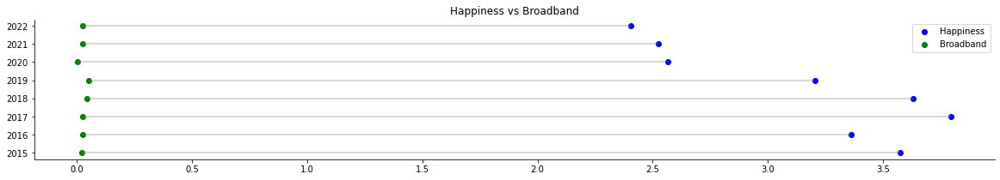

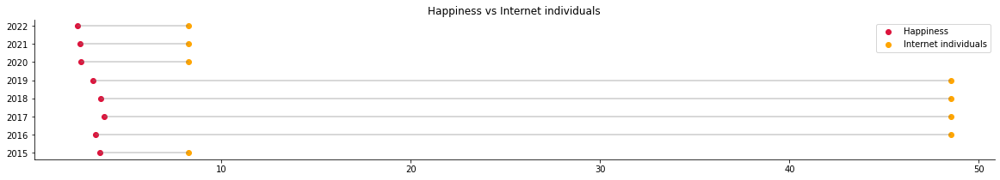

_________________________________________________________________________________________
 
Albania


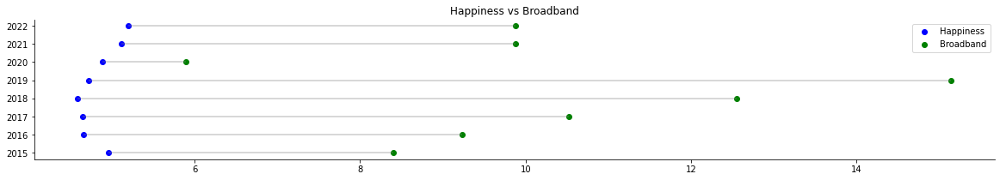

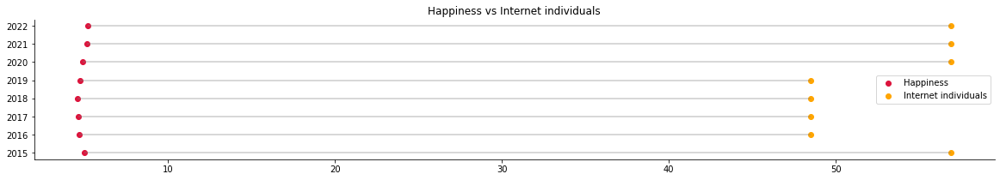

_________________________________________________________________________________________
 
Algeria


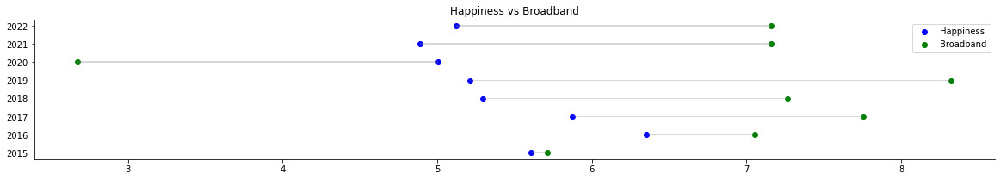

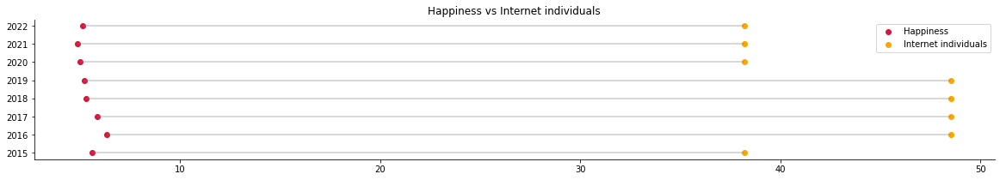

_________________________________________________________________________________________
 
Angola


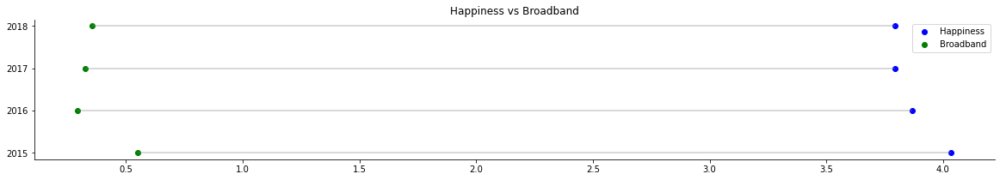

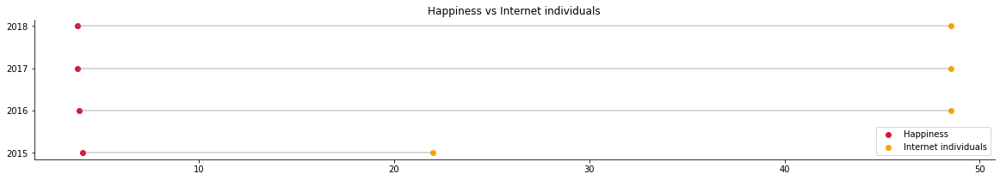

_________________________________________________________________________________________
 
Argentina


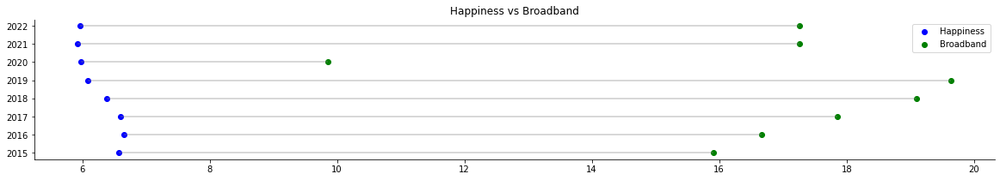

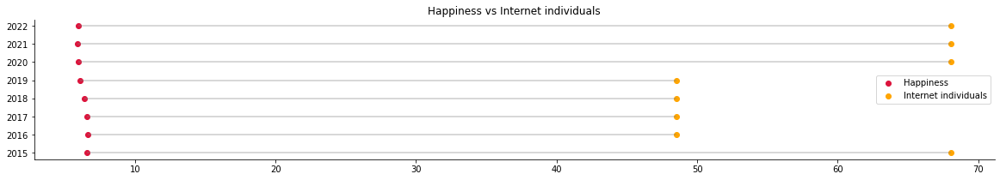

_________________________________________________________________________________________
 
Armenia


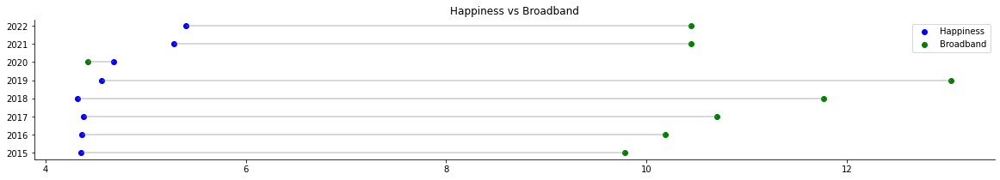

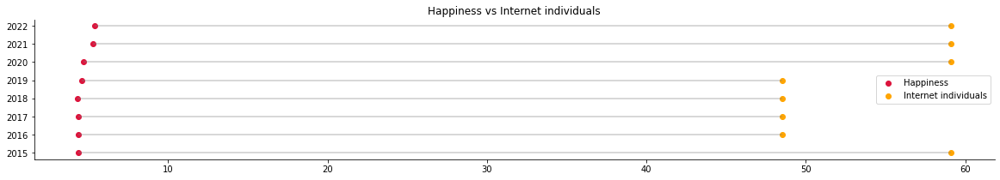

_________________________________________________________________________________________
 
Australia


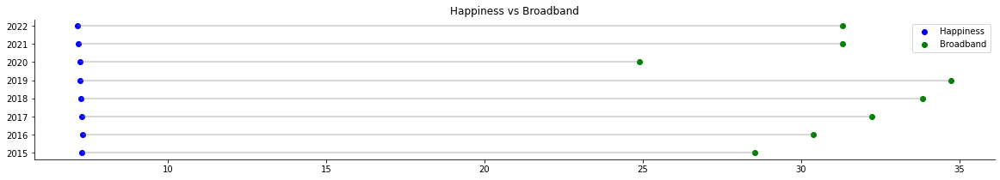

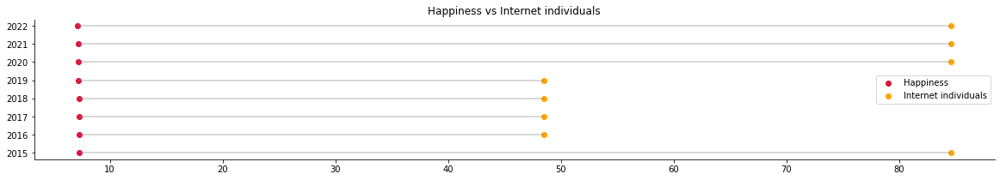

_________________________________________________________________________________________
 
Austria


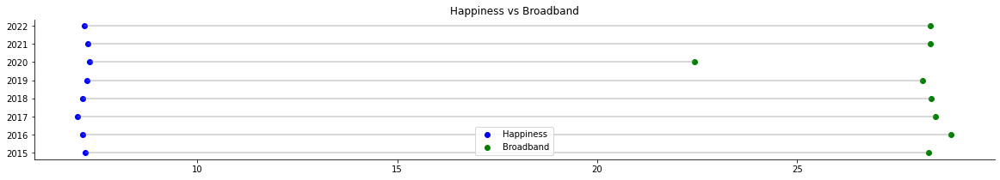

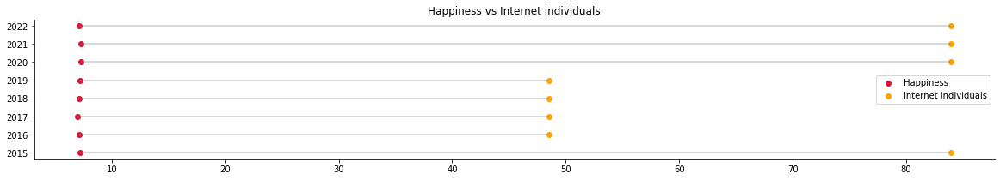

_________________________________________________________________________________________
 
Azerbaijan


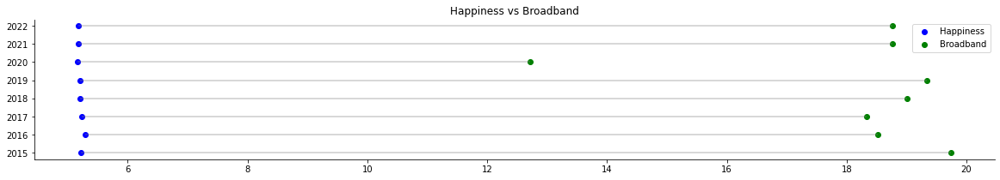

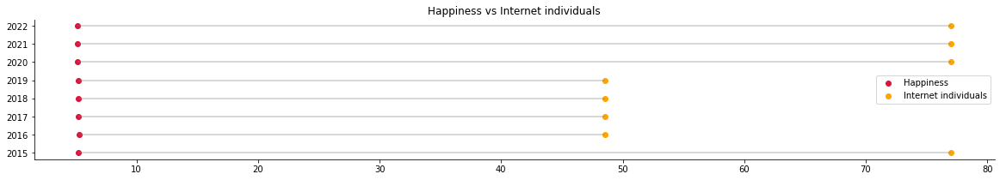

_________________________________________________________________________________________
 
Bahrain


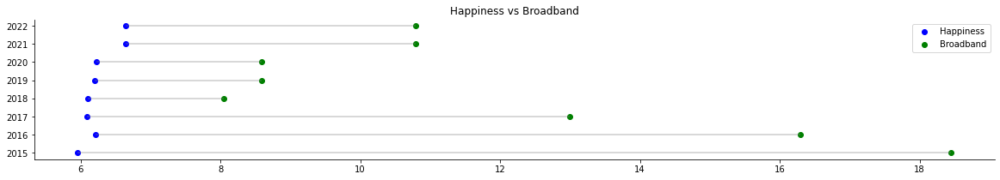

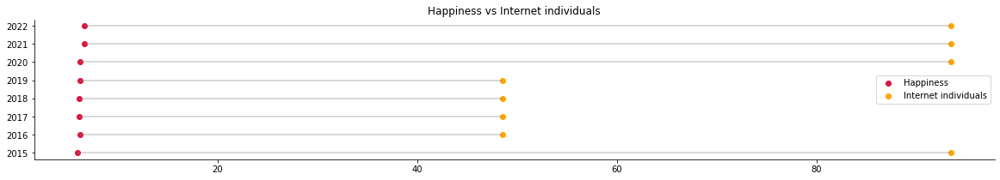

_________________________________________________________________________________________
 
Bangladesh


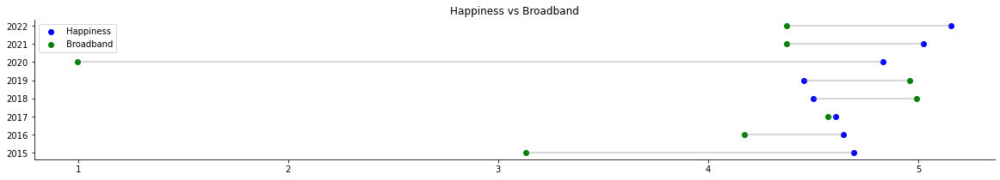

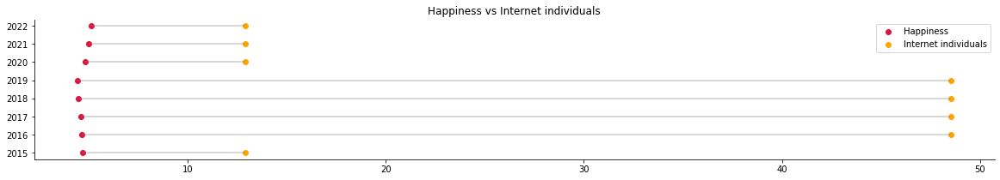

_________________________________________________________________________________________
 
Belarus


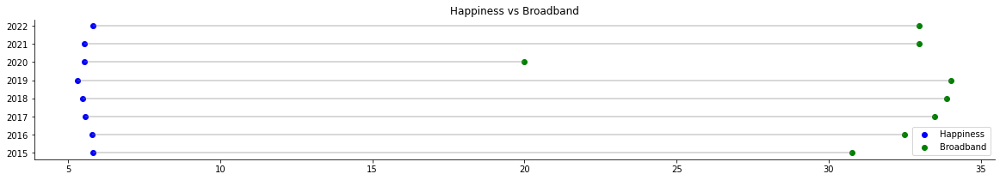

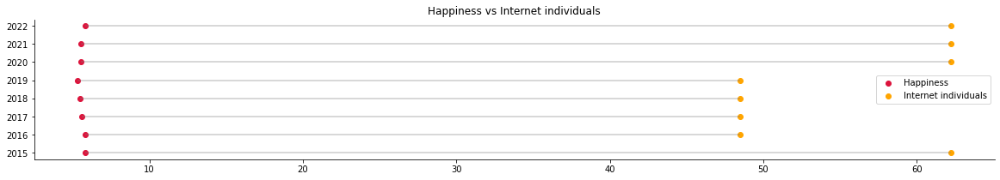

_________________________________________________________________________________________
 
Belgium


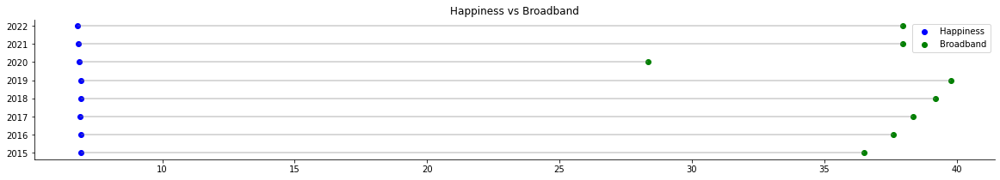

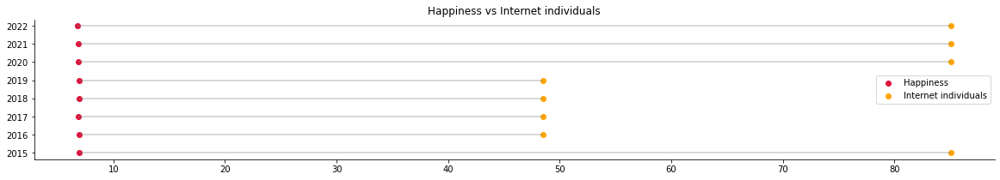

_________________________________________________________________________________________
 
Belize


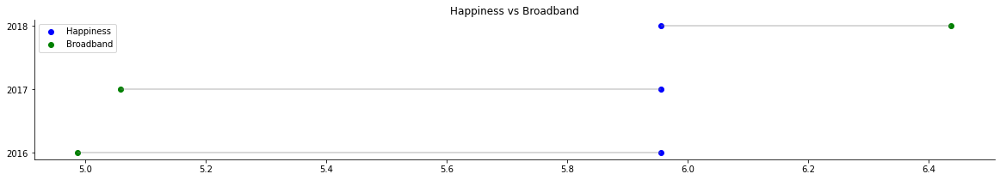

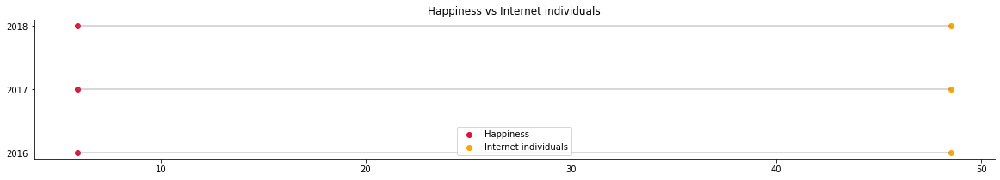

_________________________________________________________________________________________
 
Benin


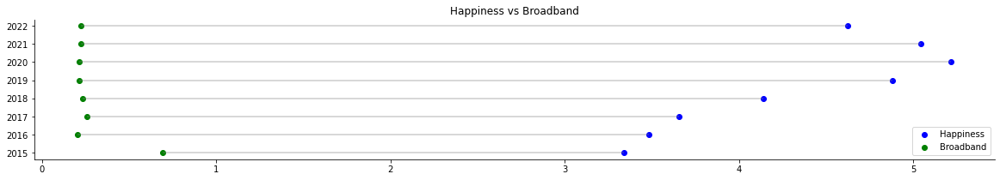

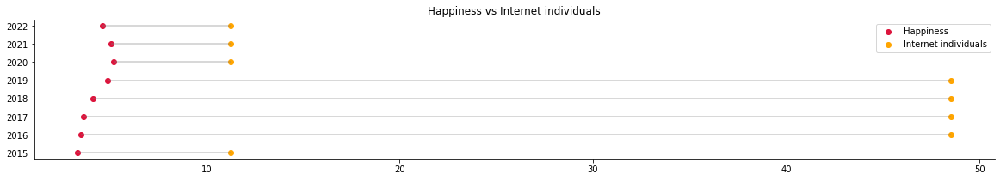

_________________________________________________________________________________________
 
Bhutan


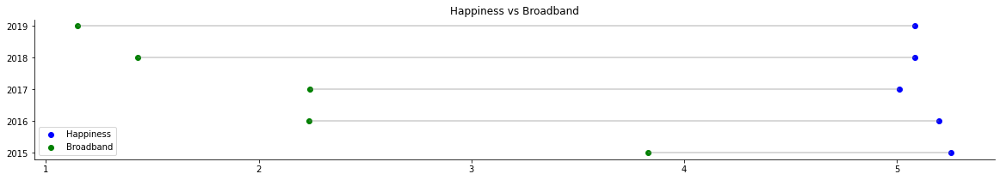

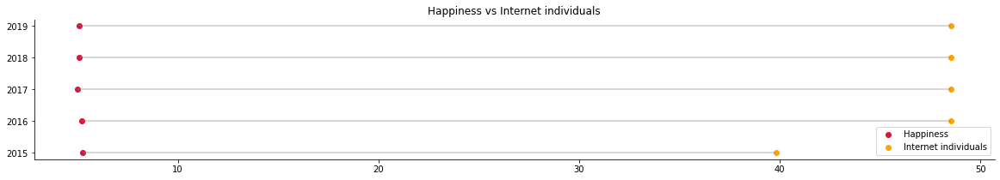

_________________________________________________________________________________________
 
Bolivia


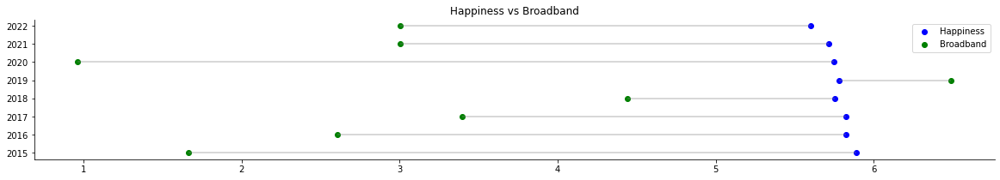

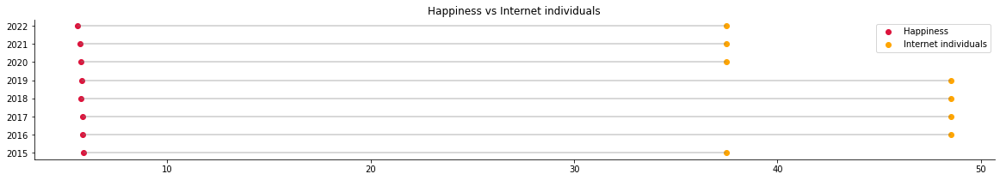

_________________________________________________________________________________________
 
Bosnia and Herzegovina


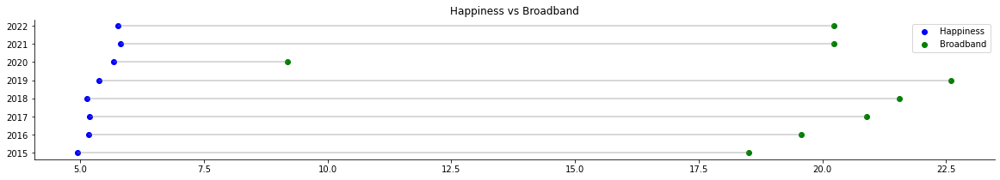

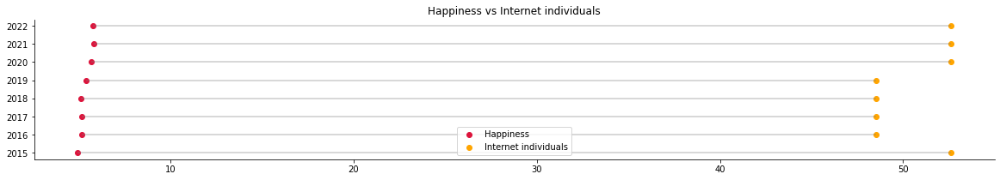

_________________________________________________________________________________________
 
Botswana


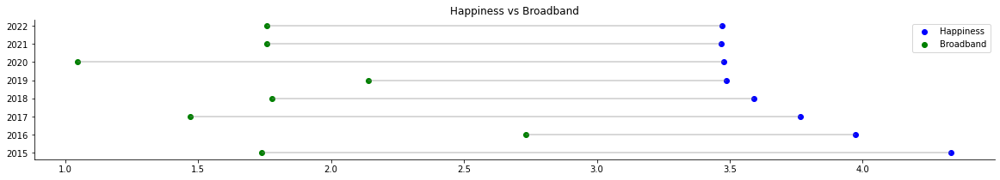

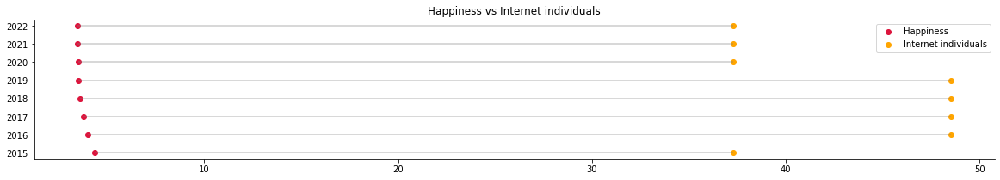

_________________________________________________________________________________________
 
Brazil


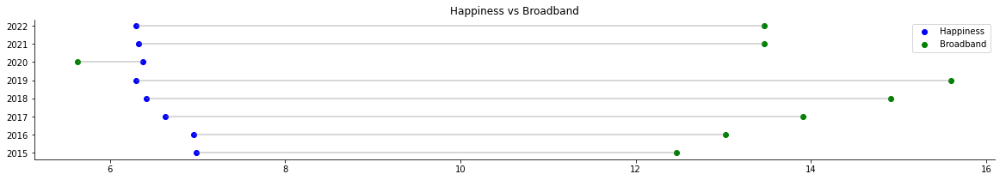

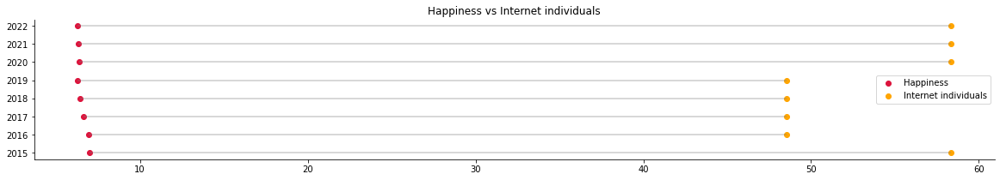

_________________________________________________________________________________________
 
Bulgaria


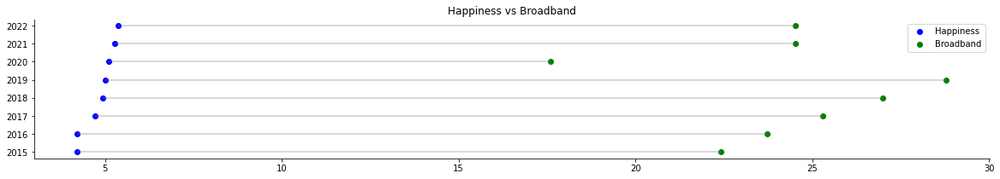

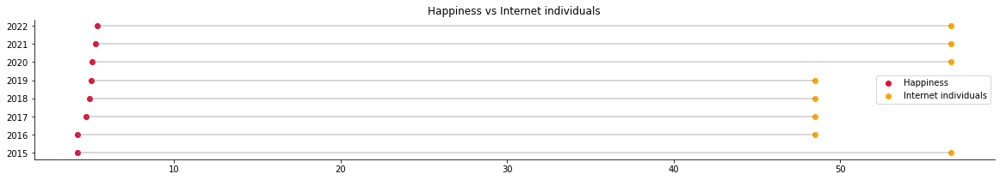

_________________________________________________________________________________________
 
Burkina Faso


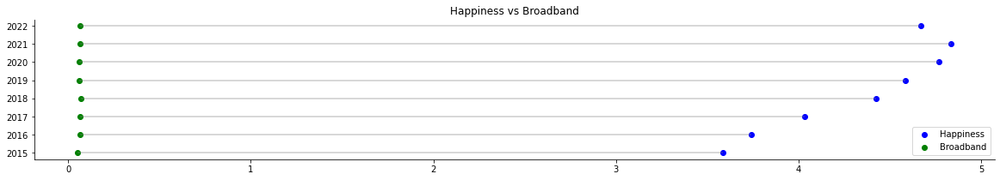

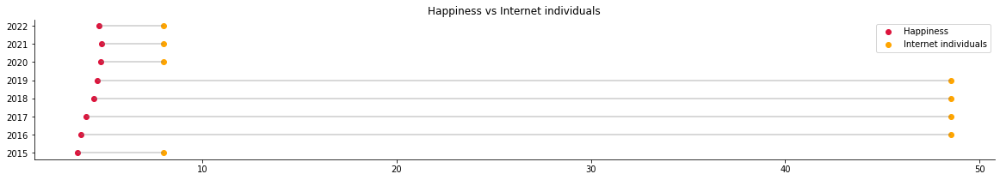

_________________________________________________________________________________________
 
Burundi


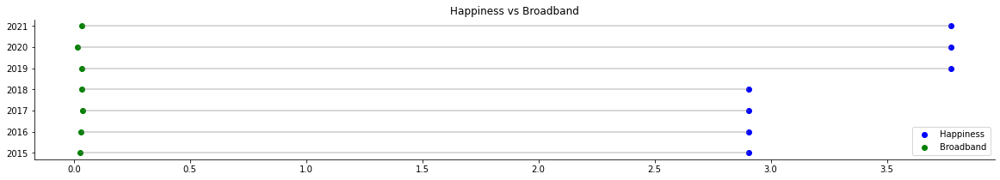

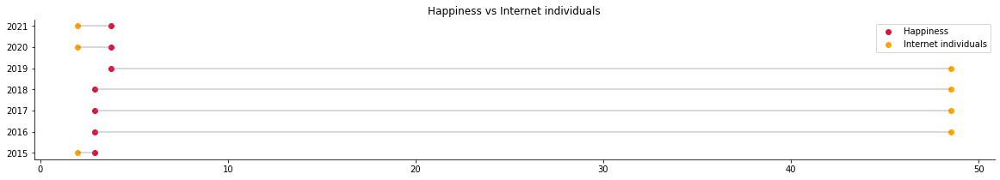

_________________________________________________________________________________________
 
Cambodia


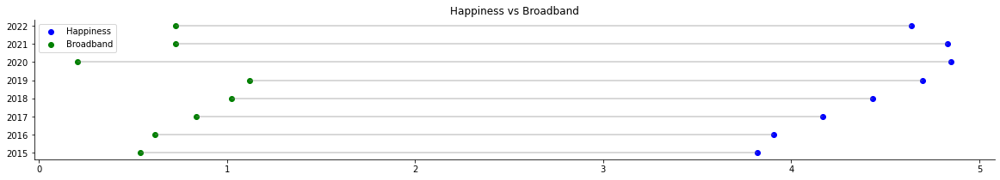

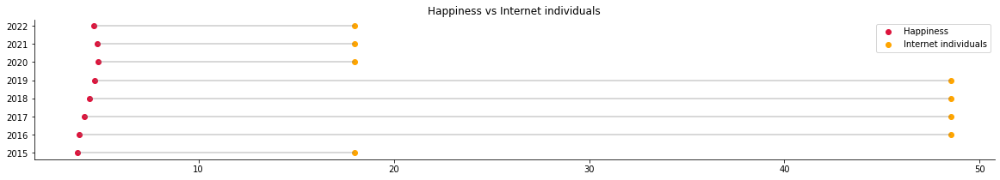

_________________________________________________________________________________________
 
Cameroon


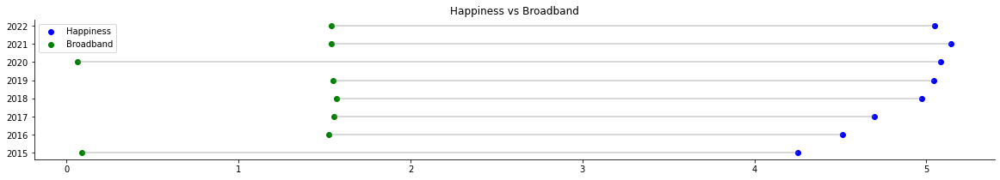

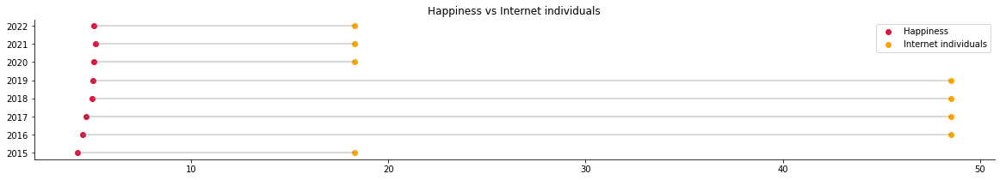

_________________________________________________________________________________________
 
Canada


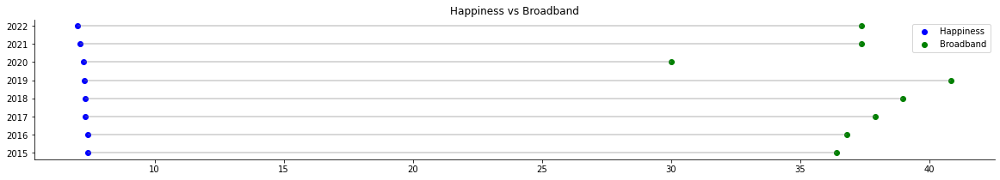

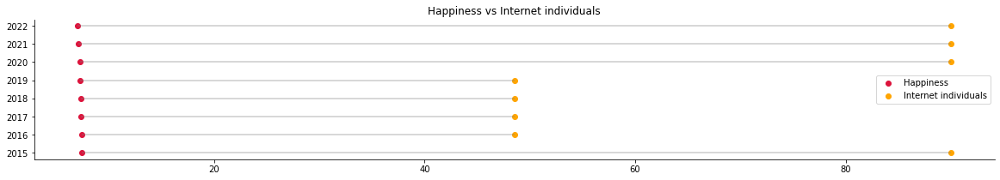

_________________________________________________________________________________________
 
Central African Republic


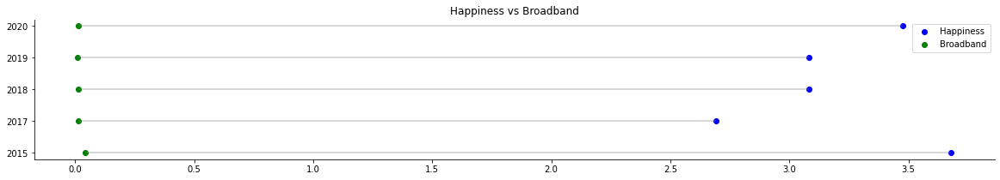

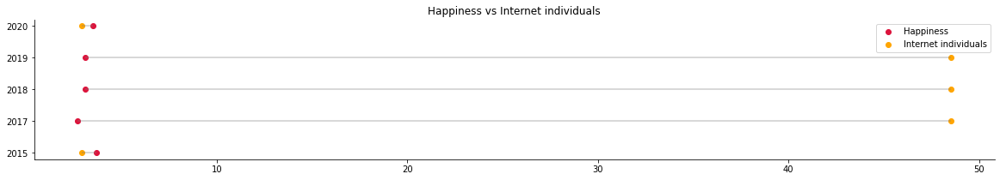

_________________________________________________________________________________________
 
Chad


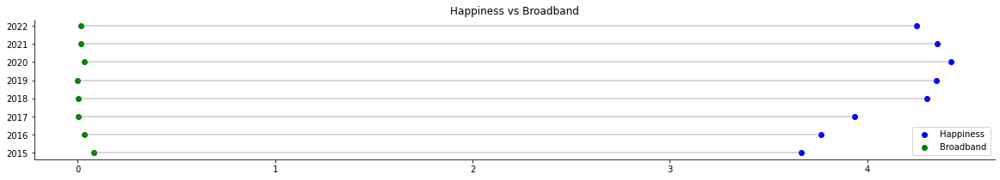

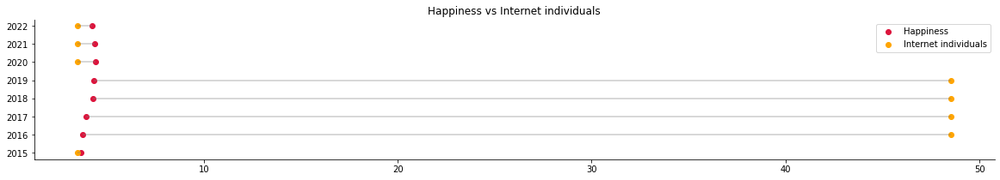

_________________________________________________________________________________________
 
Chile


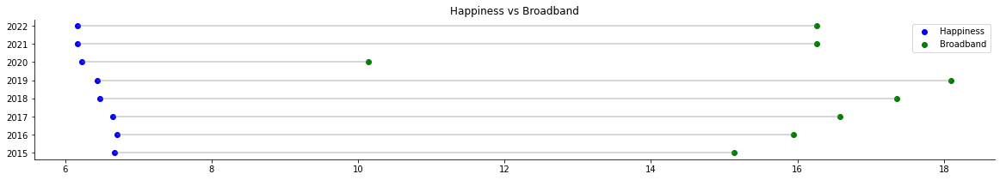

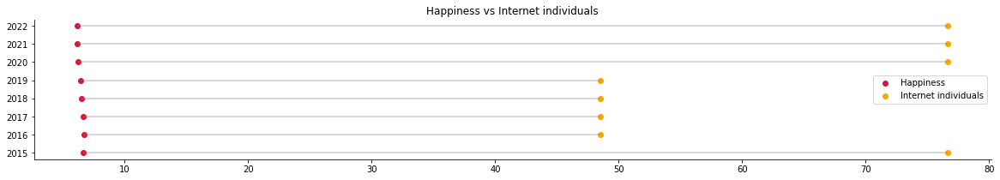

_________________________________________________________________________________________
 
China


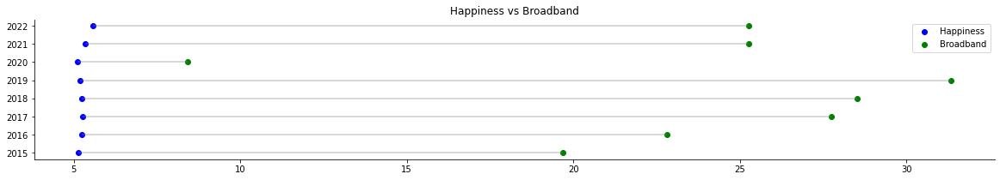

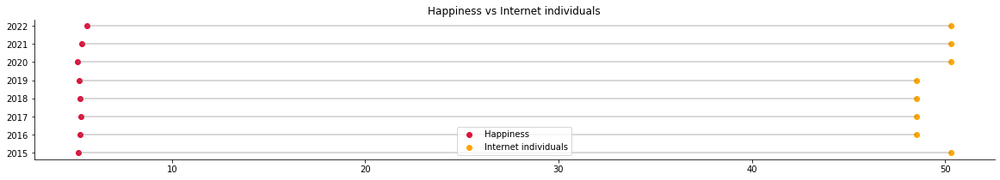

_________________________________________________________________________________________
 
Colombia


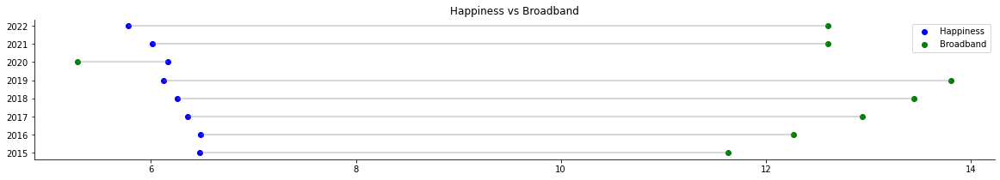

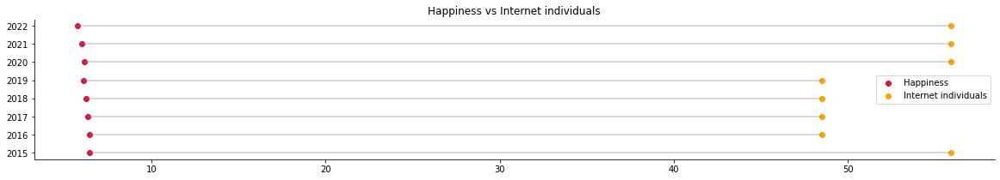

_________________________________________________________________________________________
 
Comoros


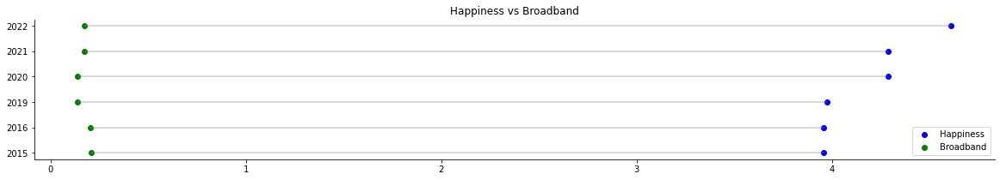

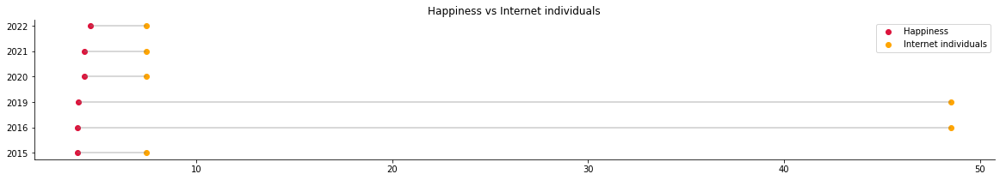

_________________________________________________________________________________________
 
Congo


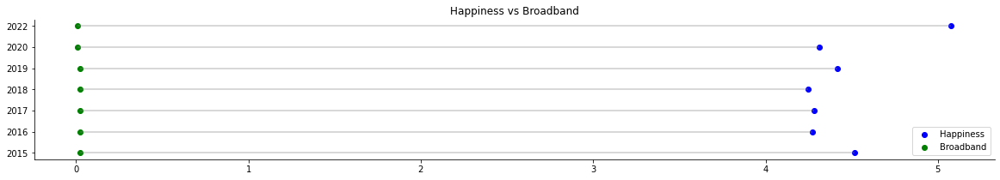

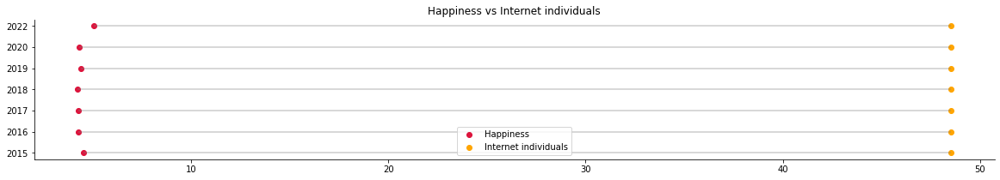

_________________________________________________________________________________________
 
Congo Brazzaville


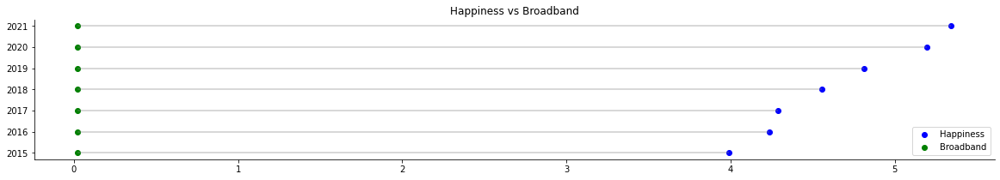

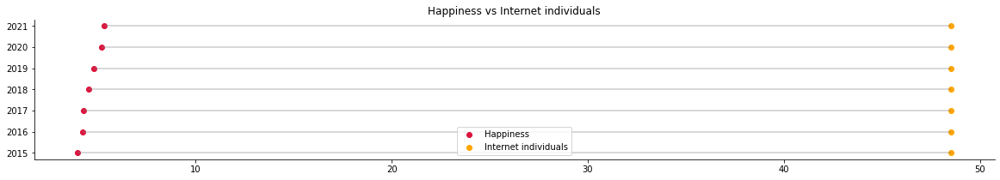

_________________________________________________________________________________________
 
Costa Rica


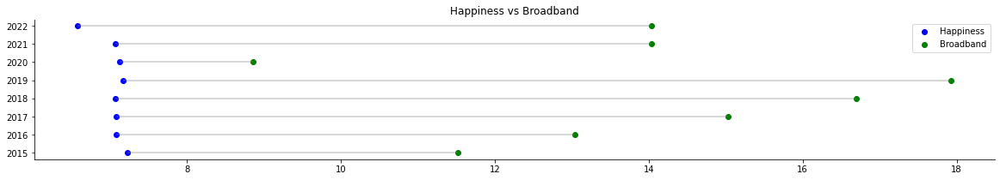

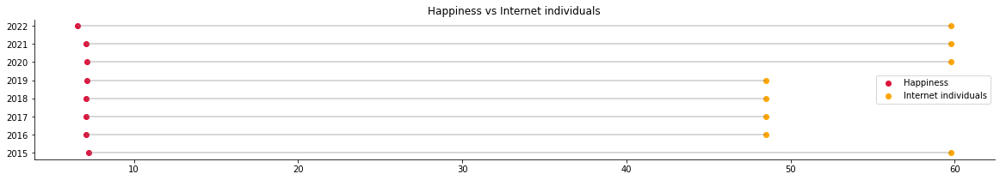

_________________________________________________________________________________________
 
Croatia


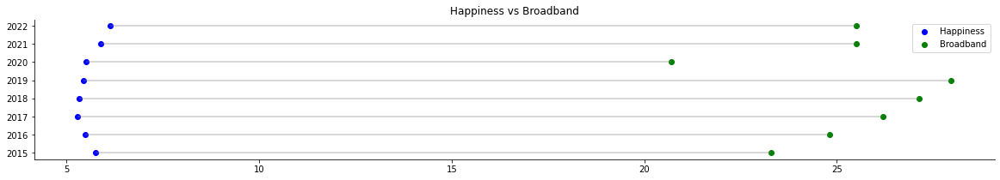

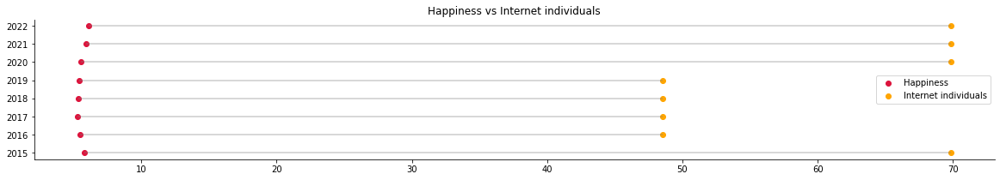

_________________________________________________________________________________________
 
Cyprus


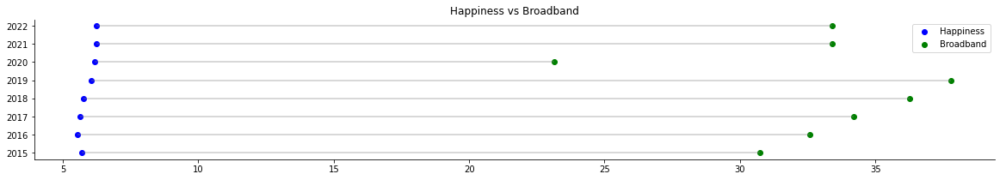

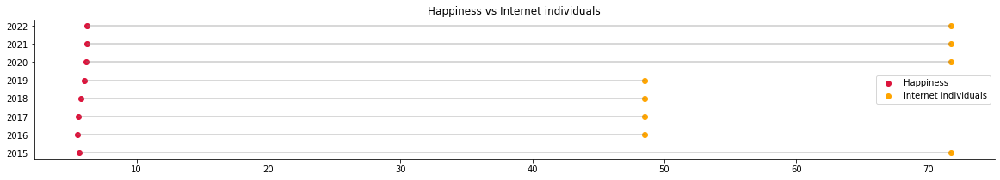

_________________________________________________________________________________________
 
Czech Republic


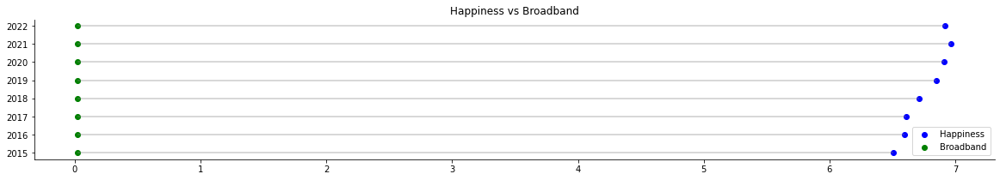

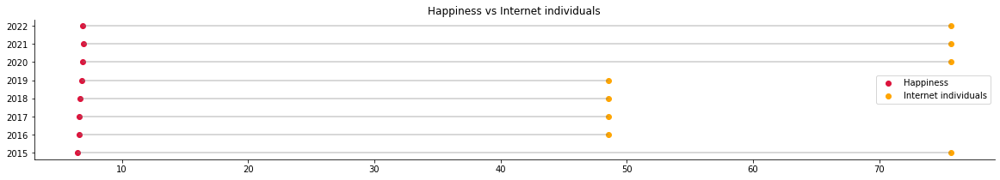

_________________________________________________________________________________________
 
Denmark


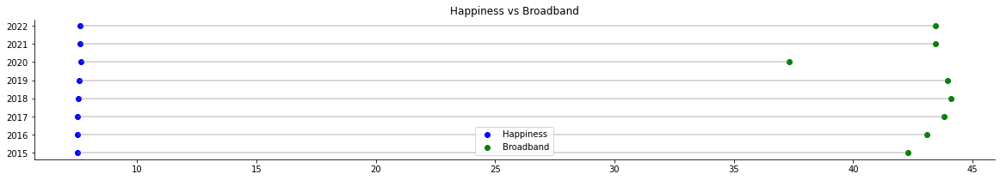

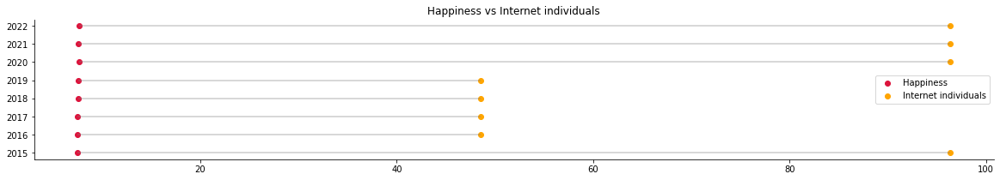

_________________________________________________________________________________________
 
Djibouti


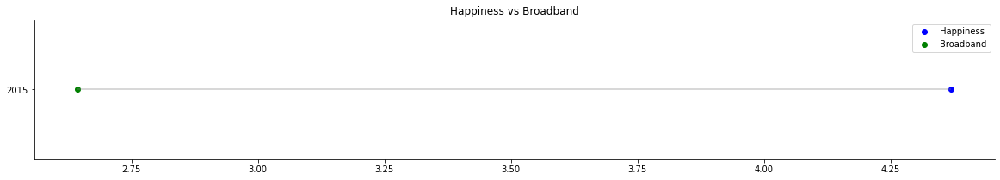

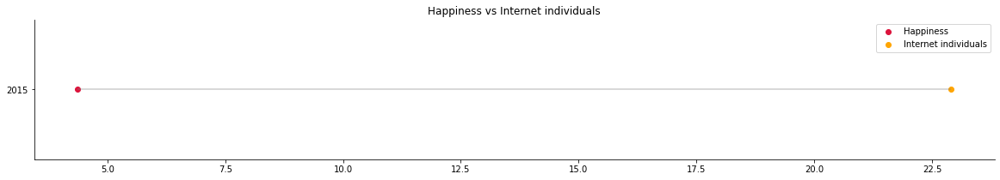

_________________________________________________________________________________________
 
Dominican Republic


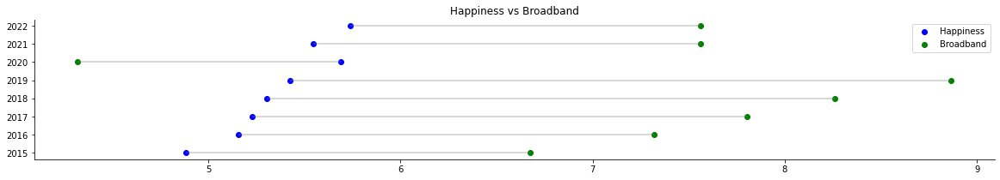

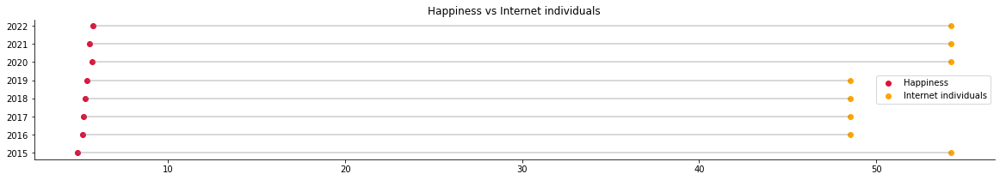

_________________________________________________________________________________________
 
Ecuador


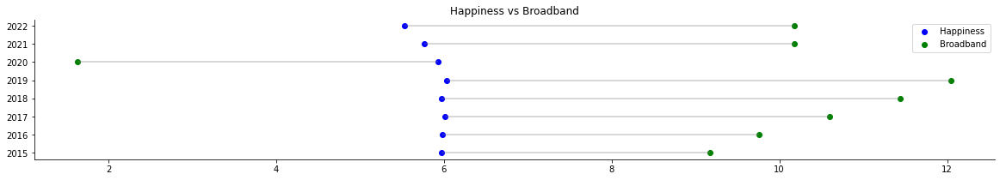

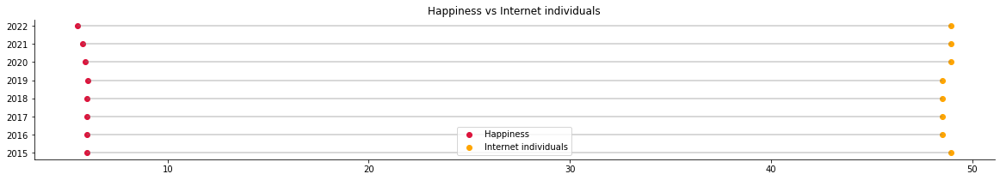

_________________________________________________________________________________________
 
Egypt


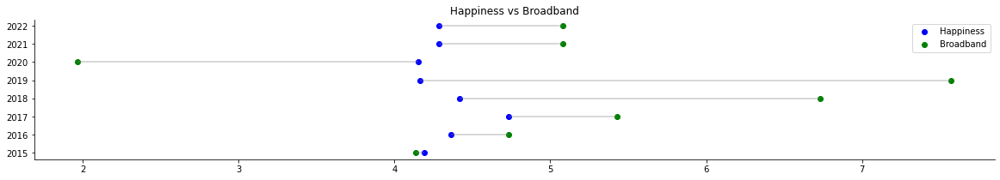

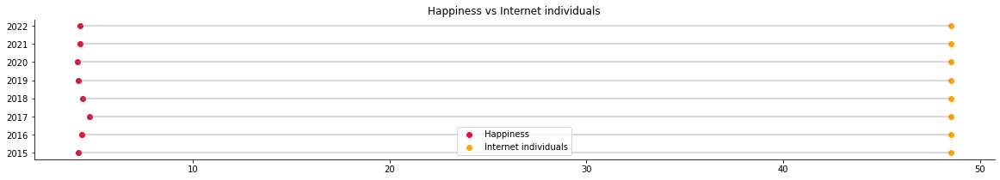

_________________________________________________________________________________________
 
El Salvador


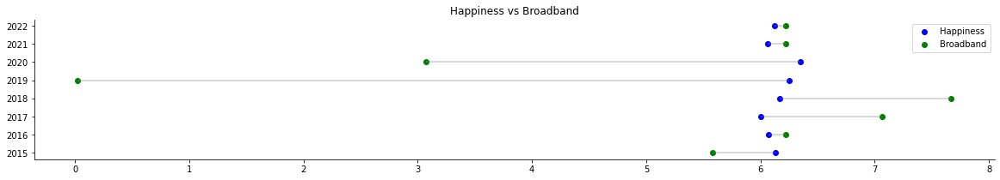

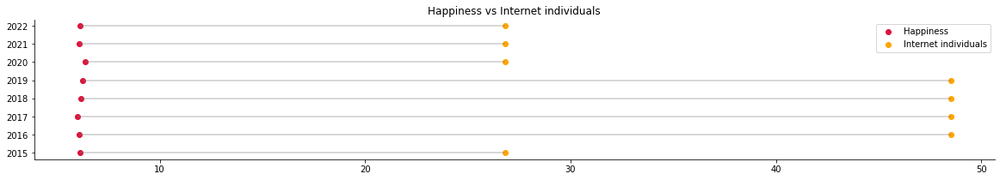

_________________________________________________________________________________________
 
Estonia


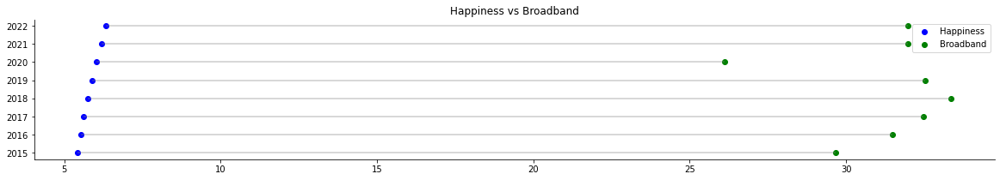

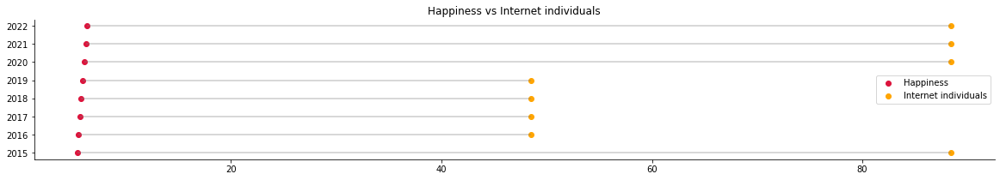

_________________________________________________________________________________________
 
Eswatini, Kingdom of


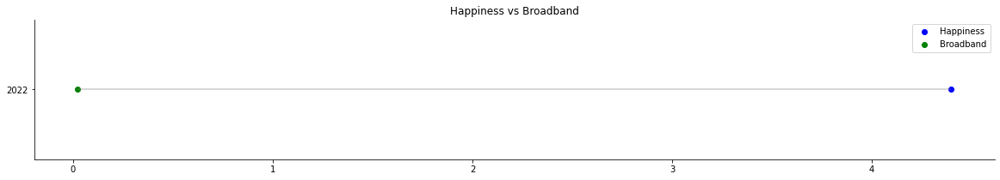

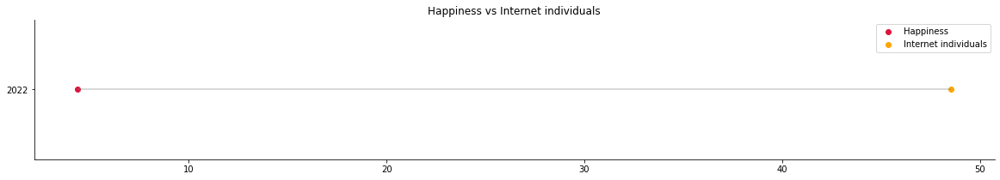

_________________________________________________________________________________________
 
Ethiopia


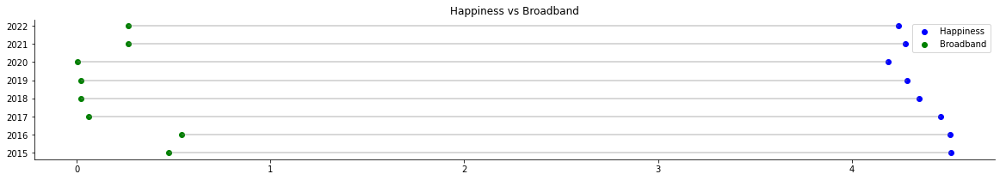

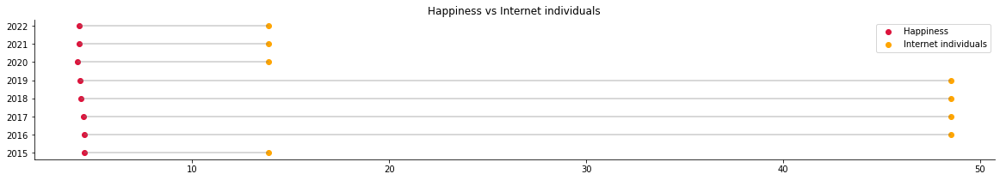

_________________________________________________________________________________________
 
Finland


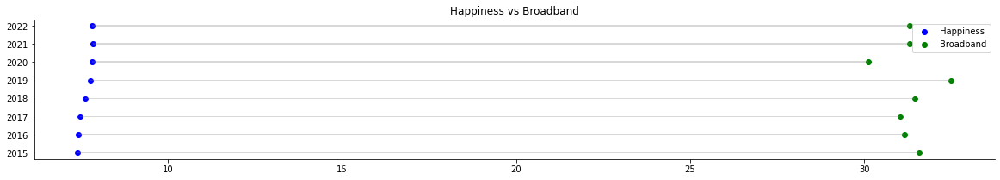

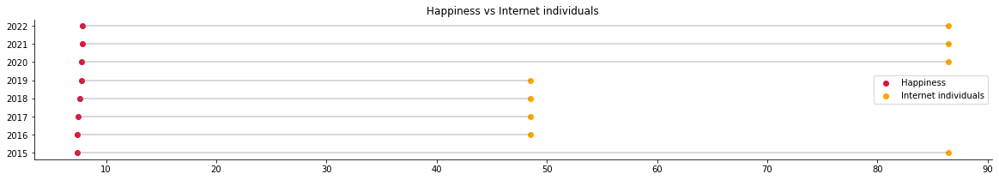

_________________________________________________________________________________________
 
France


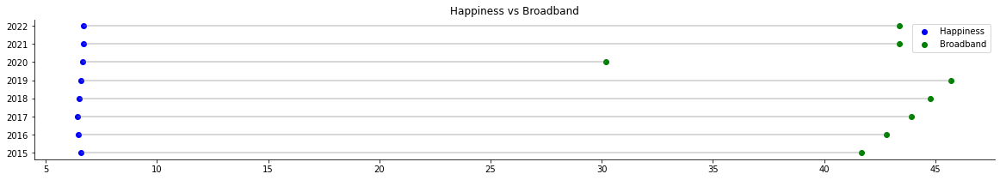

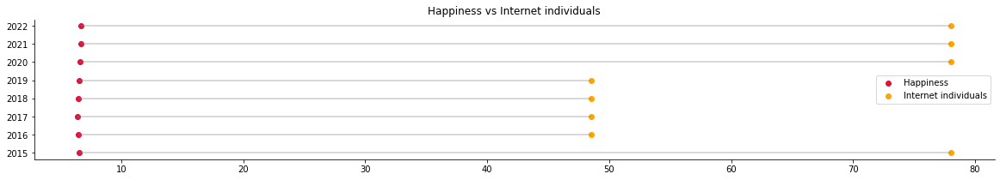

_________________________________________________________________________________________
 
Gabon


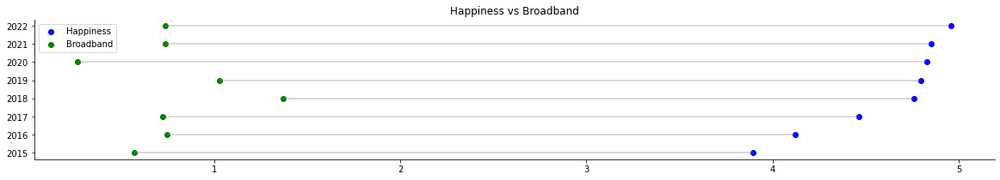

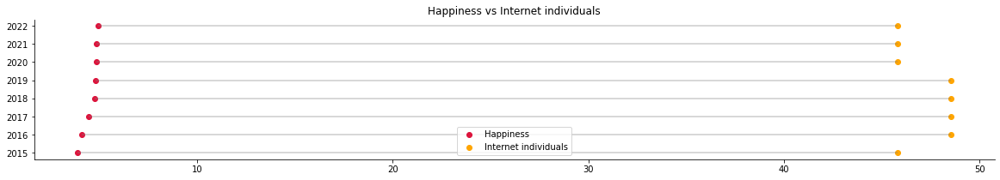

_________________________________________________________________________________________
 
Gambia


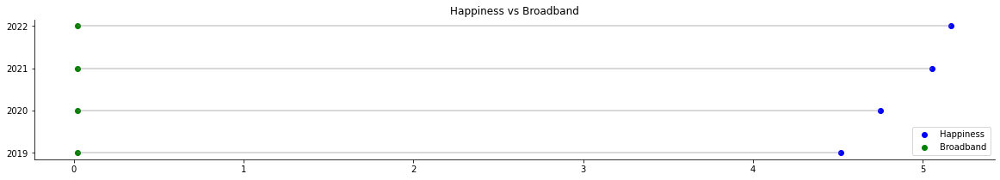

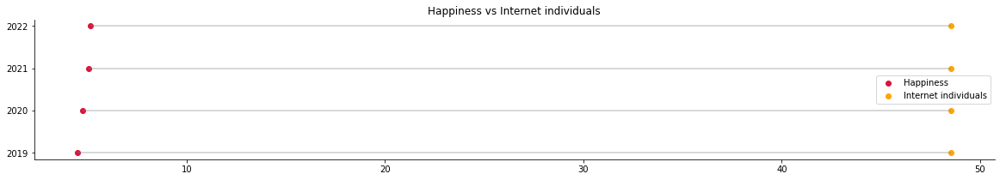

_________________________________________________________________________________________
 
Georgia


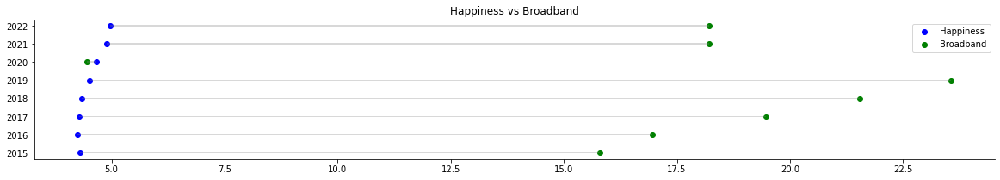

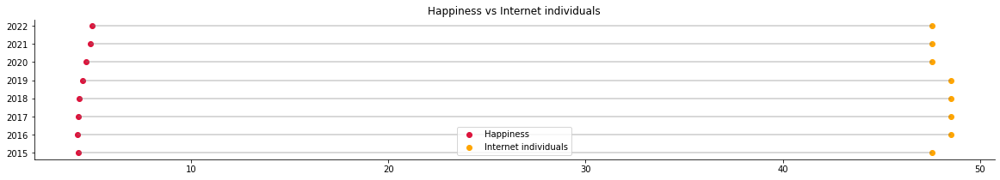

_________________________________________________________________________________________
 
Germany


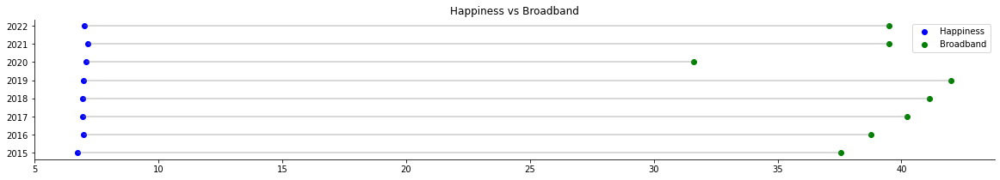

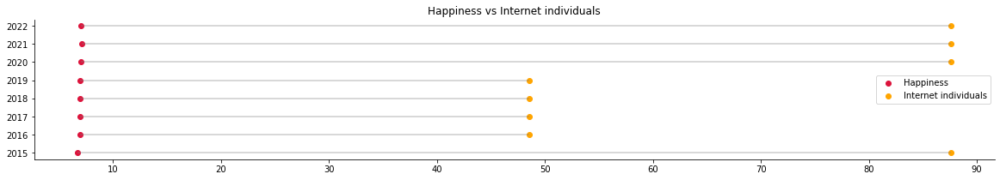

_________________________________________________________________________________________
 
Ghana


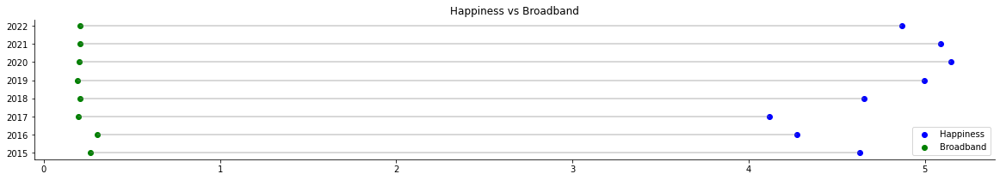

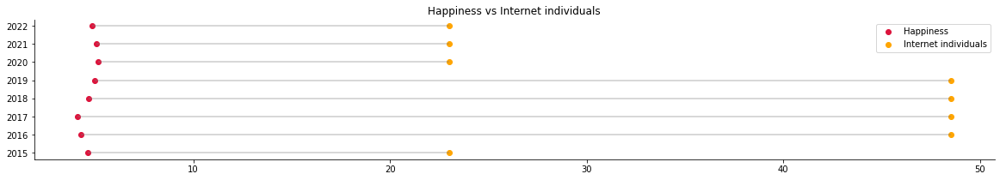

_________________________________________________________________________________________
 
Greece


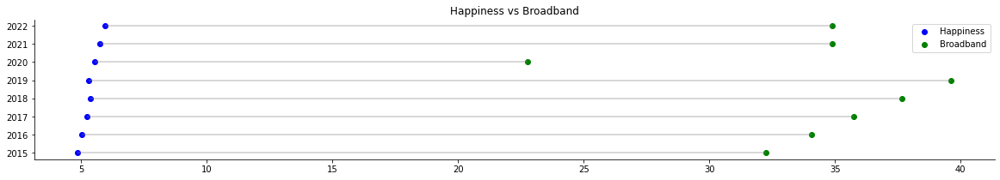

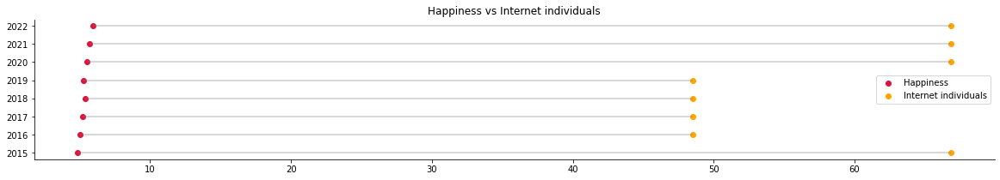

_________________________________________________________________________________________
 
Guatemala


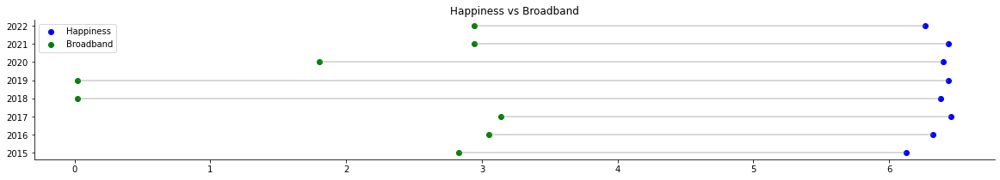

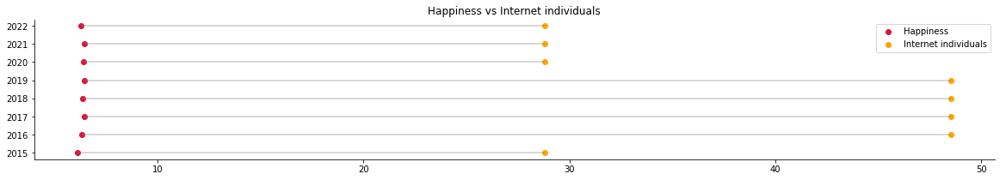

_________________________________________________________________________________________
 
Guinea


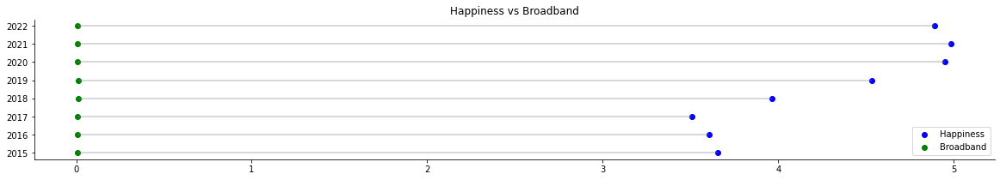

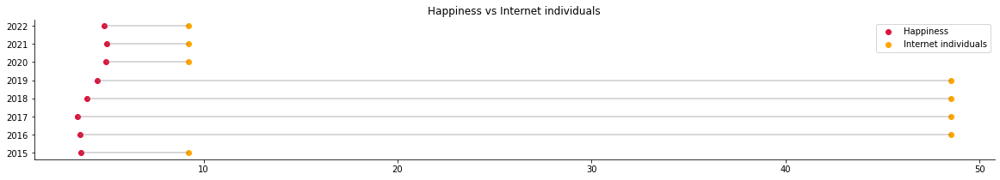

_________________________________________________________________________________________
 
Haiti


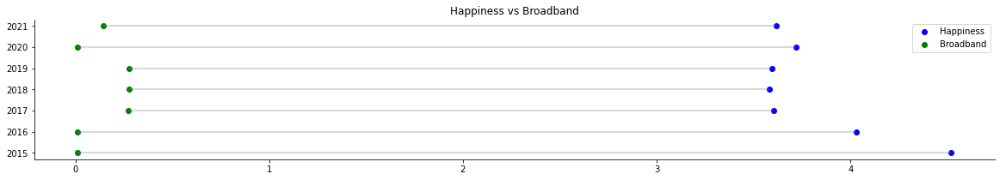

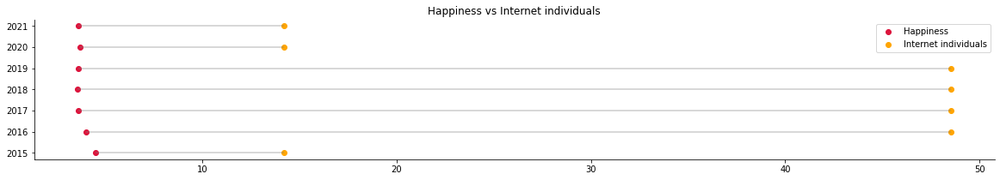

_________________________________________________________________________________________
 
Honduras


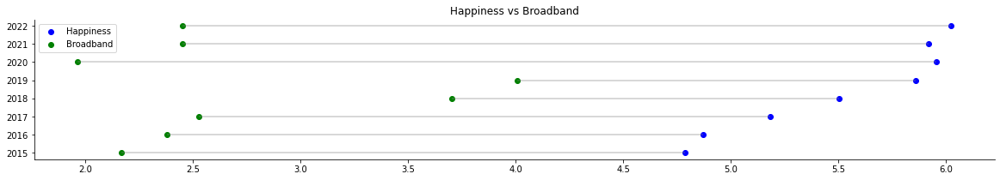

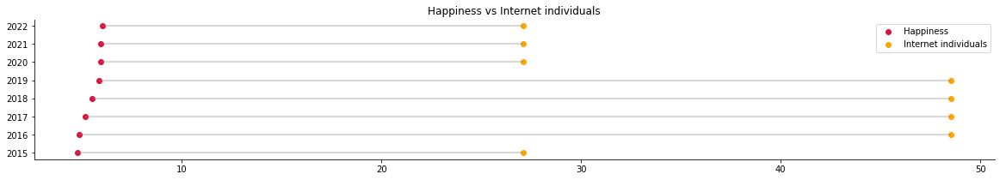

_________________________________________________________________________________________
 
Hong Kong


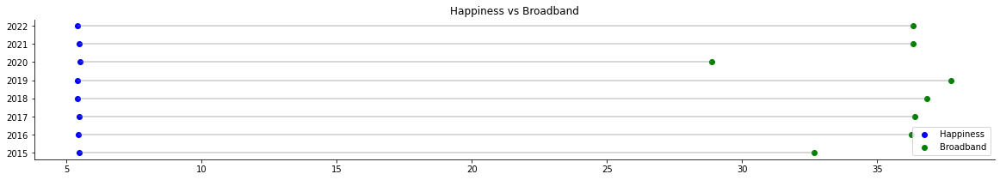

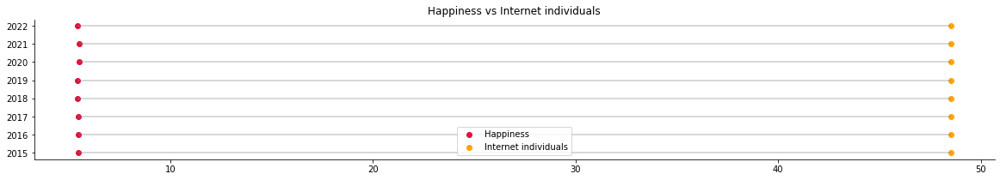

_________________________________________________________________________________________
 
Hungary


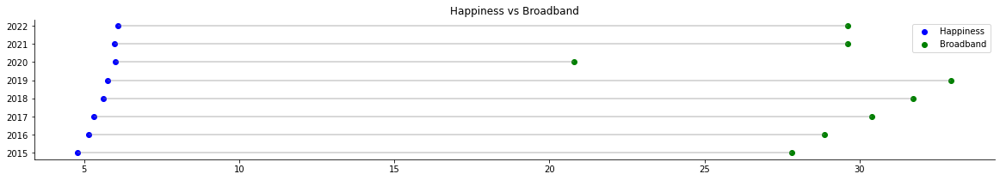

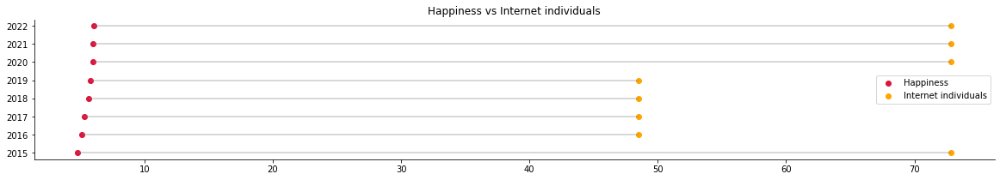

_________________________________________________________________________________________
 
Iceland


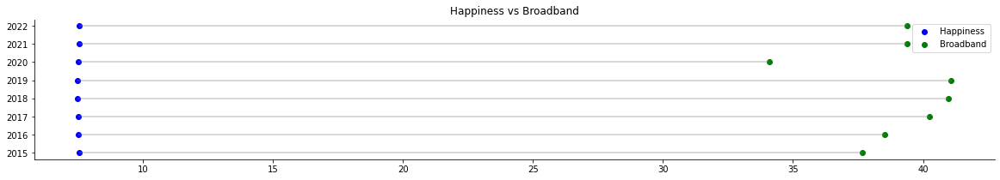

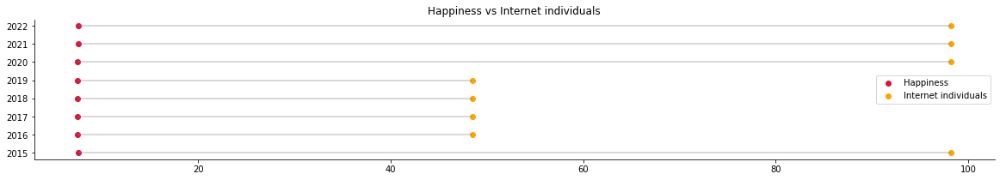

_________________________________________________________________________________________
 
India


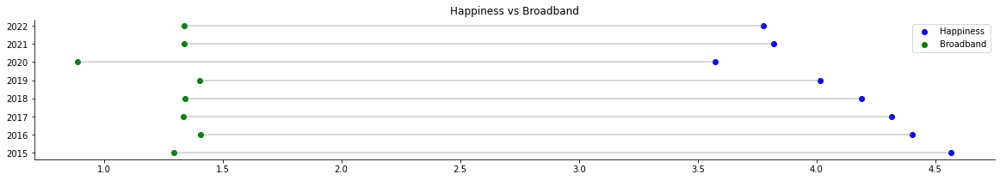

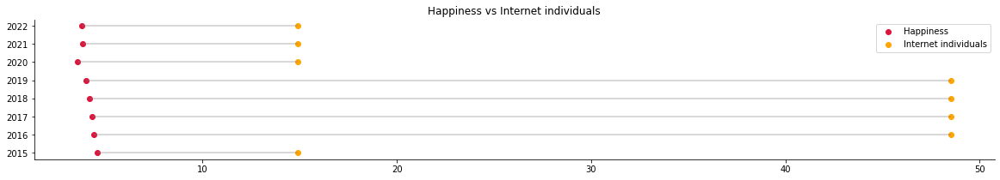

_________________________________________________________________________________________
 
Indonesia


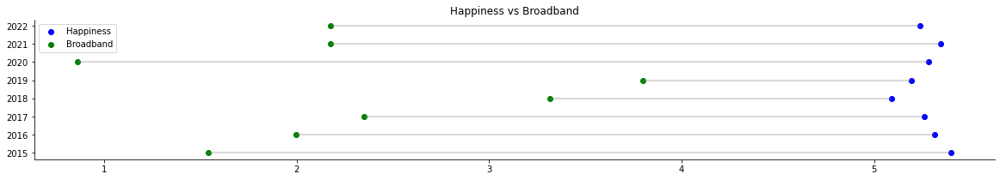

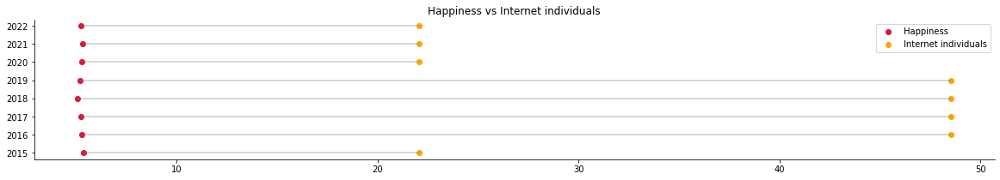

_________________________________________________________________________________________
 
Iran


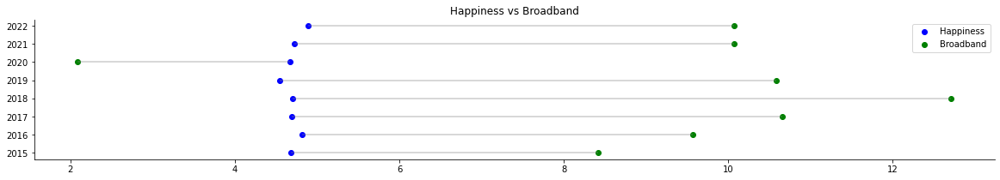

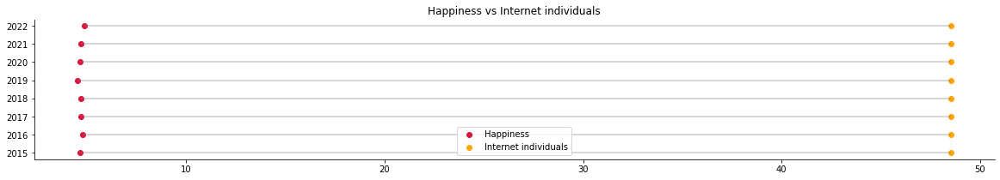

_________________________________________________________________________________________
 
Iraq


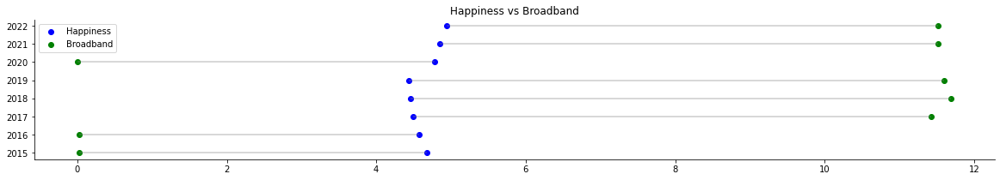

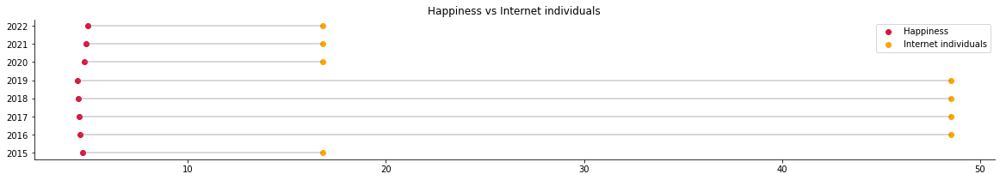

_________________________________________________________________________________________
 
Ireland


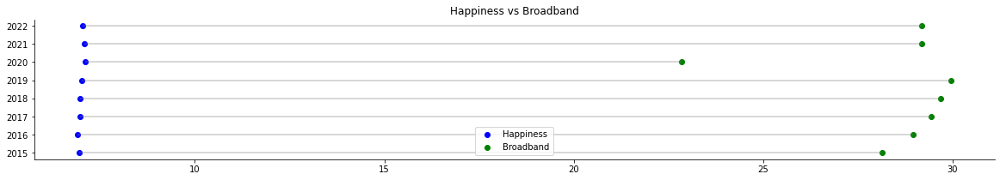

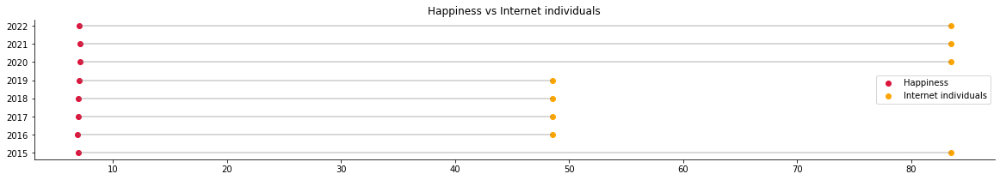

_________________________________________________________________________________________
 
Israel


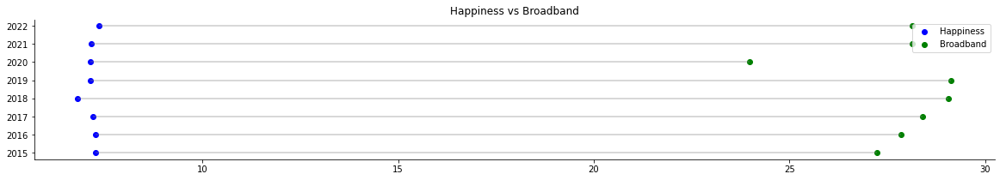

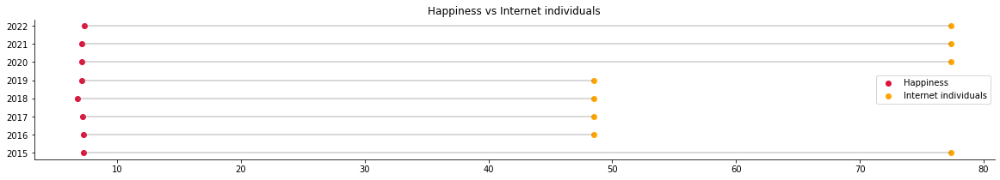

_________________________________________________________________________________________
 
Italy


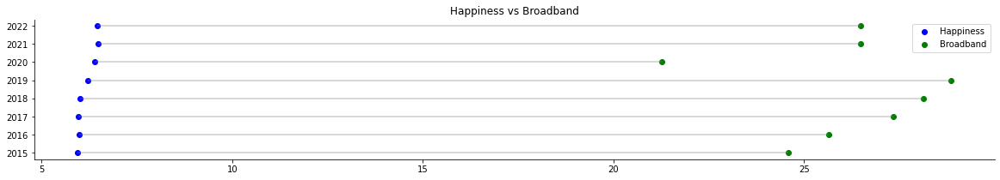

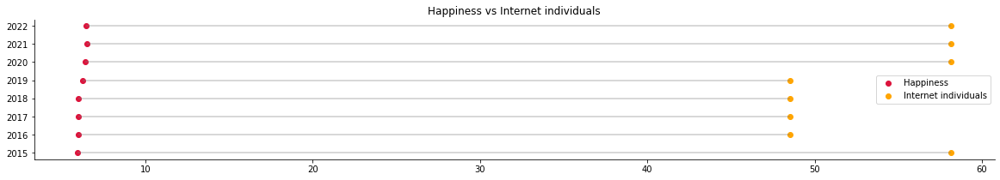

_________________________________________________________________________________________
 
Ivory Coast


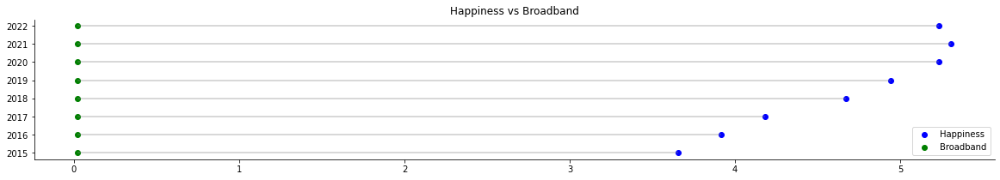

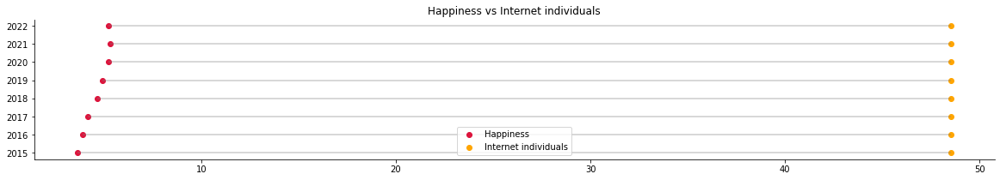

_________________________________________________________________________________________
 
Jamaica


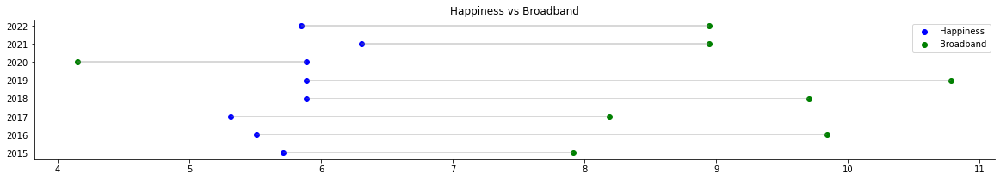

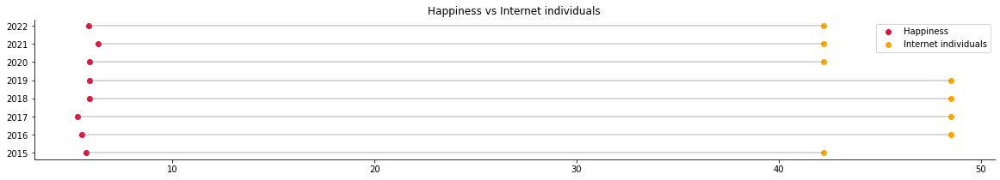

_________________________________________________________________________________________
 
Japan


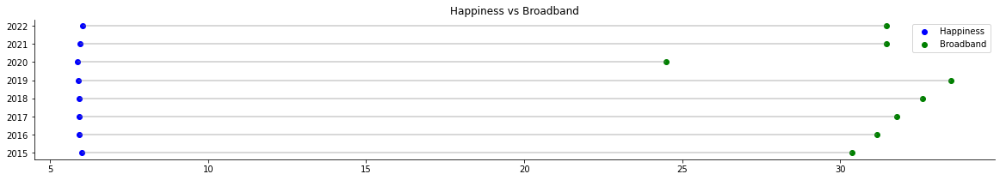

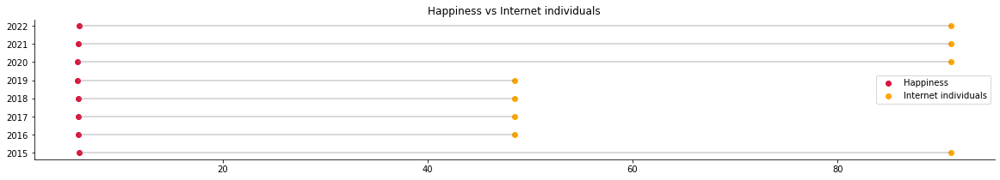

_________________________________________________________________________________________
 
Jordan


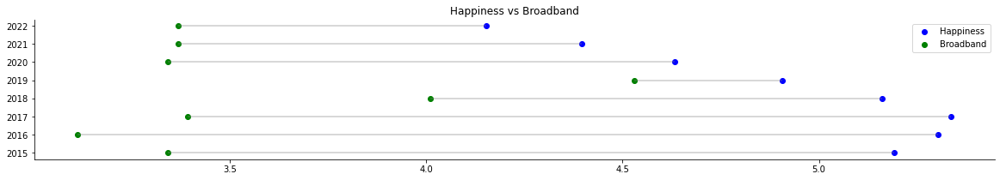

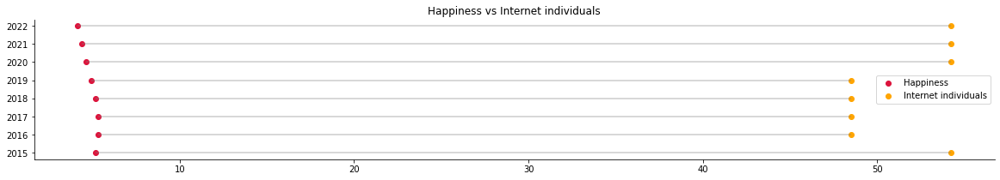

_________________________________________________________________________________________
 
Kazakhstan


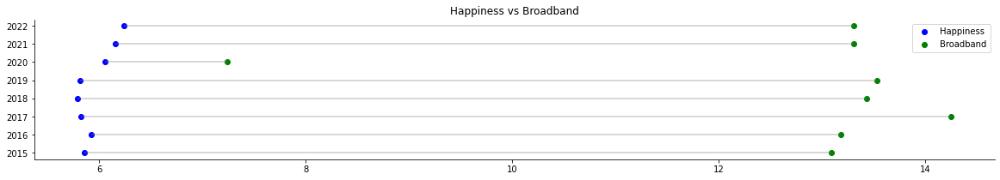

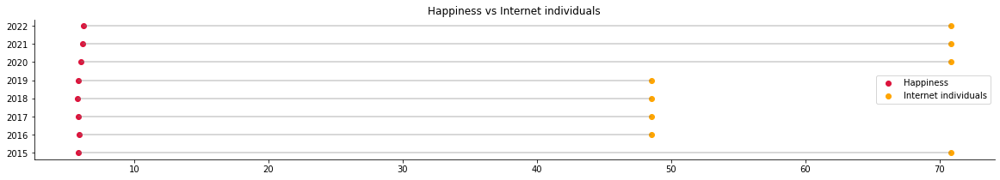

_________________________________________________________________________________________
 
Kenya


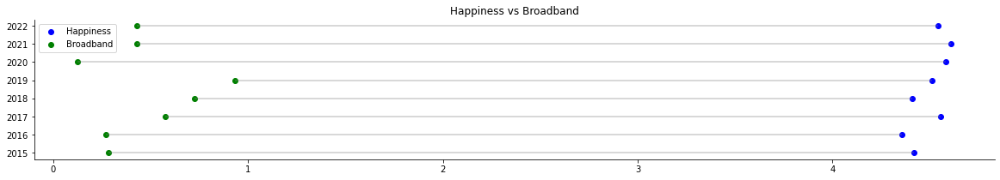

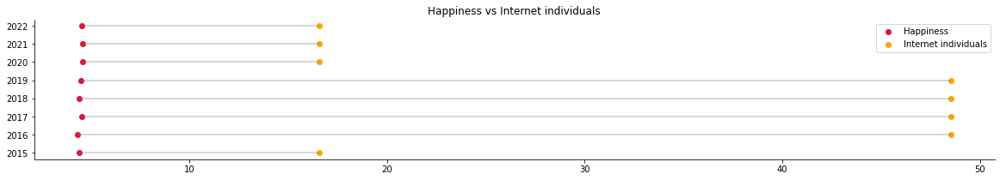

_________________________________________________________________________________________
 
Kosovo


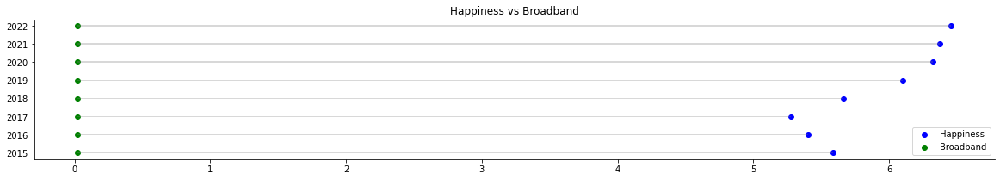

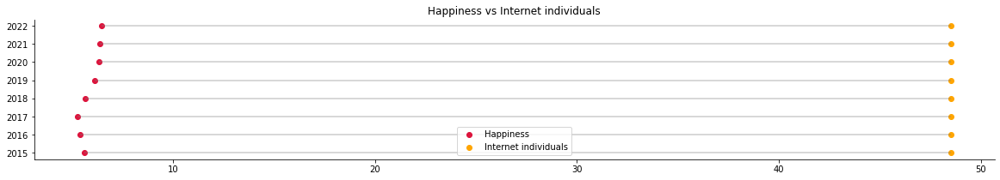

_________________________________________________________________________________________
 
Kuwait


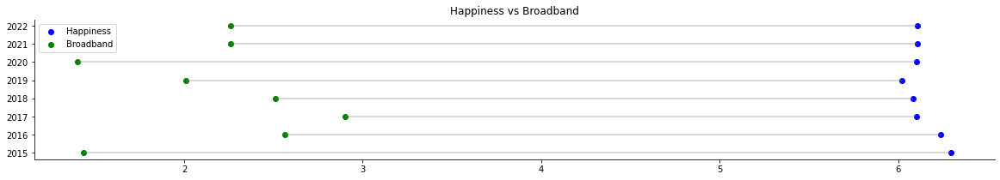

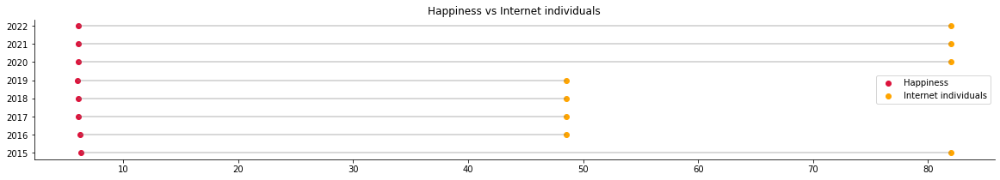

_________________________________________________________________________________________
 
Kyrgyzstan


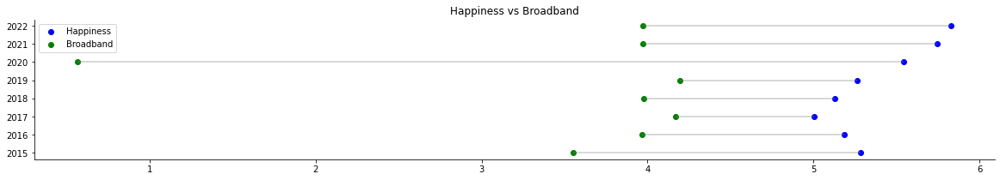

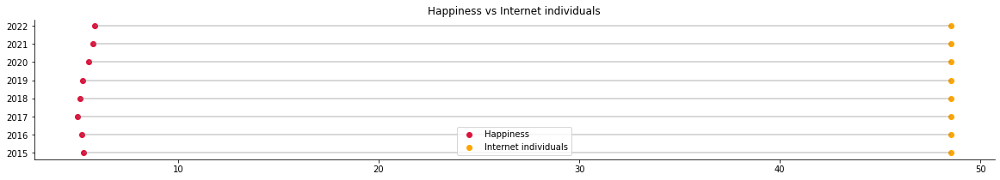

_________________________________________________________________________________________
 
Laos


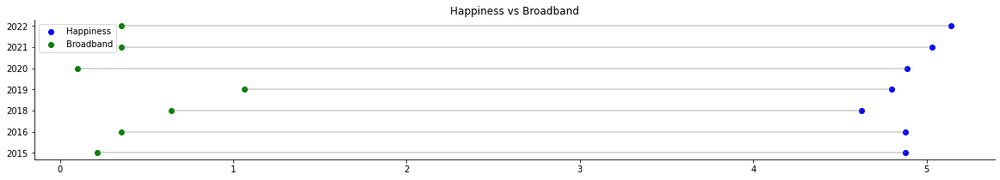

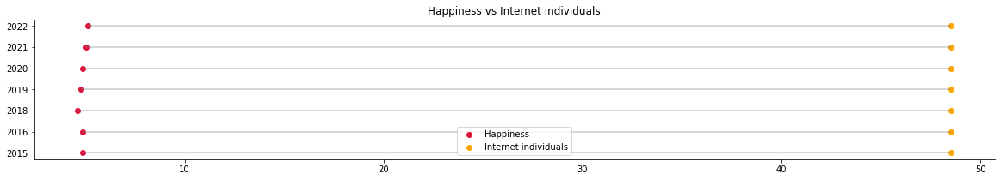

_________________________________________________________________________________________
 
Latvia


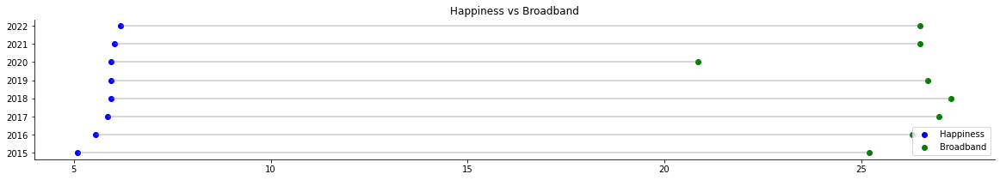

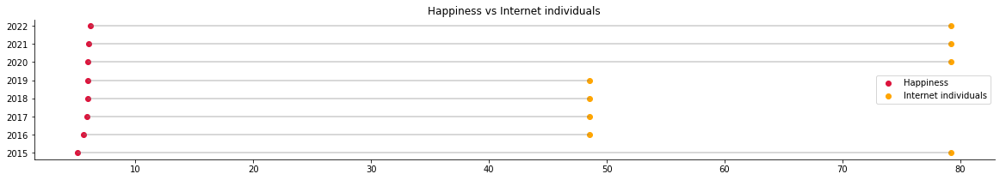

_________________________________________________________________________________________
 
Lebanon


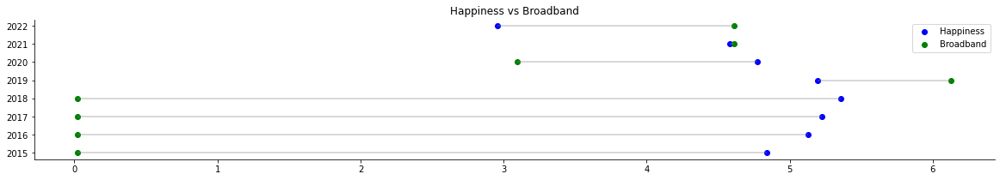

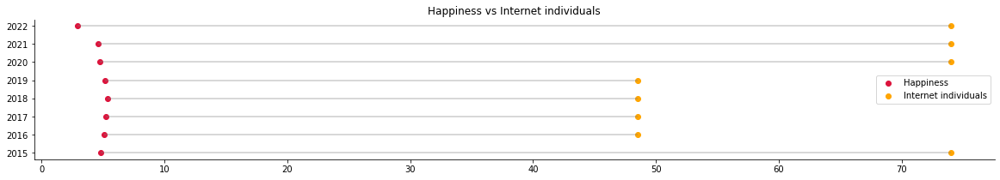

_________________________________________________________________________________________
 
Lesotho


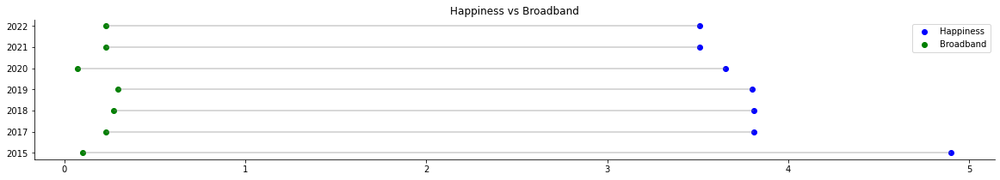

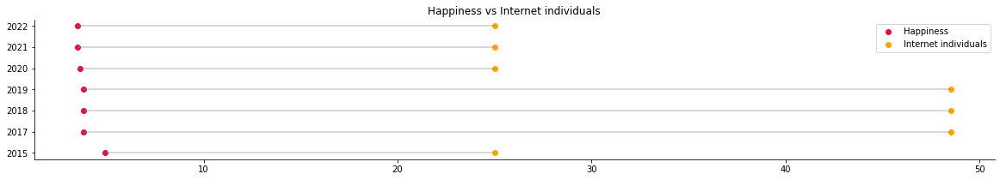

_________________________________________________________________________________________
 
Liberia


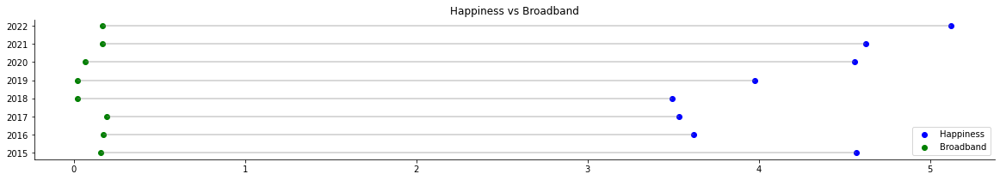

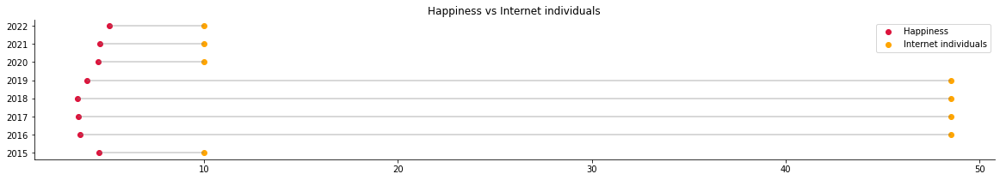

_________________________________________________________________________________________
 
Libya


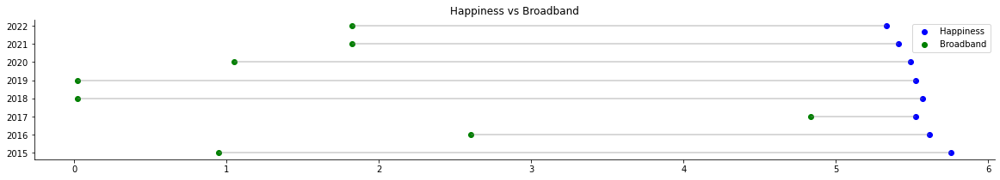

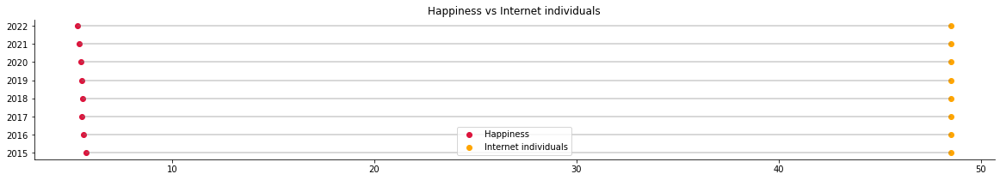

_________________________________________________________________________________________
 
Lithuania


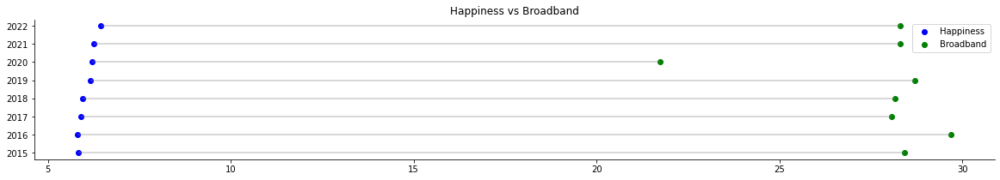

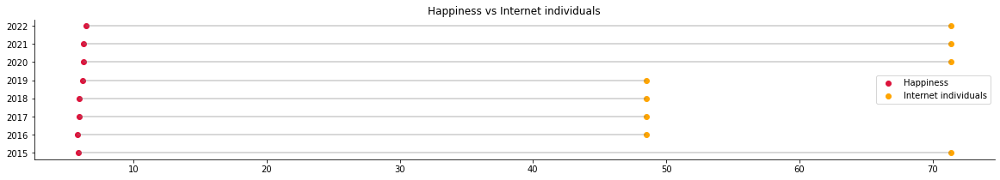

_________________________________________________________________________________________
 
Luxembourg


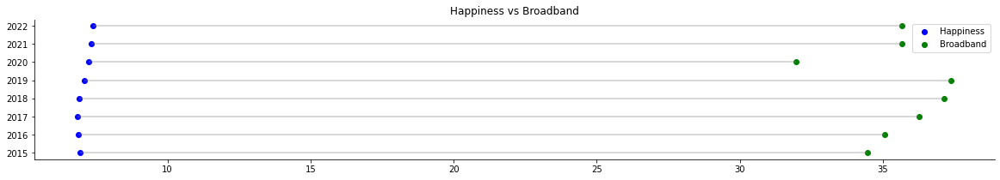

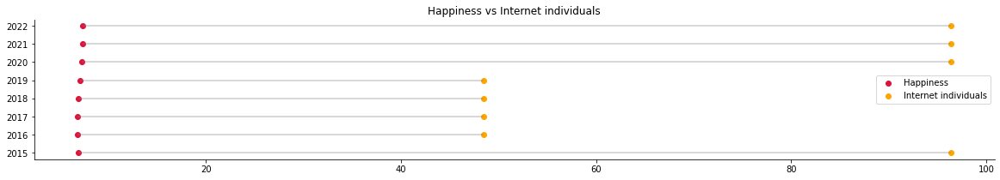

_________________________________________________________________________________________
 
Macedonia


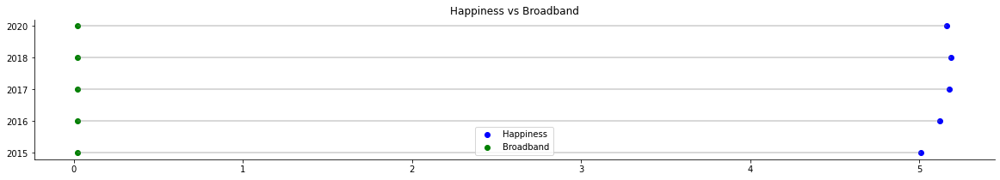

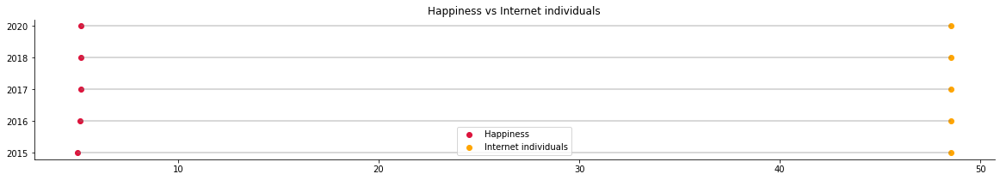

_________________________________________________________________________________________
 
Madagascar


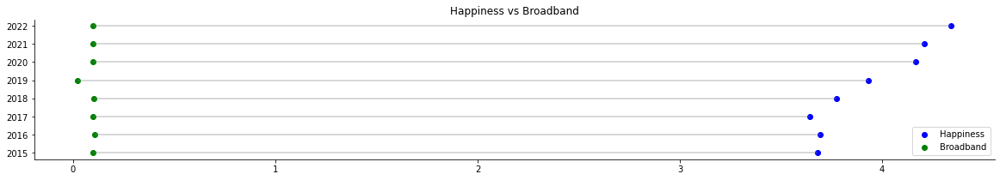

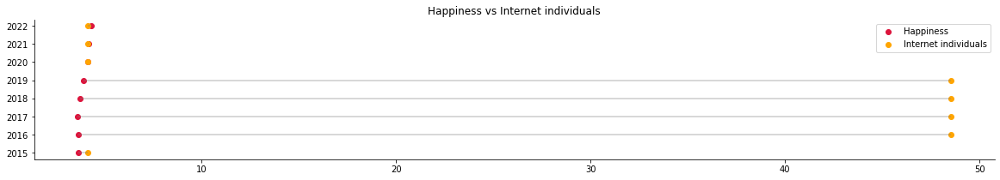

_________________________________________________________________________________________
 
Malawi


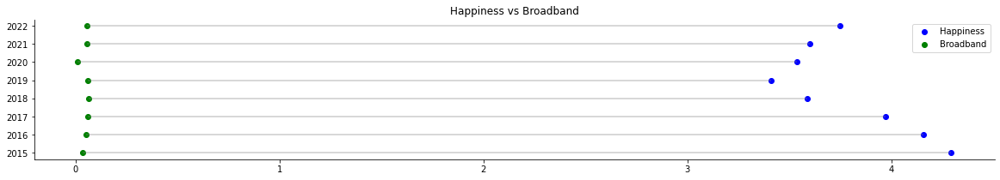

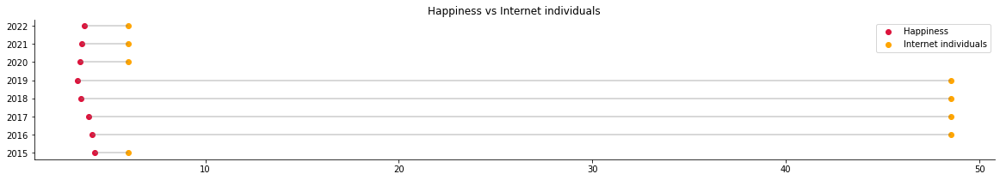

_________________________________________________________________________________________
 
Malaysia


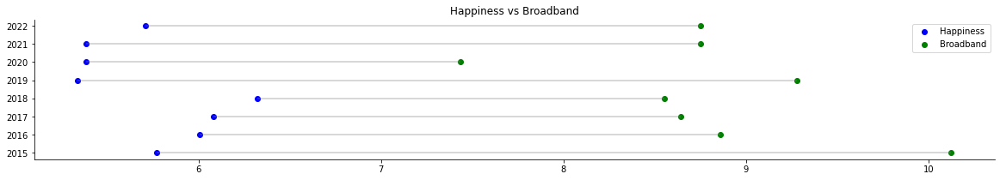

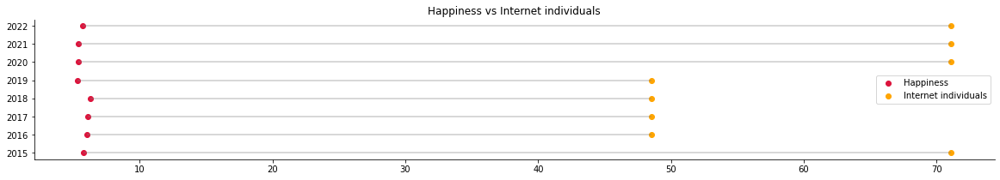

_________________________________________________________________________________________
 
Maldives


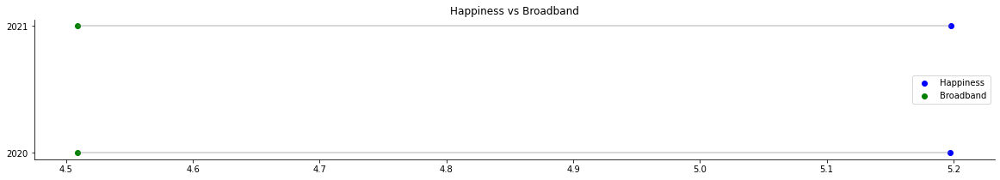

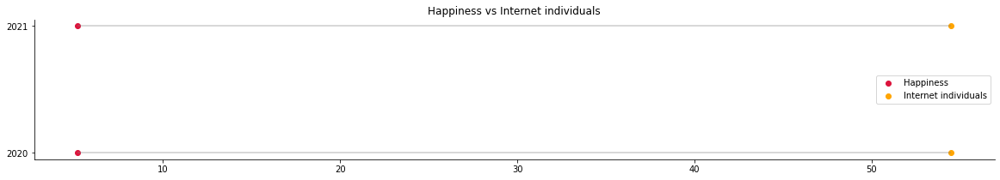

_________________________________________________________________________________________
 
Mali


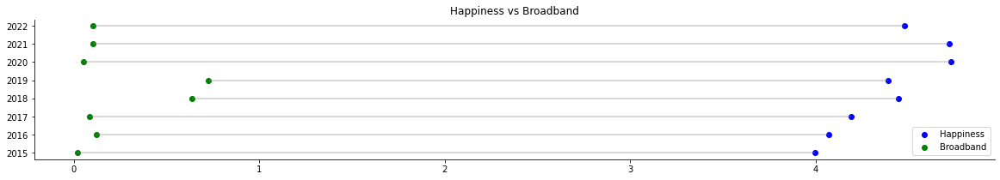

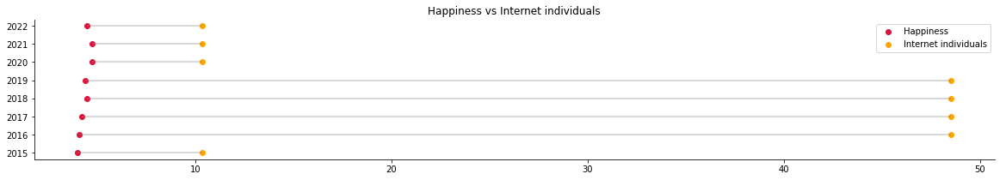

_________________________________________________________________________________________
 
Malta


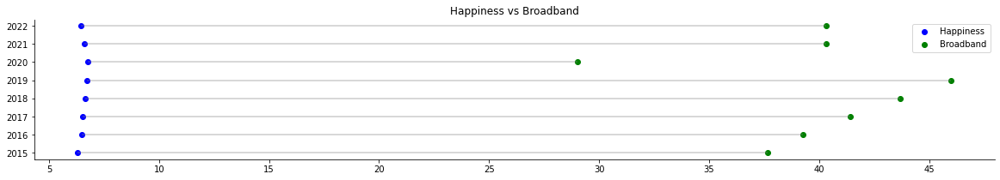

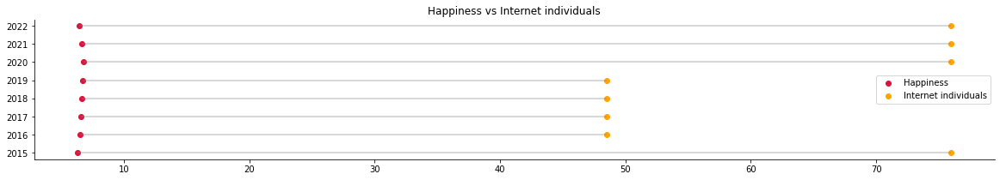

_________________________________________________________________________________________
 
Mauritania


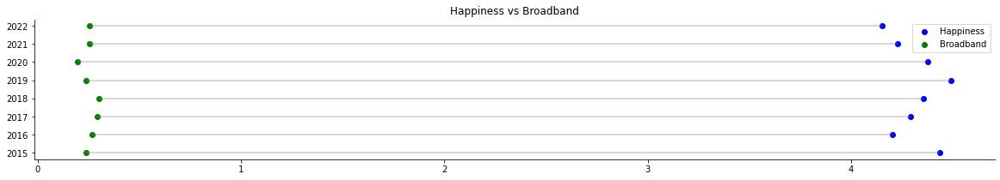

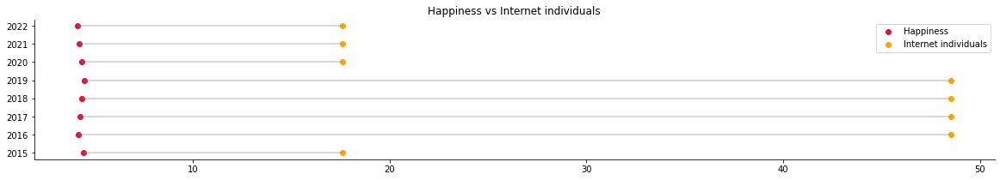

_________________________________________________________________________________________
 
Mauritius


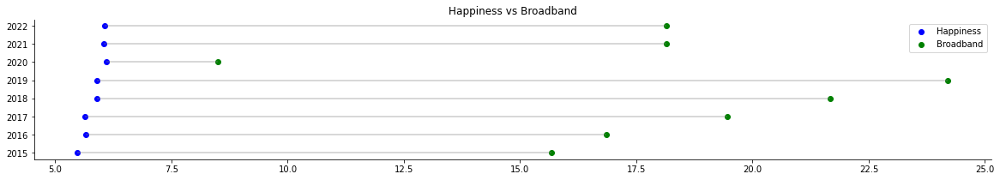

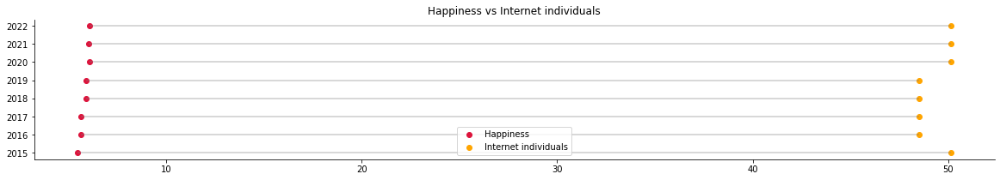

_________________________________________________________________________________________
 
Mexico


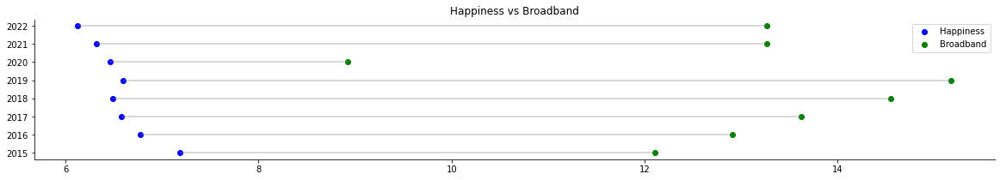

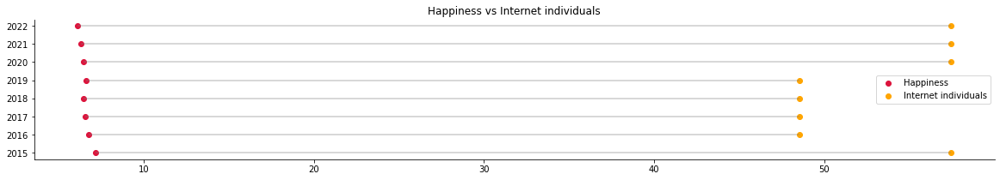

_________________________________________________________________________________________
 
Moldova


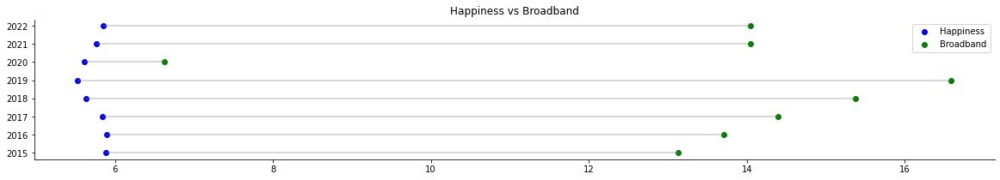

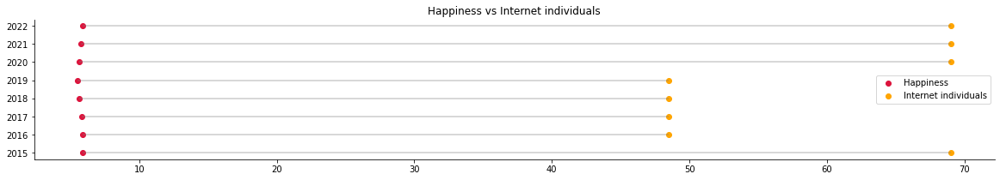

_________________________________________________________________________________________
 
Mongolia


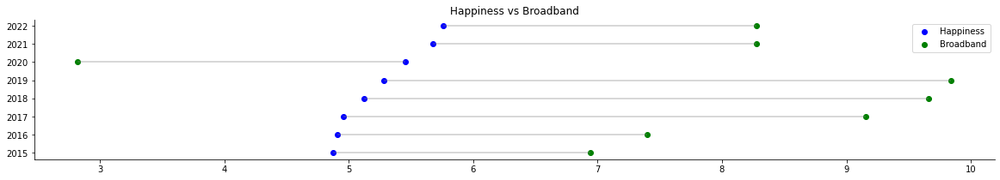

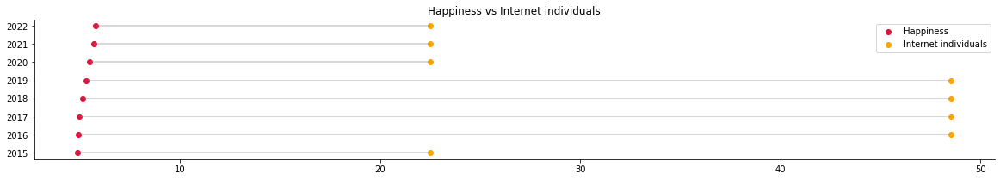

_________________________________________________________________________________________
 
Montenegro


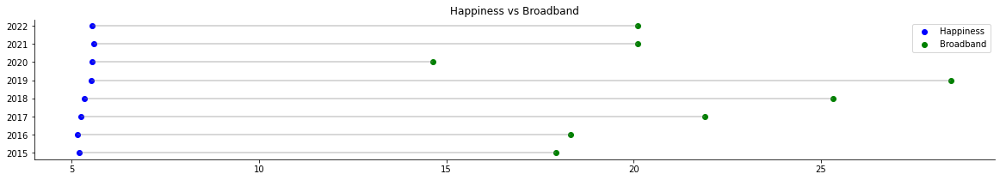

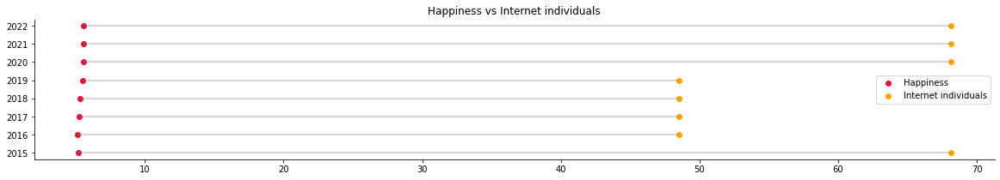

_________________________________________________________________________________________
 
Morocco


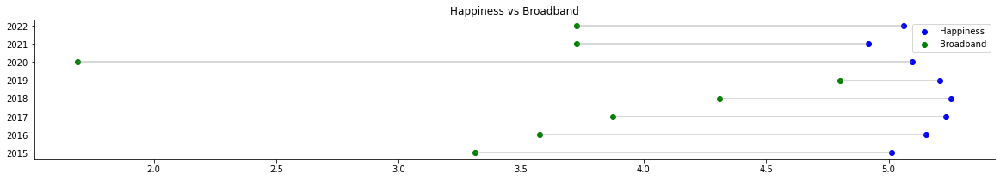

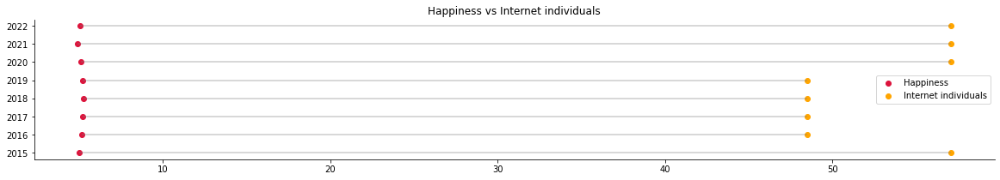

_________________________________________________________________________________________
 
Mozambique


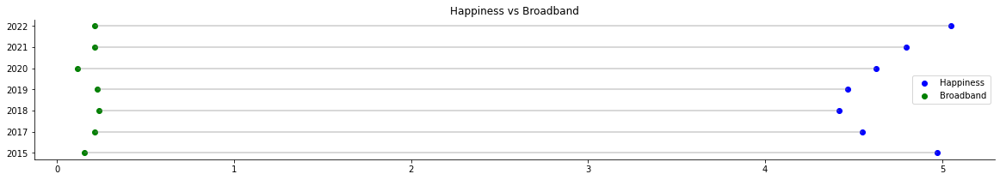

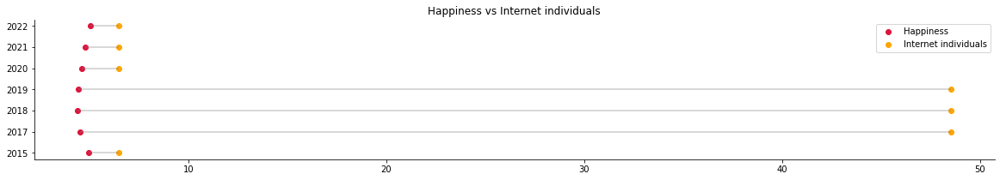

_________________________________________________________________________________________
 
Myanmar


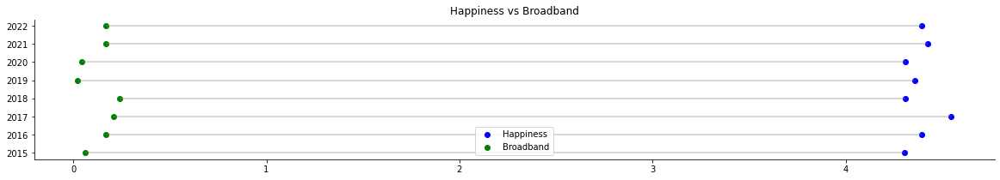

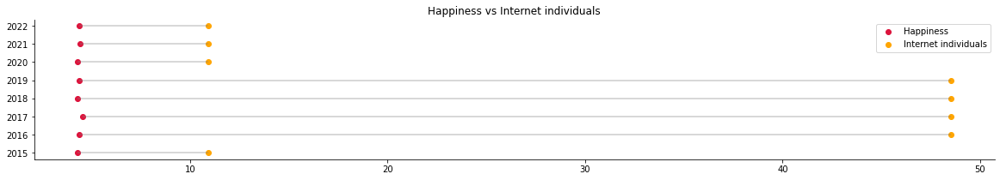

_________________________________________________________________________________________
 
Namibia


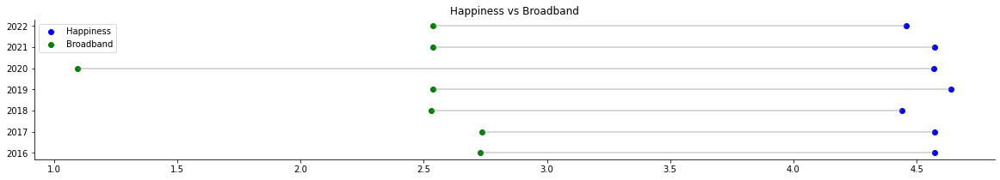

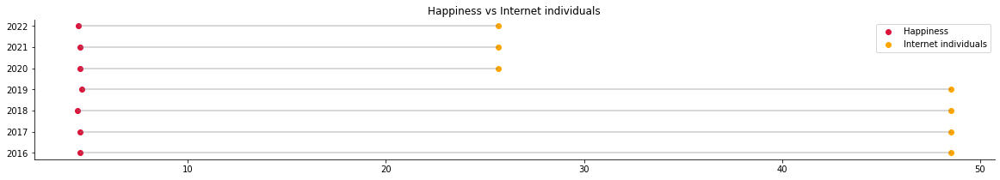

_________________________________________________________________________________________
 
Nepal


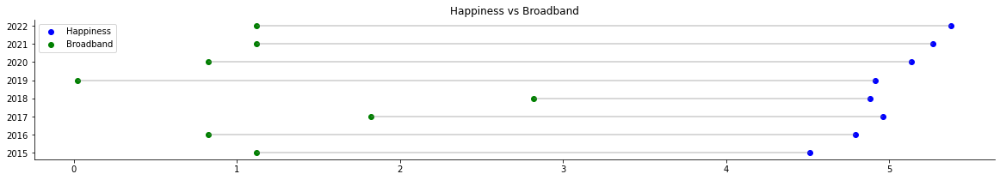

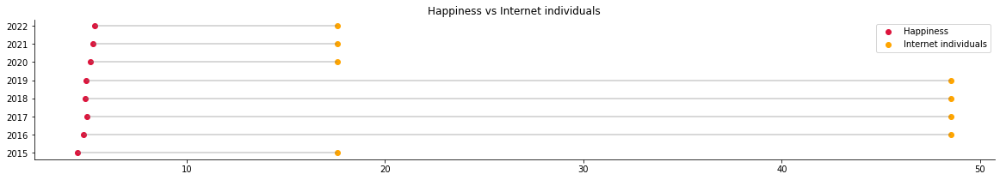

_________________________________________________________________________________________
 
Netherlands


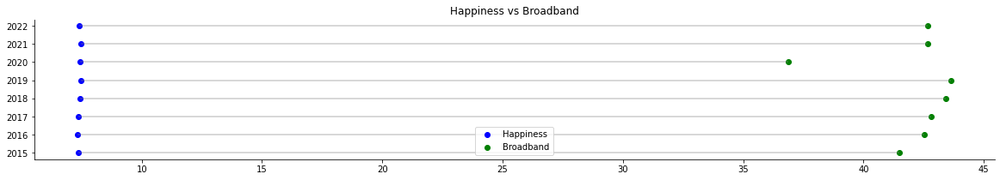

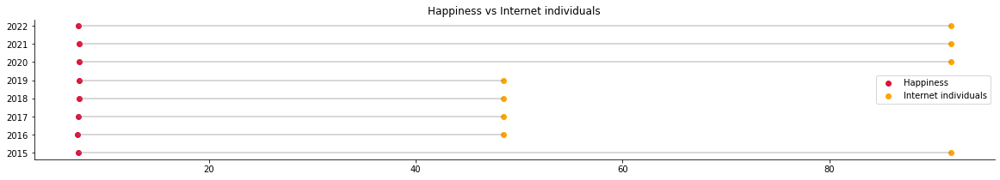

_________________________________________________________________________________________
 
New Zealand


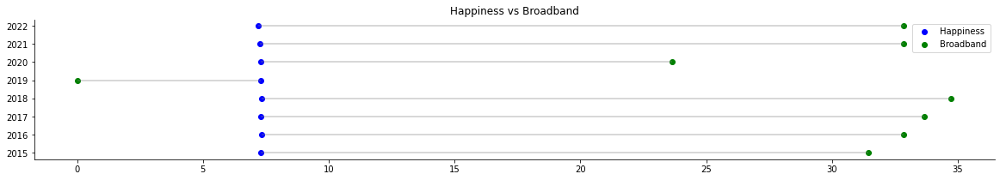

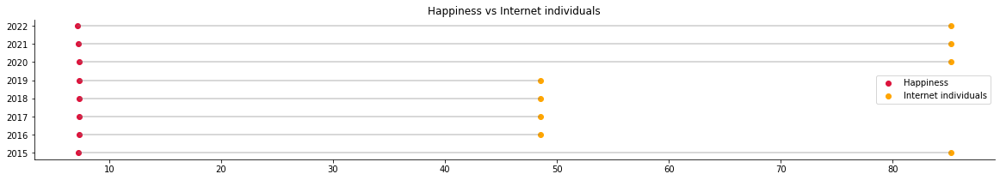

_________________________________________________________________________________________
 
Nicaragua


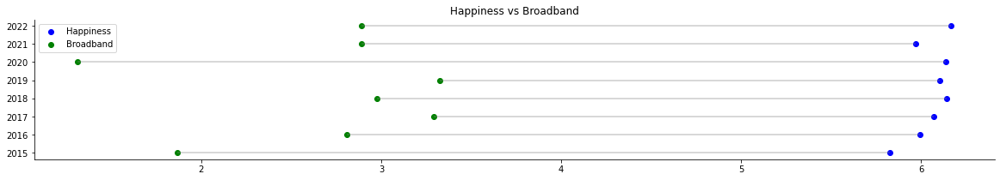

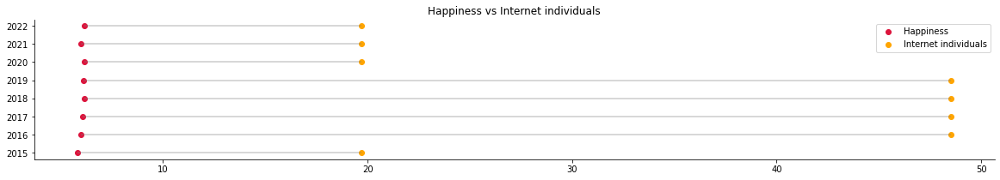

_________________________________________________________________________________________
 
Niger


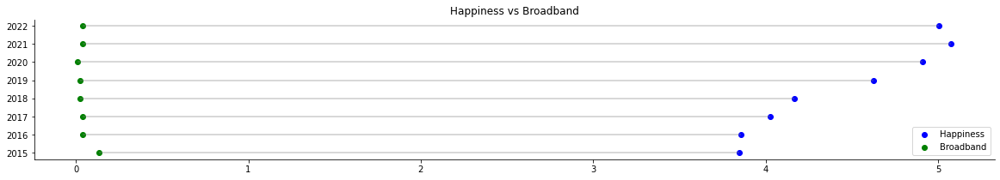

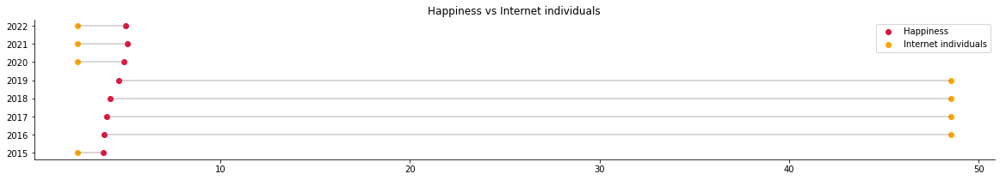

_________________________________________________________________________________________
 
Nigeria


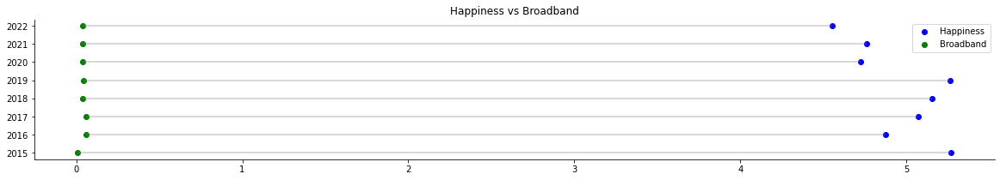

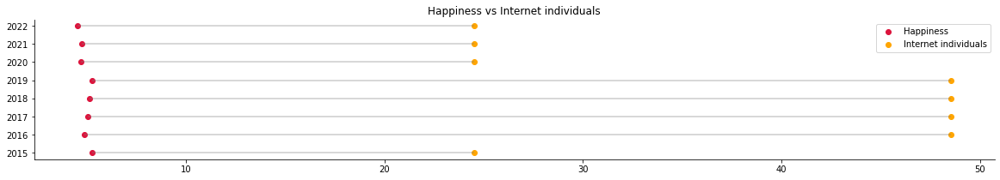

_________________________________________________________________________________________
 
North Cyprus


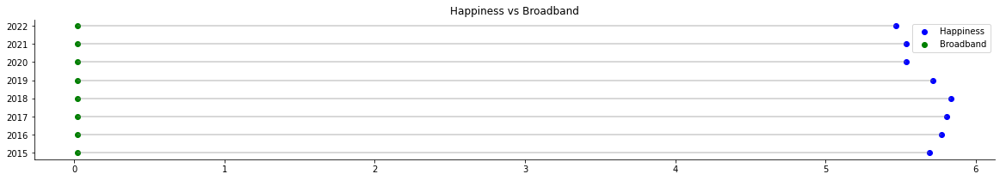

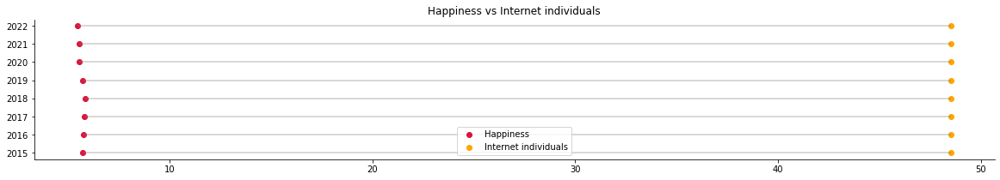

_________________________________________________________________________________________
 
North Macedonia


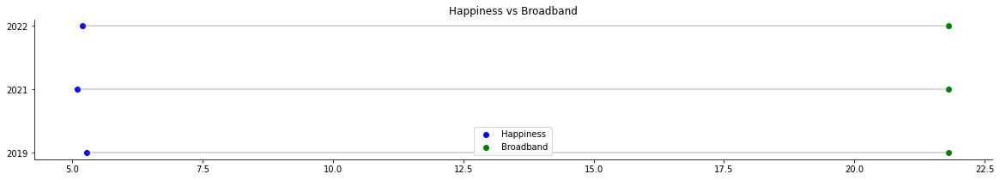

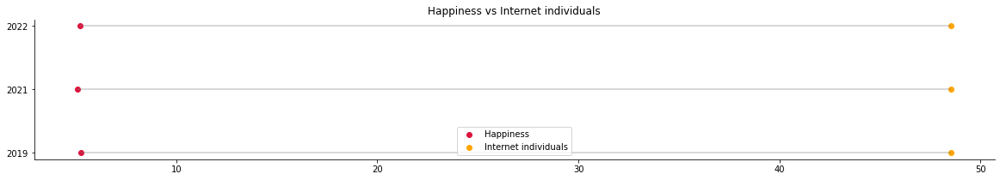

_________________________________________________________________________________________
 
Norway


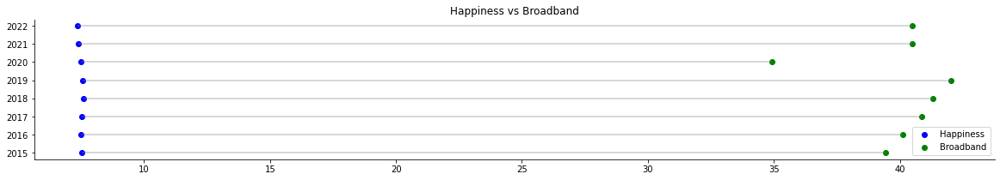

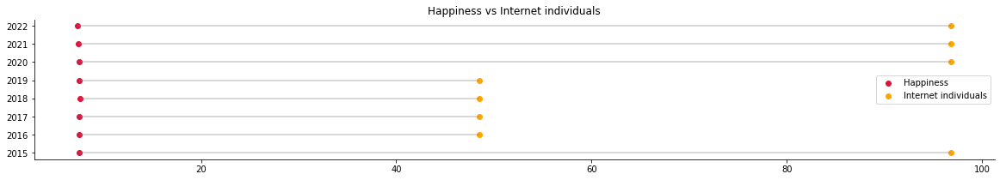

_________________________________________________________________________________________
 
Oman


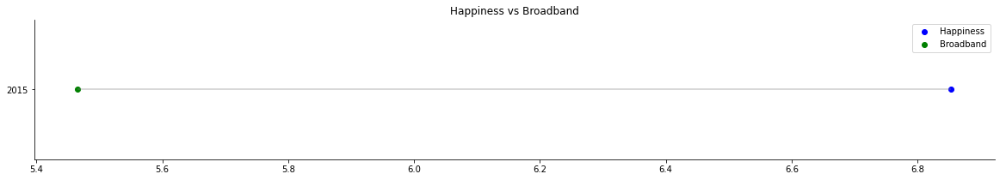

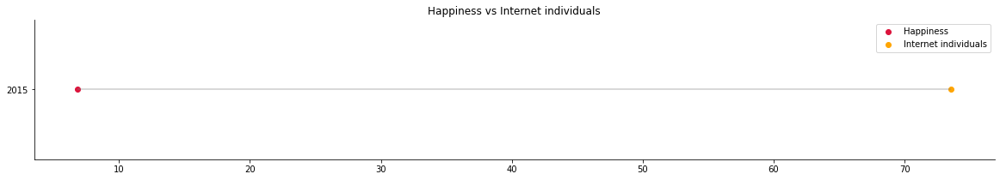

_________________________________________________________________________________________
 
Pakistan


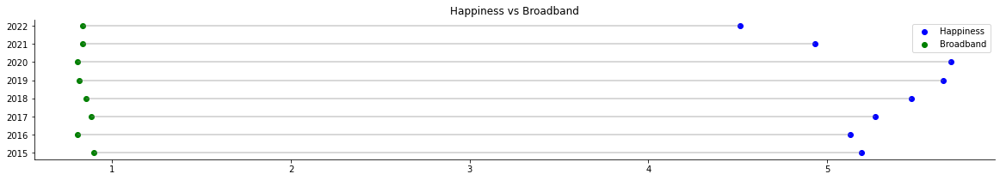

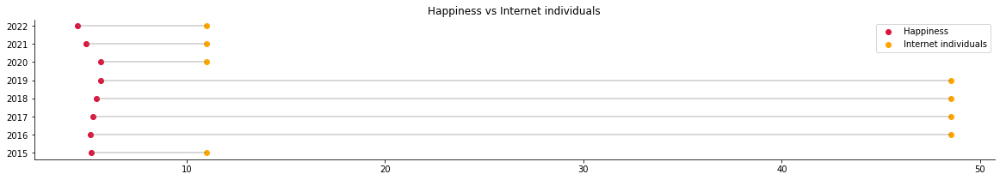

_________________________________________________________________________________________
 
Palestinian Territories


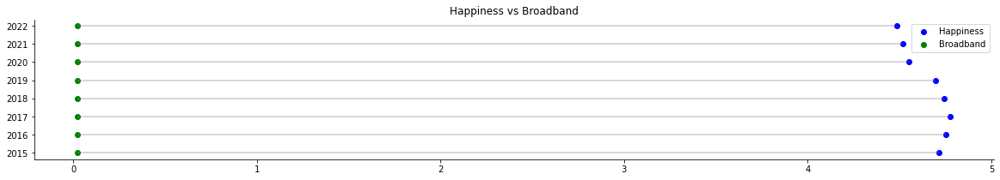

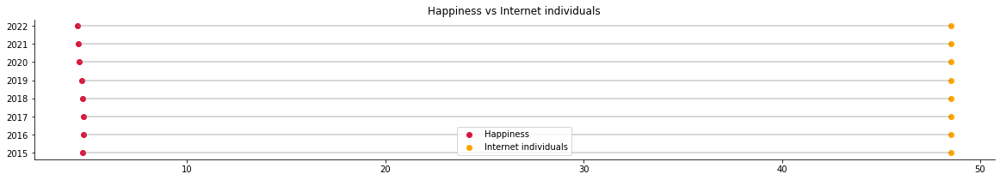

_________________________________________________________________________________________
 
Panama


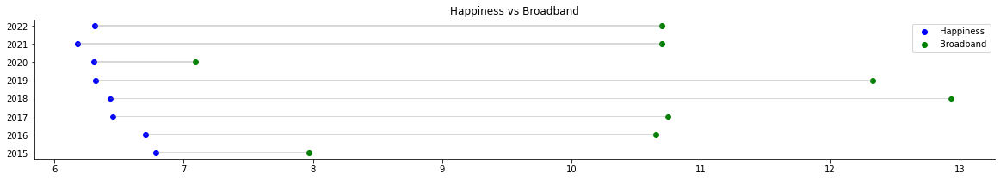

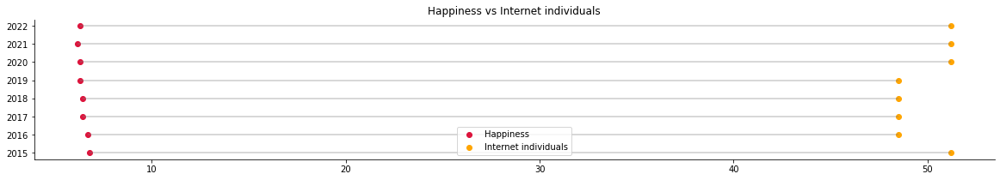

_________________________________________________________________________________________
 
Paraguay


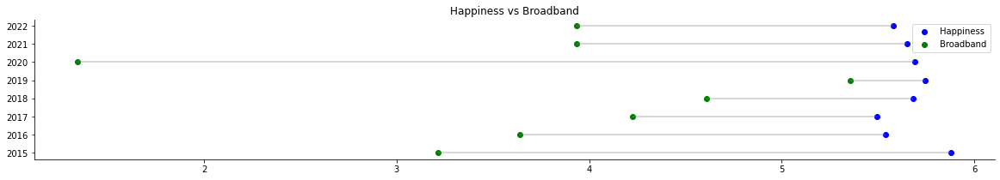

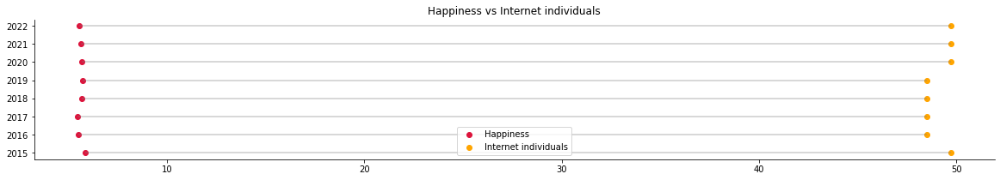

_________________________________________________________________________________________
 
Peru


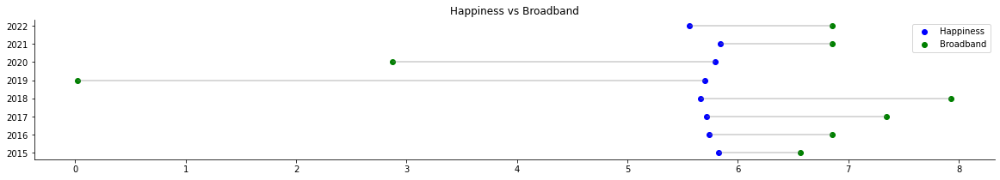

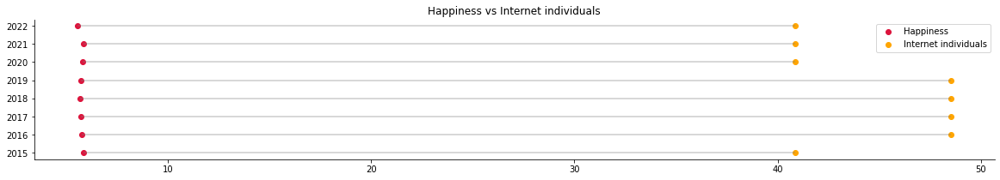

_________________________________________________________________________________________
 
Philippines


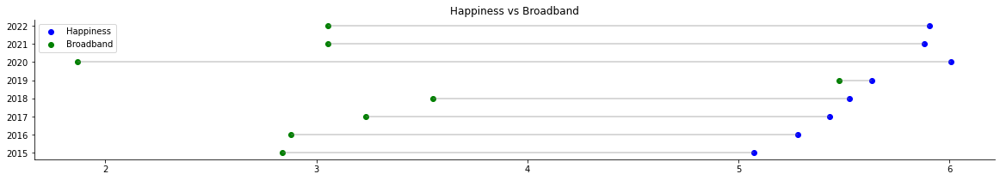

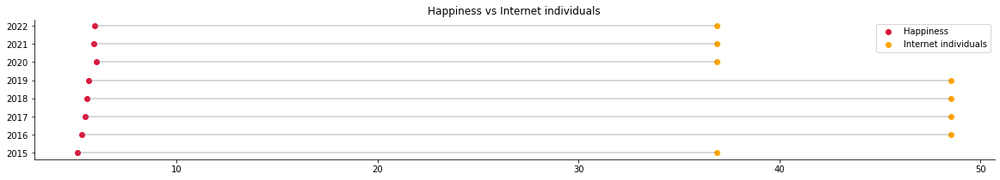

_________________________________________________________________________________________
 
Poland


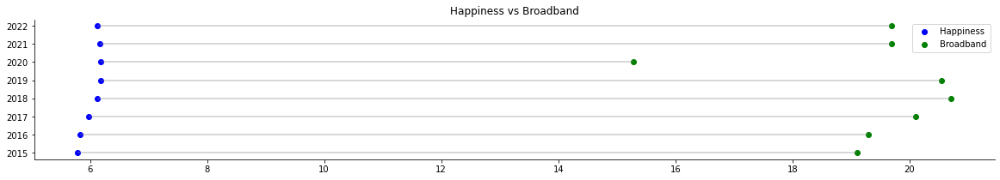

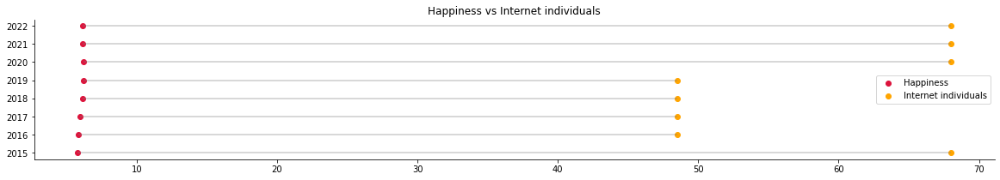

_________________________________________________________________________________________
 
Portugal


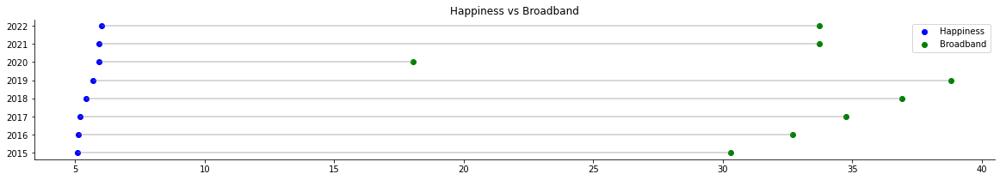

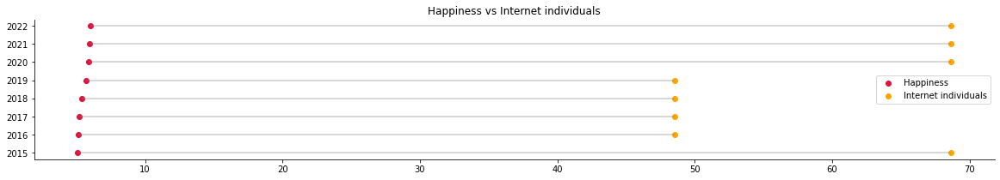

_________________________________________________________________________________________
 
Puerto Rico


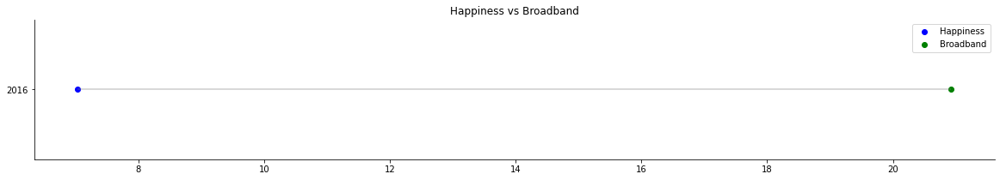

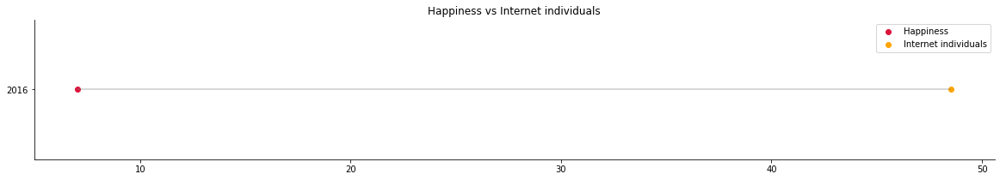

_________________________________________________________________________________________
 
Qatar


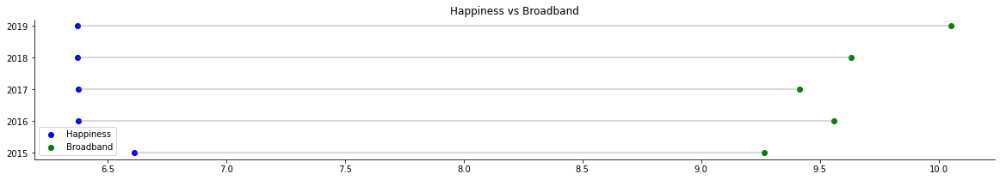

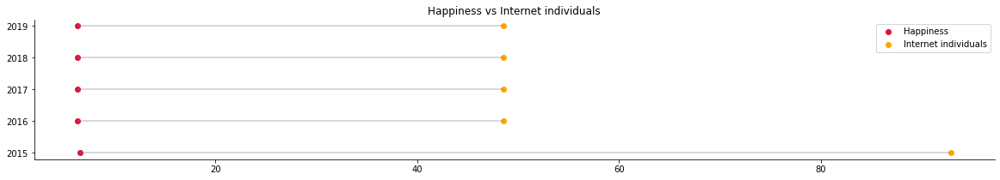

_________________________________________________________________________________________
 
Romania


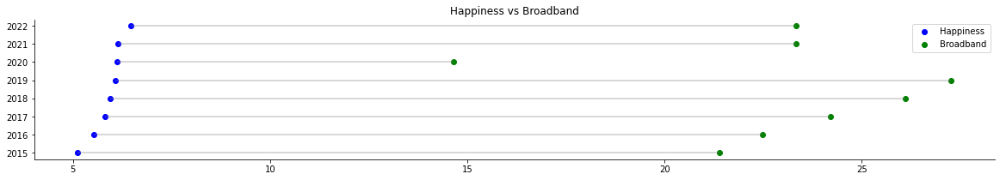

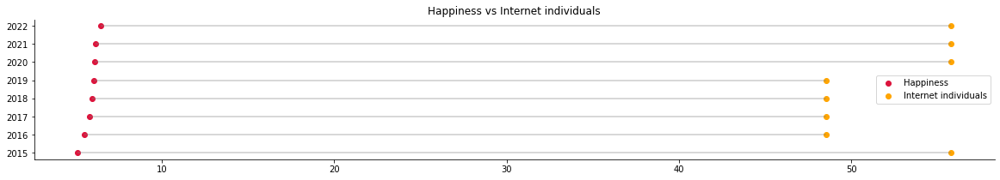

_________________________________________________________________________________________
 
Russia


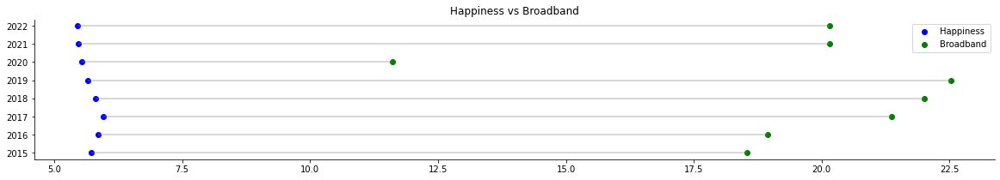

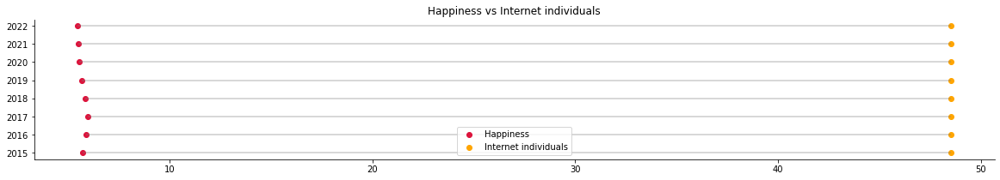

_________________________________________________________________________________________
 
Rwanda


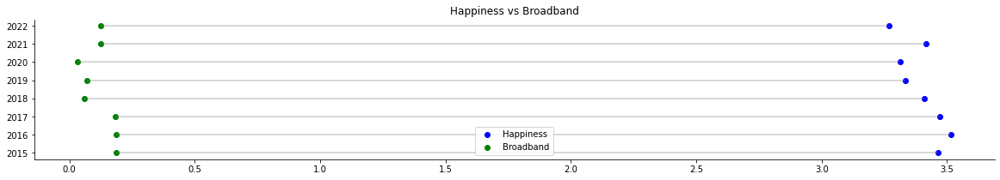

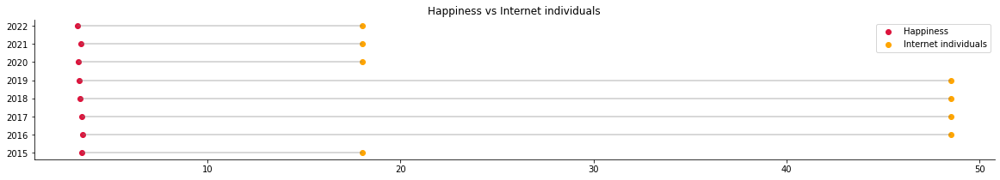

_________________________________________________________________________________________
 
Saudi Arabia


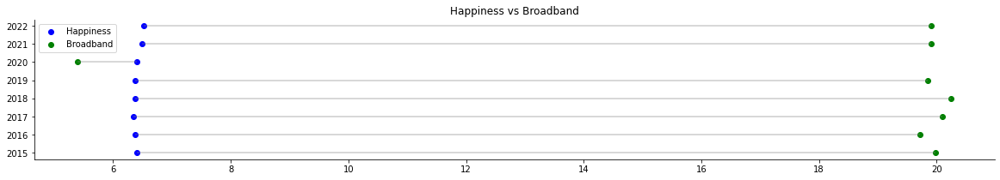

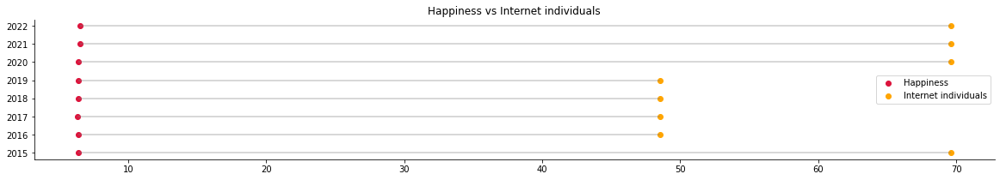

_________________________________________________________________________________________
 
Senegal


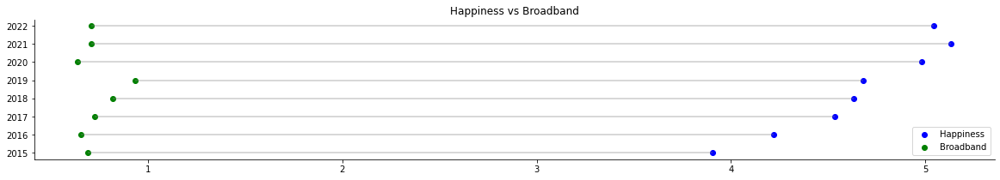

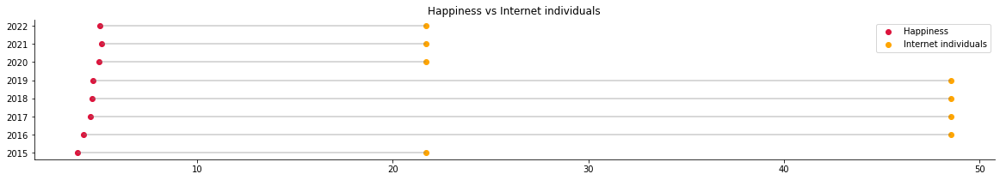

_________________________________________________________________________________________
 
Serbia


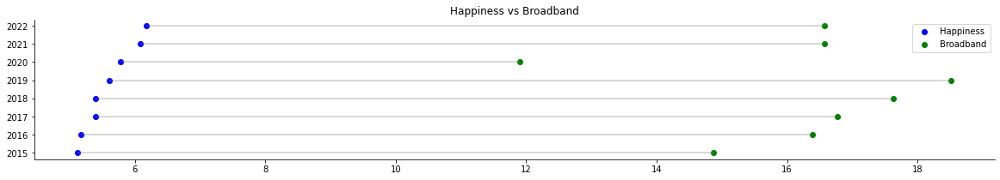

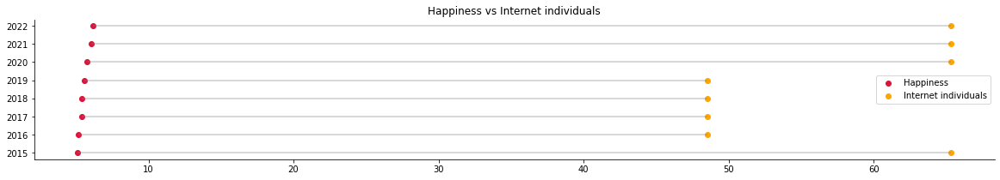

_________________________________________________________________________________________
 
Sierra Leone


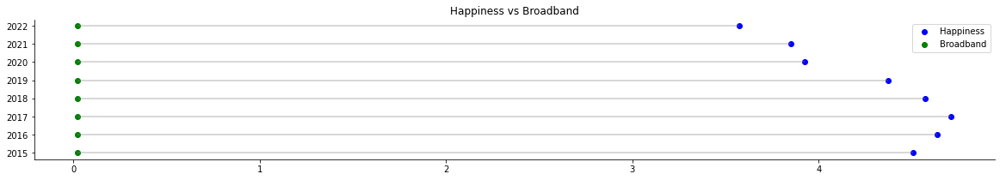

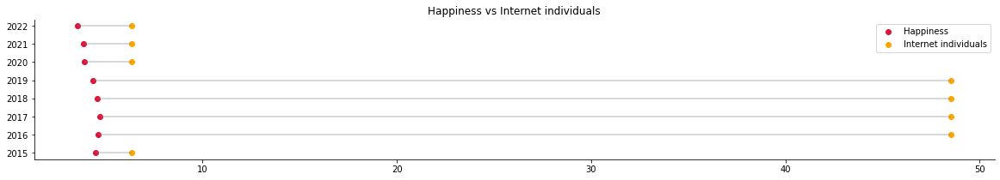

_________________________________________________________________________________________
 
Singapore


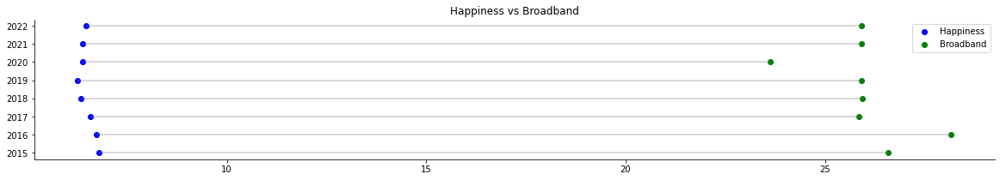

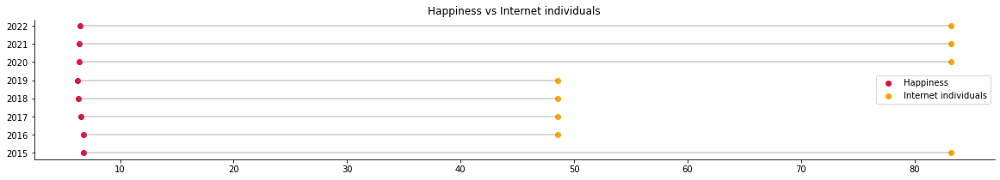

_________________________________________________________________________________________
 
Slovakia


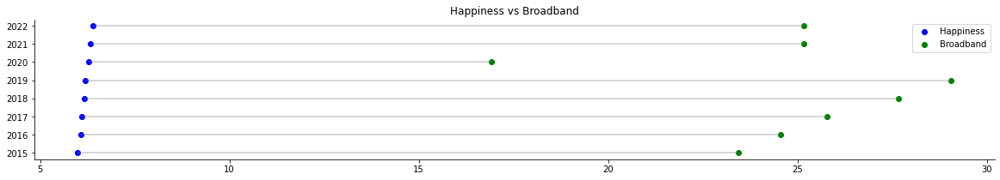

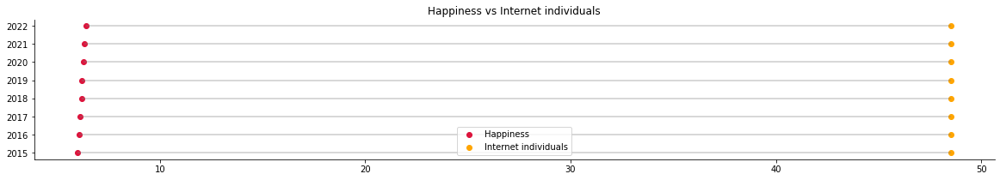

_________________________________________________________________________________________
 
Slovenia


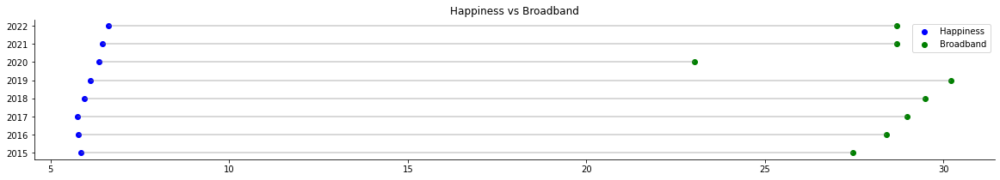

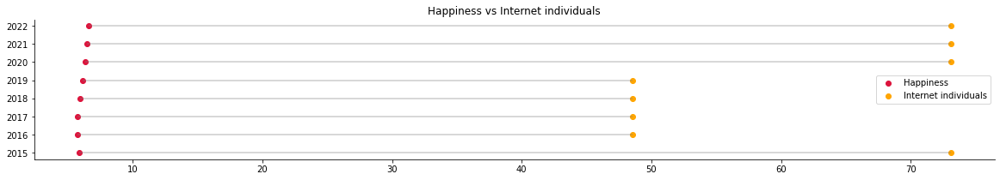

_________________________________________________________________________________________
 
Somalia


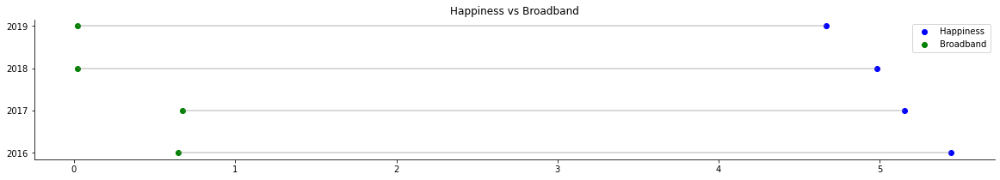

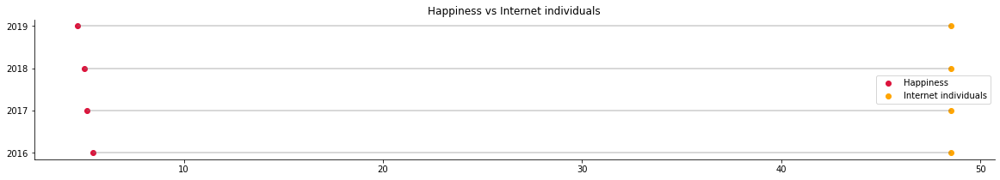

_________________________________________________________________________________________
 
Somaliland Region


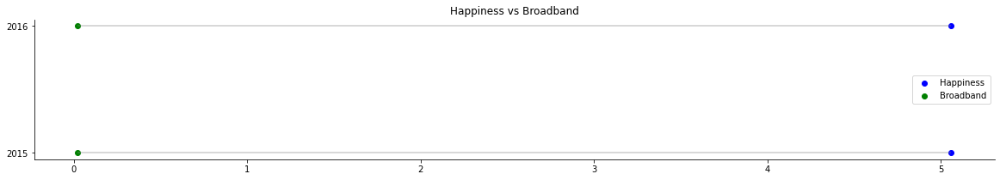

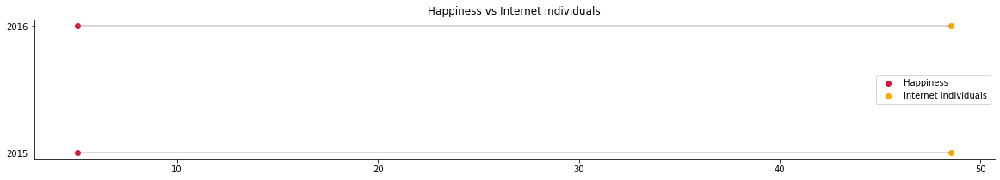

_________________________________________________________________________________________
 
South Africa


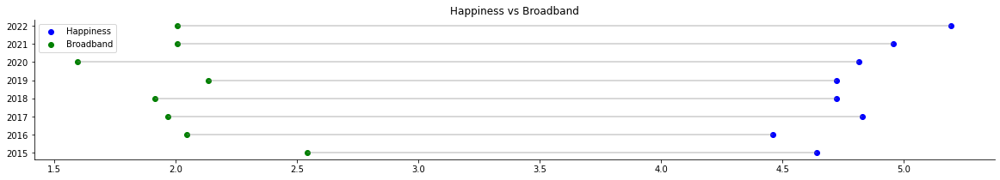

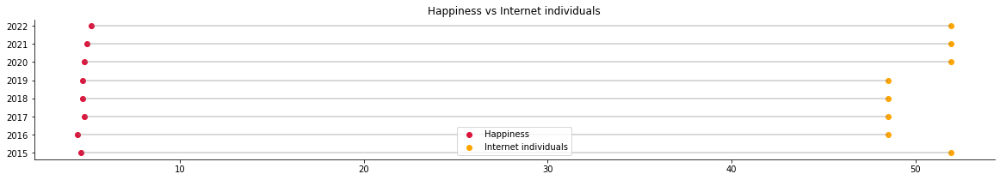

_________________________________________________________________________________________
 
South Korea


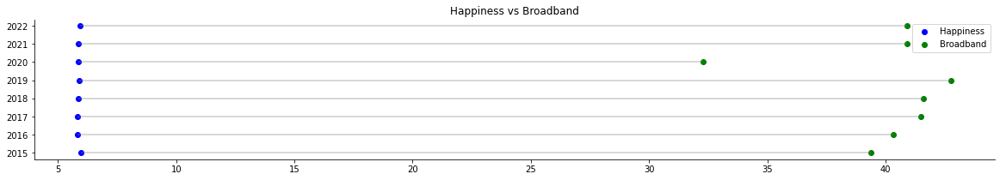

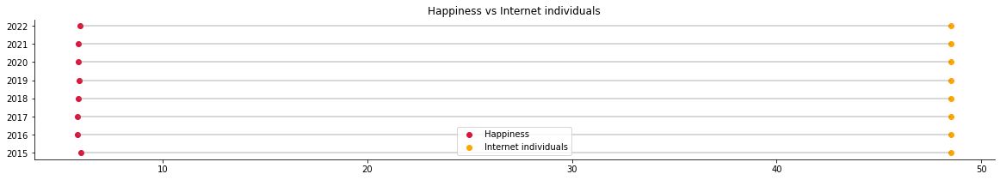

_________________________________________________________________________________________
 
South Sudan


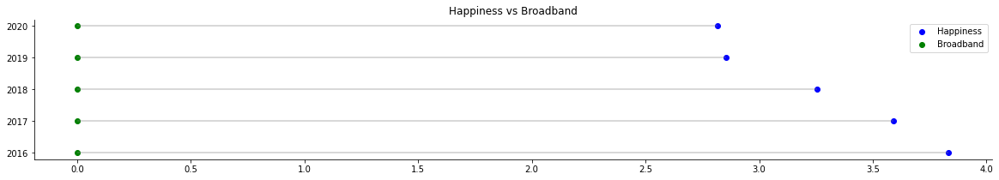

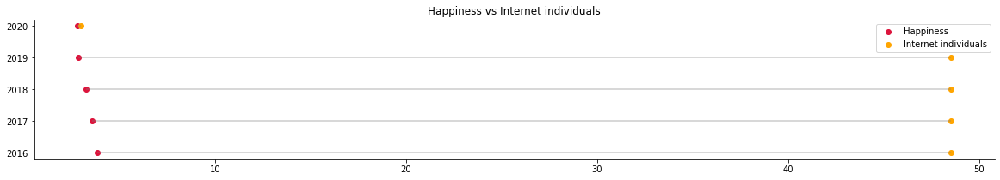

_________________________________________________________________________________________
 
Spain


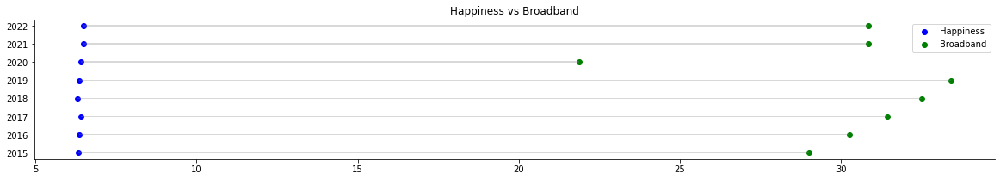

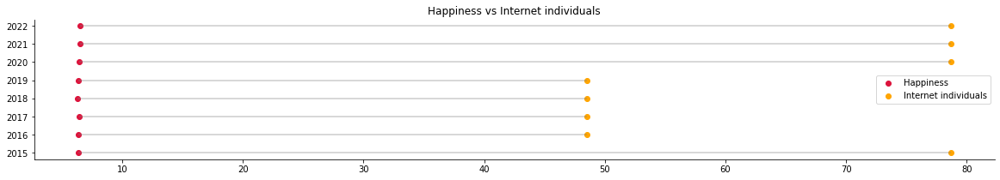

_________________________________________________________________________________________
 
Sri Lanka


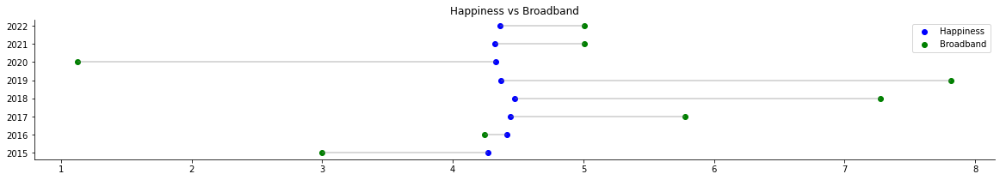

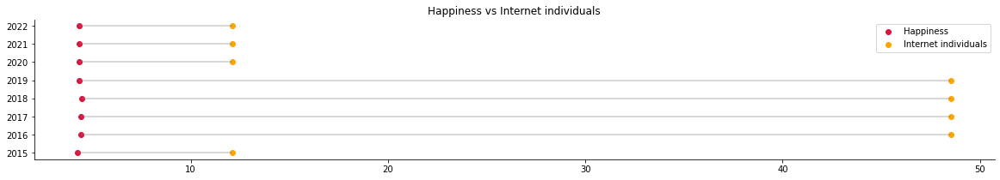

_________________________________________________________________________________________
 
Sudan


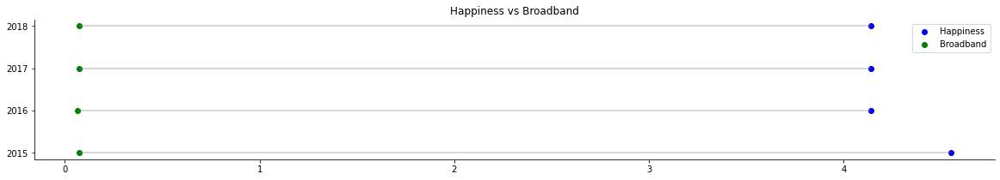

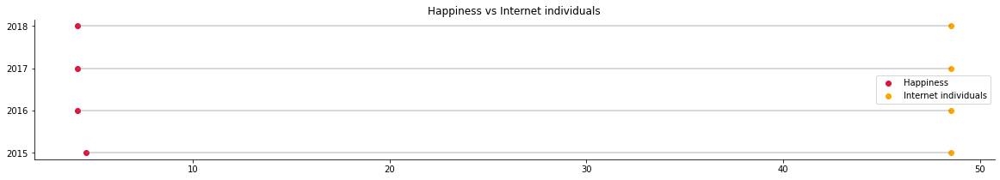

_________________________________________________________________________________________
 
Suriname


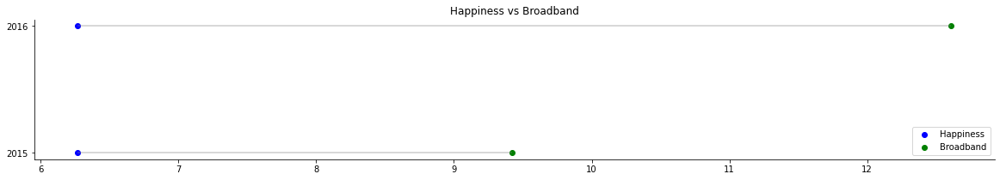

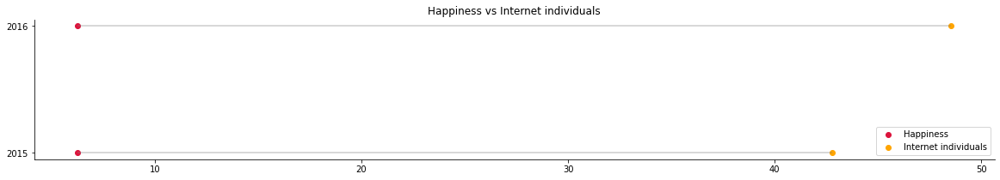

_________________________________________________________________________________________
 
Swaziland


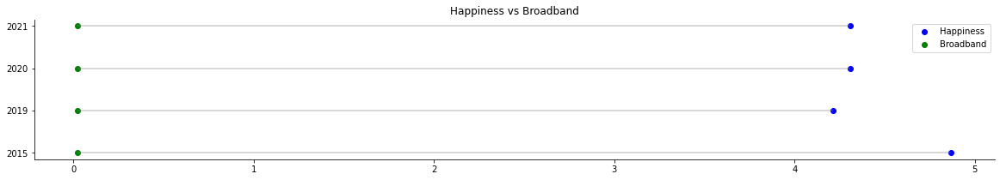

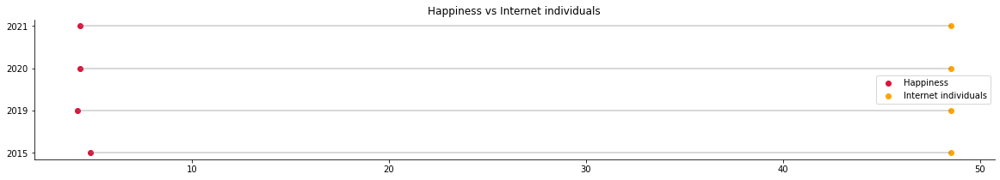

_________________________________________________________________________________________
 
Sweden


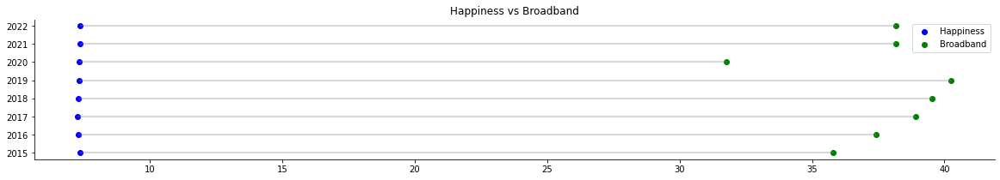

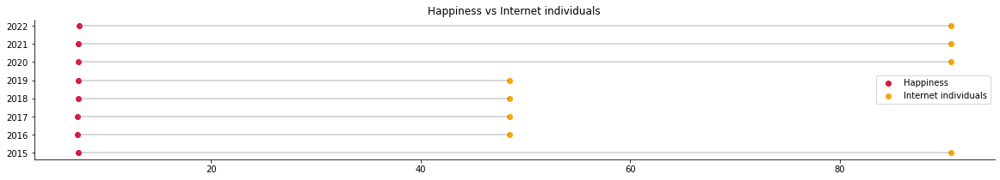

_________________________________________________________________________________________
 
Switzerland


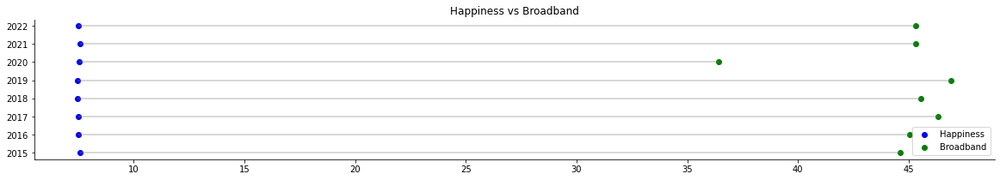

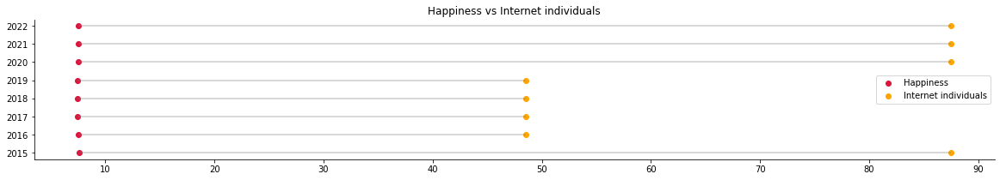

_________________________________________________________________________________________
 
Syria


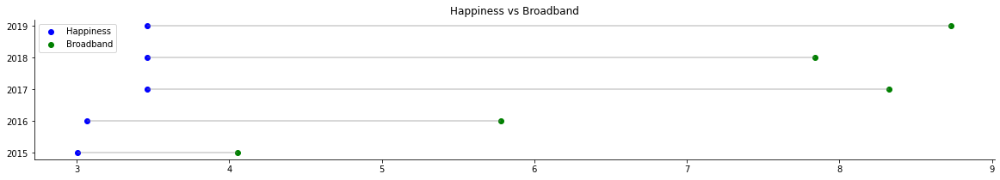

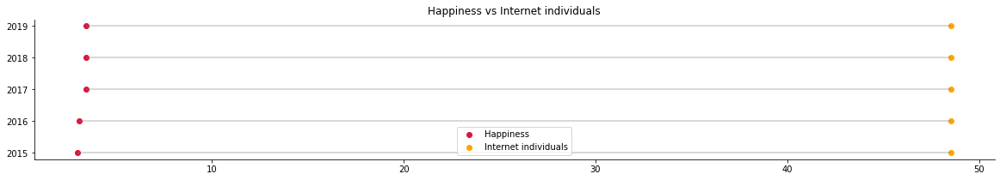

_________________________________________________________________________________________
 
Taiwan


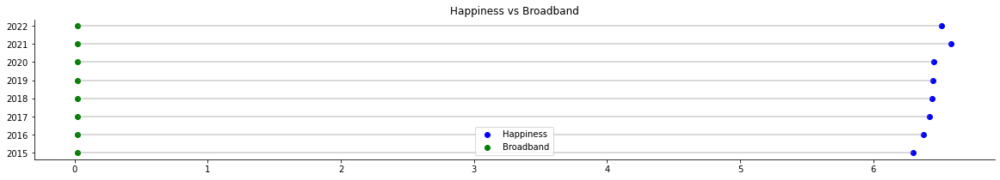

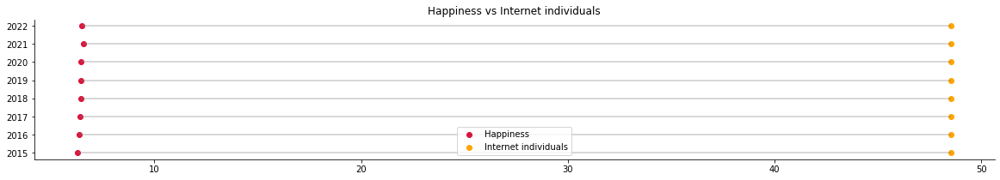

_________________________________________________________________________________________
 
Tajikistan


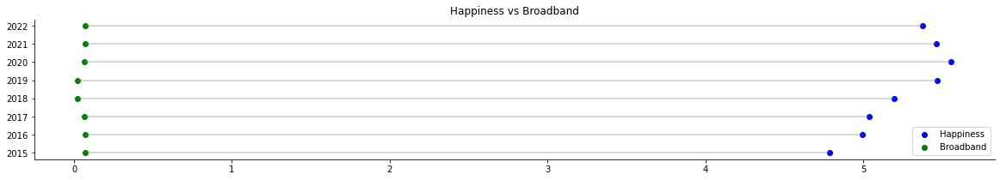

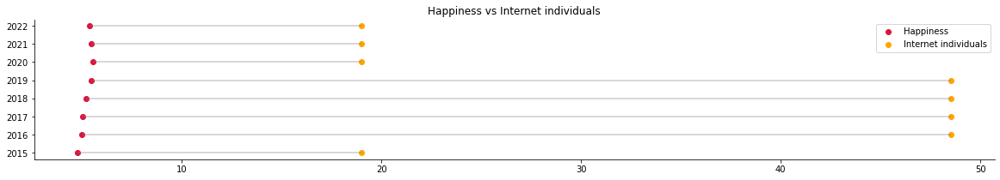

_________________________________________________________________________________________
 
Tanzania


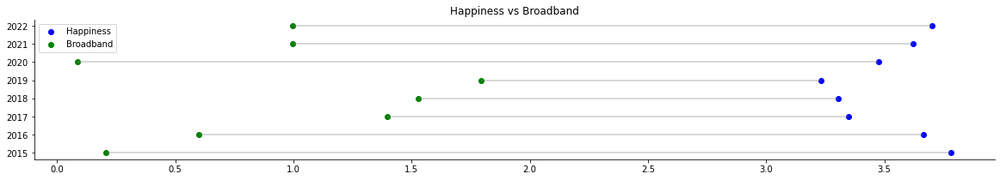

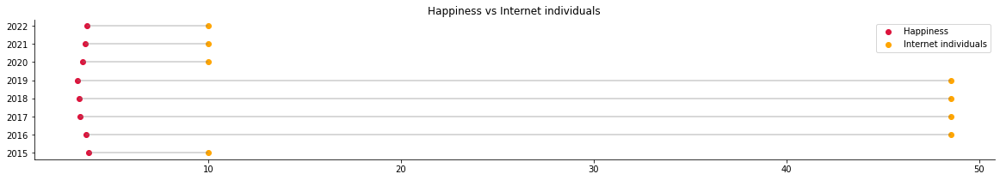

_________________________________________________________________________________________
 
Thailand


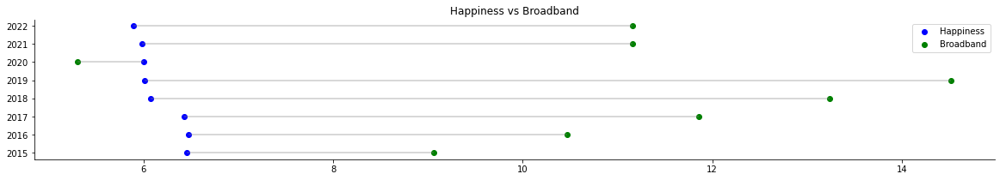

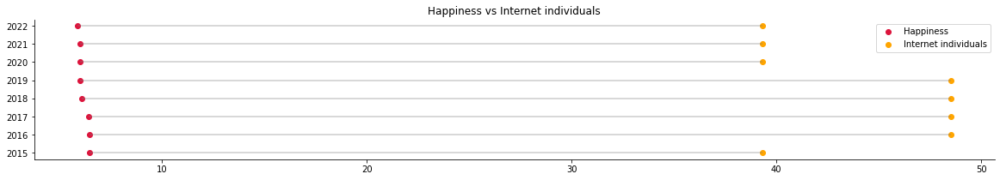

_________________________________________________________________________________________
 
Togo


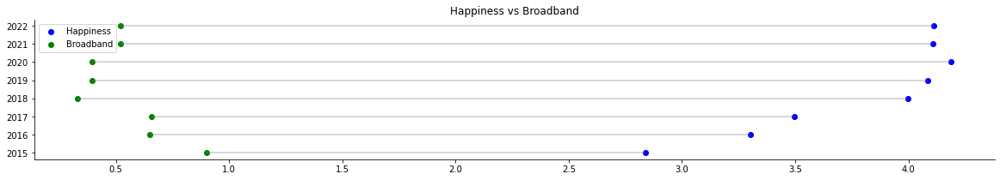

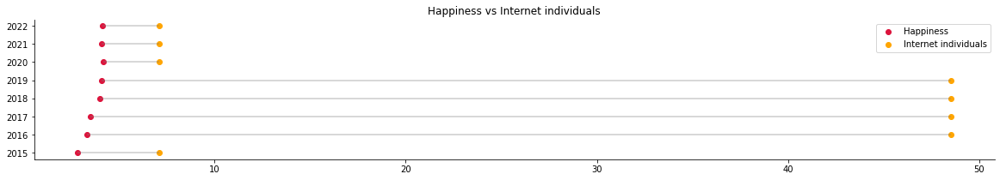

_________________________________________________________________________________________
 
Trinidad and Tobago


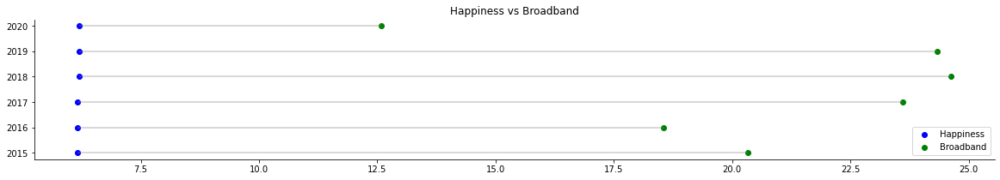

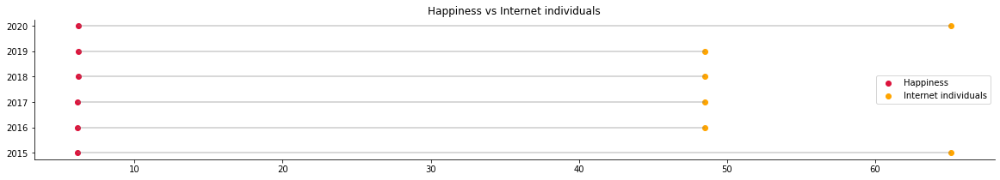

_________________________________________________________________________________________
 
Tunisia


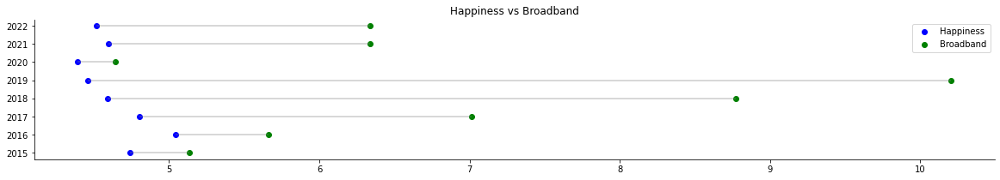

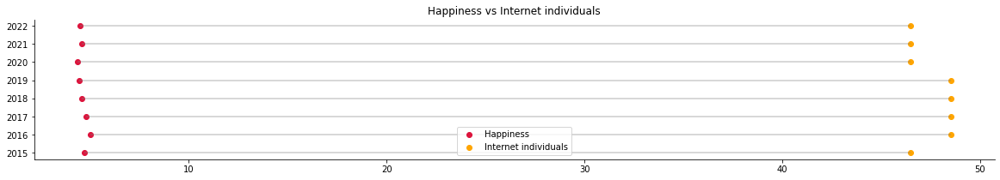

_________________________________________________________________________________________
 
Turkey


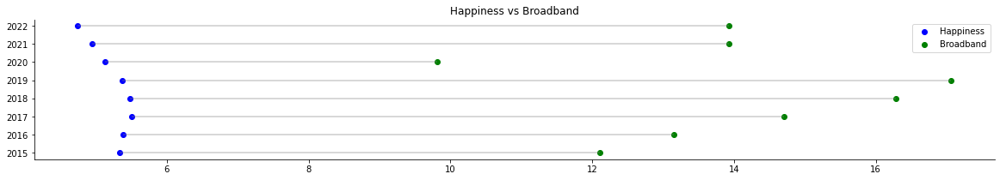

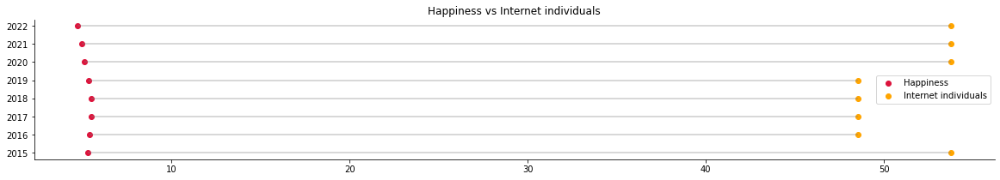

_________________________________________________________________________________________
 
Turkmenistan


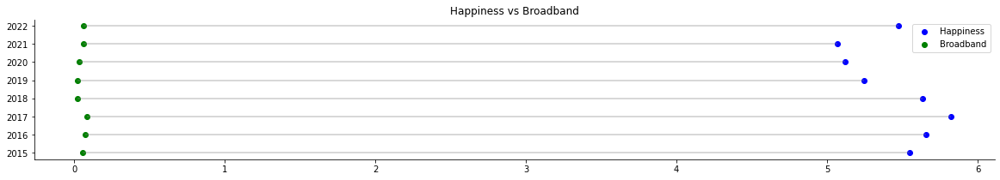

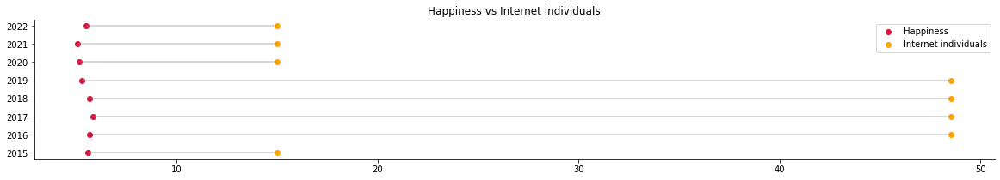

_________________________________________________________________________________________
 
Uganda


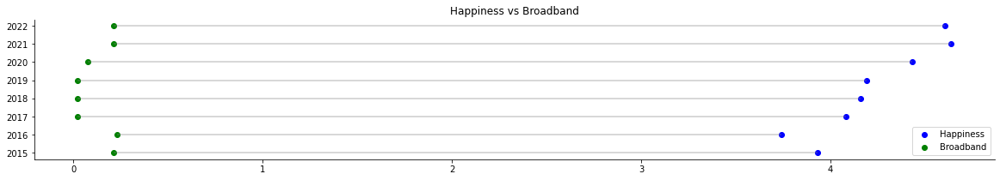

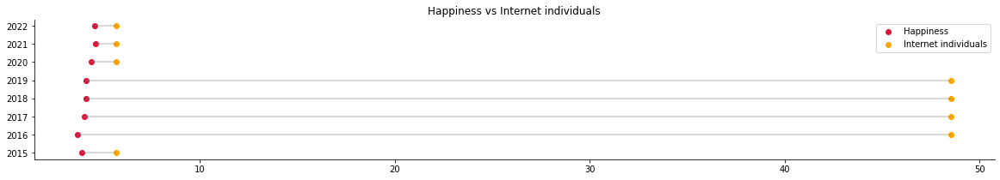

_________________________________________________________________________________________
 
Ukraine


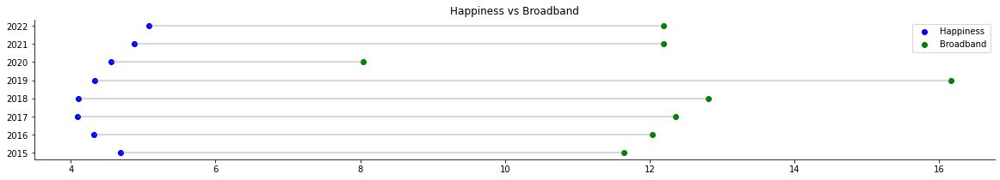

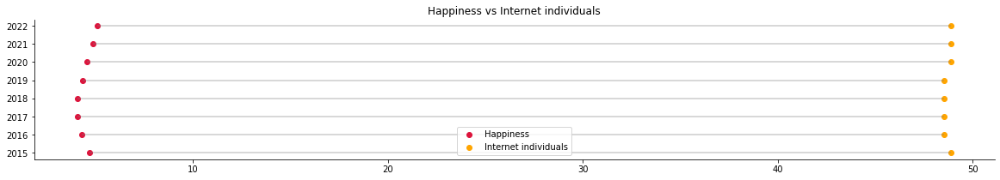

_________________________________________________________________________________________
 
United Arab Emirates


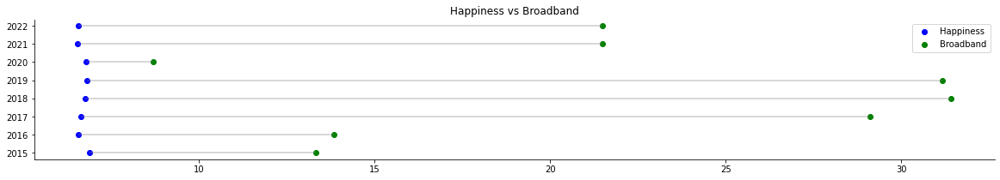

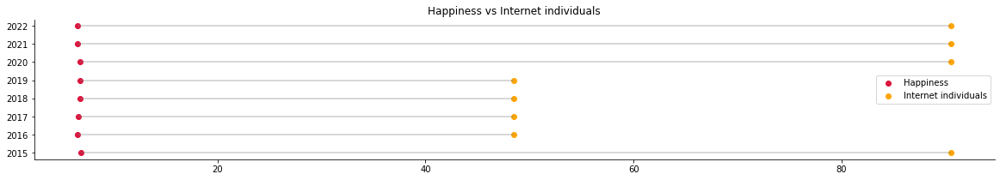

_________________________________________________________________________________________
 
United Kingdom


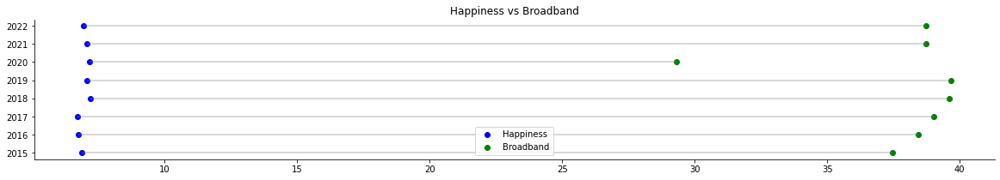

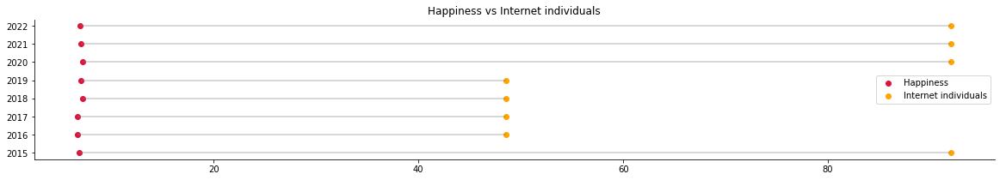

_________________________________________________________________________________________
 
United States


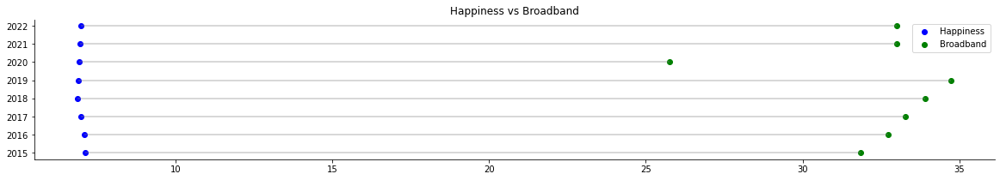

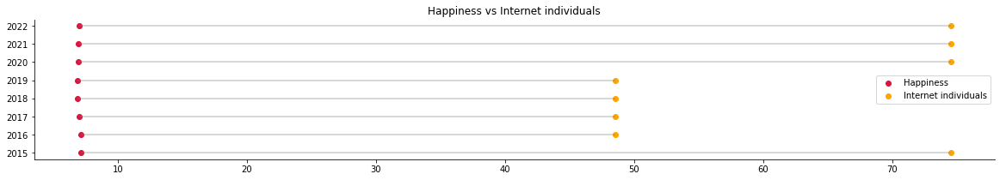

_________________________________________________________________________________________
 
Uruguay


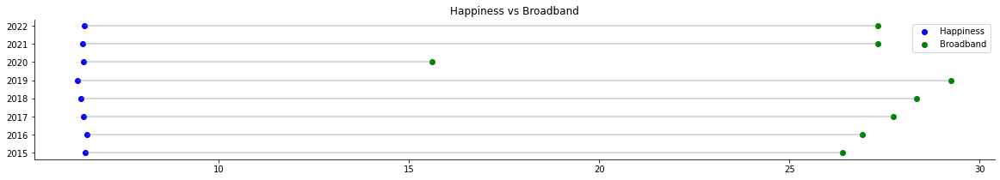

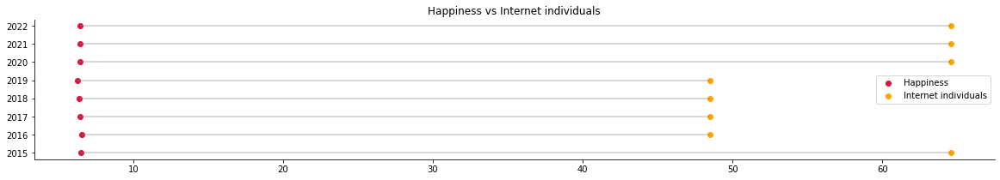

_________________________________________________________________________________________
 
Uzbekistan


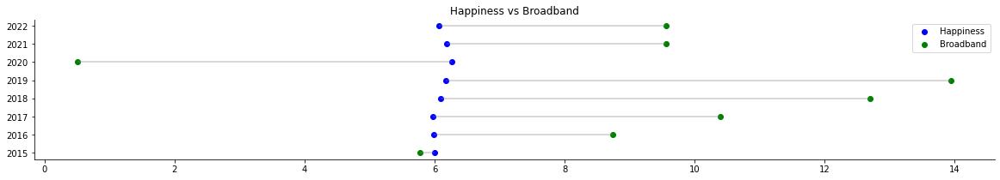

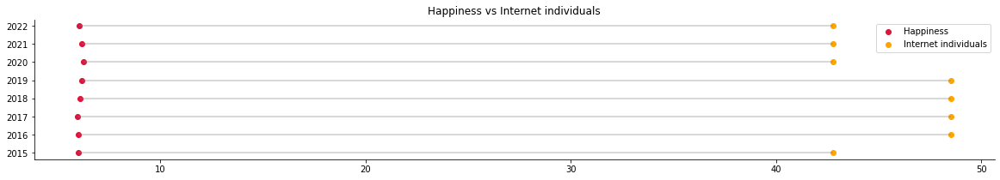

_________________________________________________________________________________________
 
Venezuela


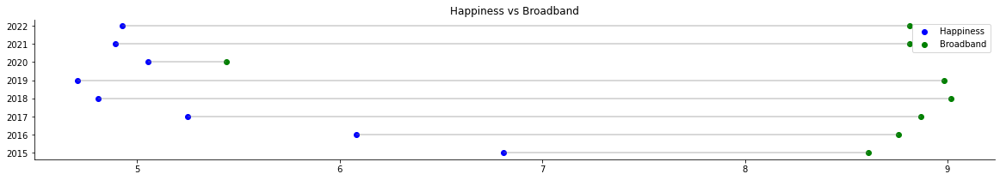

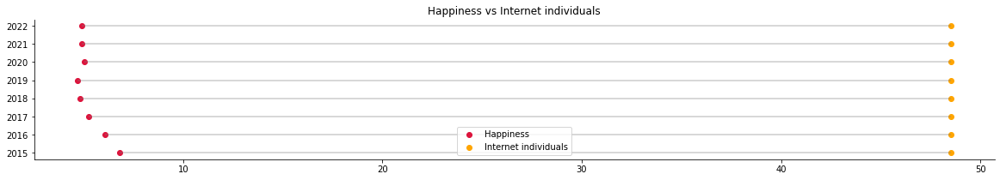

_________________________________________________________________________________________
 
Vietnam


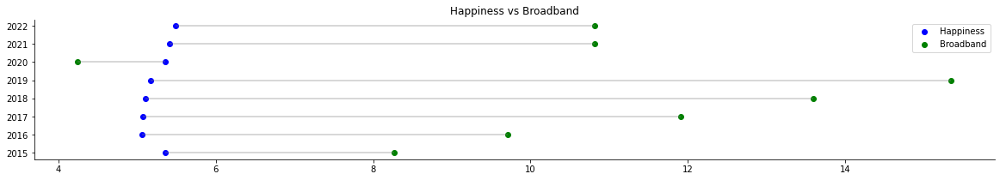

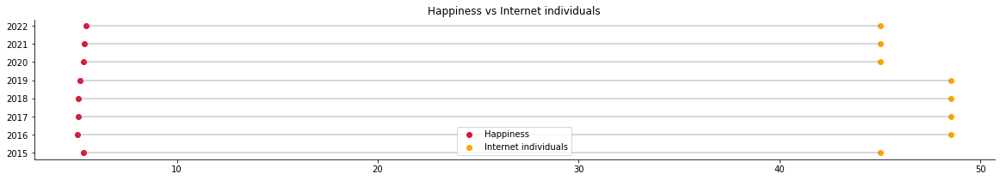

_________________________________________________________________________________________
 
Yemen


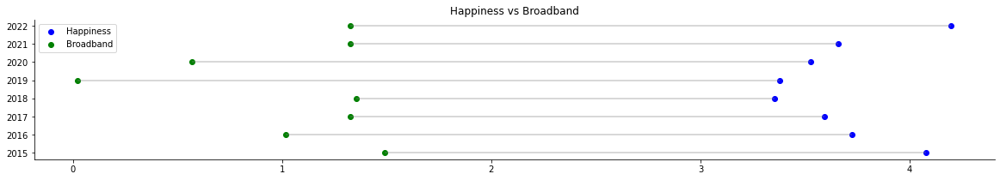

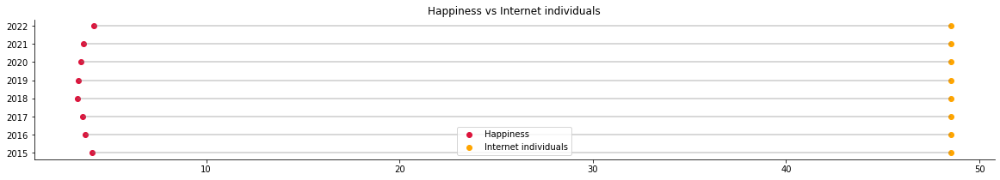

_________________________________________________________________________________________
 
Zambia


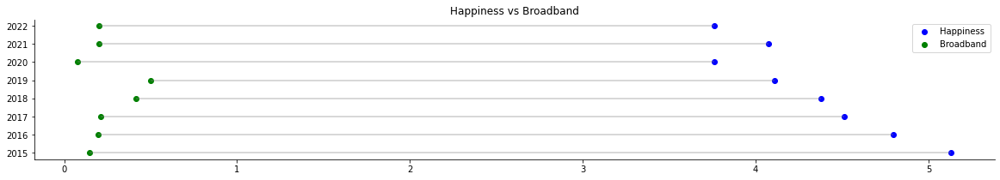

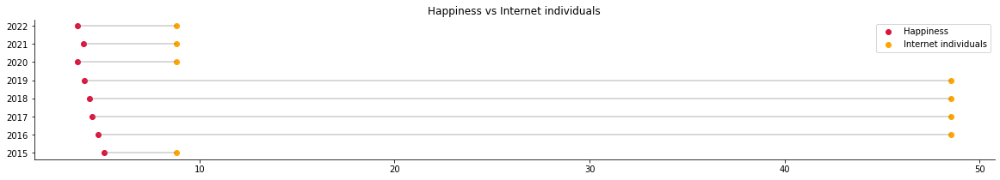

_________________________________________________________________________________________
 
Zimbabwe


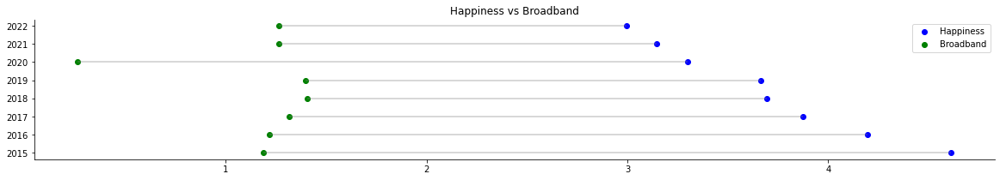

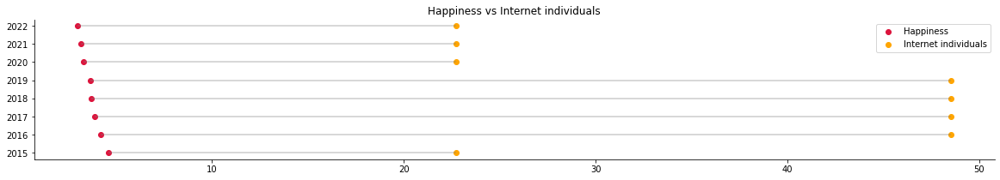

_________________________________________________________________________________________
 


In [61]:
temp_country = np.nan
whr_sort_Country_Year = whr.sort_values(["Country", "Year"], ascending = (True, True))

def plot_func(temp_whr, column, color1, color2):
    plt.figure(figsize=(20,3))
    plt.scatter(temp_whr['Happiness'], my_range, color=color1, alpha=1, label='Happiness')
    plt.scatter(temp_whr[column], my_range, color=color2, alpha=1, label=column)
    plt.hlines(y=my_range, xmin=temp_whr['Happiness'], xmax=temp_whr[column], color='grey', alpha=0.4)
    plt.yticks(my_range, temp_whr['Year'])

for row in whr_sort_Country_Year.iterrows():
    if (row[1][1] == temp_country):
        continue
    else:
        temp_country = row[1][1]
    print(row[1][1])
    temp_whr = whr_sort_Country_Year.loc[whr_sort_Country_Year['Country'] == row[1][1]]
    my_range = range(1,temp_whr.shape[0]+1)
    plot_func(temp_whr, 'Broadband','blue','green')
    plt.title("Happiness vs Broadband")
    plt.legend()
    plt.show()
    plot_func(temp_whr, 'Internet individuals','crimson','orange')
    plt.title("Happiness vs Internet individuals")
    plt.legend()
    plt.show()
    print('_________________________________________________________________________________________')
    print(' ')

Powyżej znajduje się wykres obrazujący stosunek poziomu zadowolenia do powszechności szerokopasmowego internetu oraz procentu populacji użytkującej internet. 

In [62]:
fig = px.choropleth(whr.sort_values("Year"), 
                    locations = "Country", 
                    color = "Broadband",
                    locationmode = "country names",
                    animation_frame = "Year")
fig.update_layout(title = "Broadband by Countries")
fig.show()

Mapa przedstawia globalny dostęp do szerokopasmowego internetu (2015-2022).

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

**Wczytanie plików dotyczących dzietności (średnia liczba urodzonych dzieci przez kobietę w danym kraju, w danym roku), przygotowanie i dodanie danych do DataFrame whr.**

Wczytanie danych z lat 2015-2020

In [63]:
fer1520 = pd.read_excel('fertility15-20.xlsx') 
fer1520.head(5)

,Country,Year,Fertility
0,Aruba,2015,1.85
1,Aruba,2016,1.87
2,Aruba,2017,1.89
3,Aruba,2018,1.90
4,Aruba,2019,1.90


In [64]:
fer1520new_columns = ["Year","Country","Fertility"]
fer1520 = fer1520[fer1520new_columns]
fer1520.head(5)

,Year,Country,Fertility
0,2015,Aruba,1.85
1,2016,Aruba,1.87
2,2017,Aruba,1.89
3,2018,Aruba,1.90
4,2019,Aruba,1.90


Wczytanie danych z lat 2021-2022

In [65]:
fer21 = pd.read_csv("fertility2021.csv")
fer21.head(5)

,Country,Fertility
0,WORLD,2.3
1,AFRICA,4.3
2,NORTHERN AFRICA,2.9
3,Algeria,2.8
4,Egypt,2.7


In [66]:
fer21["Year"] = 2021

In [67]:
print(fer21.columns)

Index(['Country', 'Fertility   ', 'Year'], dtype='object')


In [68]:
fer21.rename({'Fertility   ': 'Fertility'}, axis=1, inplace=True)

In [69]:
fer21new_columns = ["Year","Country","Fertility"]
fer21 = fer21[fer21new_columns]

In [70]:
fer22 = pd.read_csv("fertility2022.csv")
fer22

,name,slug,value,date_of_information,ranking,region
0,Niger,niger,6.82,2022 est.,1,Africa
1,Angola,angola,5.83,2022 est.,2,Africa
2,"Congo, Democratic Republic of the",congo-democratic-republic-of-the,5.63,2022 est.,3,Africa
3,Mali,mali,5.54,2022 est.,4,Africa
4,Chad,chad,5.46,2022 est.,5,Africa
...,...,...,...,...,...,...
221,Italy,italy,1.22,2022 est.,223,Europe
222,Macau,macau,1.22,2022 est.,224,East and Southeast Asia
223,Singapore,singapore,1.16,2022 est.,225,East and Southeast Asia
224,"Korea, South",korea-south,1.10,2022 est.,226,East and Southeast Asia


In [71]:
fer22 = fer22.drop('slug', 1)
fer22 = fer22.drop('date_of_information', 1)
fer22 = fer22.drop('ranking', 1)
fer22 = fer22.drop('region', 1)
fer22.rename({'name': 'Country', 'value': 'Fertility'}, axis=1, inplace=True)
fer22['Year'] = 2022

In [72]:
fer22new_columns = ["Year","Country","Fertility"]
fer22 = fer22[fer22new_columns]

Połączenie w jedno DF

In [73]:
fer = pd.concat([fer1520, fer21, fer22], axis=0, ignore_index=True)
fer.head(5)

,Year,Country,Fertility
0,2015,Aruba,1.85
1,2016,Aruba,1.87
2,2017,Aruba,1.89
3,2018,Aruba,1.90
4,2019,Aruba,1.90


In [74]:
fer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1947 entries, 0 to 1946
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Year       1947 non-null   int64  
 1   Country    1947 non-null   object 
 2   Fertility  1947 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 45.8+ KB


Unifikacja nazw państw

In [75]:
fer['Country'] = fer["Country"].replace('Czechia','Czech Republic', regex=True)
fer['Country'] = fer["Country"].replace('Egypt, Arab Rep.','Egypt', regex=True)
fer['Country'] = fer["Country"].replace('eSwatini','Eswatini', regex=True)
whr['Country'] = whr["Country"].replace(', Kingdom of','', regex=True)
fer['Country'] = fer["Country"].replace('Gambia, The','Gambia', regex=True)
fer['Country'] = fer["Country"].replace('China Hong Kong SAR','Hong Kong', regex=True)
fer['Country'] = fer["Country"].replace('Hong Kong SAR, China','Hong Kong', regex=True)
fer['Country'] = fer["Country"].replace('Iran, Islamic Rep.','Iran', regex=True)
fer['Country'] = fer["Country"].replace('Palestinian Territory','Palestinian Territories', regex=True)
fer['Country'] = fer["Country"].replace('Russian Federation','Russia', regex=True)
fer['Country'] = fer["Country"].replace('Korea South','South Korea', regex=True)
fer['Country'] = fer["Country"].replace('Korea, Rep.','South Korea', regex=True)
fer['Country'] = fer["Country"].replace('Korea, South','South Korea', regex=True)
fer['Country'] = fer["Country"].replace('Syrian Arab Republic','Syria', regex=True)
fer['Country'] = fer["Country"].replace('Venezuela, RB','Venezuela', regex=True)
fer['Country'] = fer["Country"].replace('Yemen, Rep.','Yemen', regex=True)


In [76]:
print(f'Congo: {fer.Country.str.count("Congo").sum()}')
print(f'Congo Dem. Rep.: {fer.Country.str.count("Congo Dem. Rep.").sum()}')
print(f'Congo, Dem. Rep.: {fer.Country.str.count("Congo, Dem. Rep.").sum()}')
print(f'Congo, Democratic Republic of the: {fer.Country.str.count("Congo, Democratic Republic of the").sum()}')
print(f'Congo, Rep.: {fer.Country.str.count("Congo, Rep.").sum()}')
print(f'Congo, Republic of the: {fer.Country.str.count("Congo, Republic of the").sum()}')

Congo: 16
Congo Dem. Rep.: 1
Congo, Dem. Rep.: 6
Congo, Democratic Republic of the: 1
Congo, Rep.: 7
Congo, Republic of the: 1


In [77]:
fer['Country'] =  fer['Country'].apply(lambda x: x.replace('Congo, Republic of the','Congo Brazzaville'))

fer['Country'] =  fer['Country'].apply(lambda x: x.replace('Congo, Rep.','Congo Brazzaville'))

fer['Country'] =  fer['Country'].apply(lambda x: x.replace('Congo Dem. Rep.',
                                                           'Congo').replace('Congo, Dem. Rep.',
                                                            'Congo').replace('Congo, Democratic Republic of the', 'Congo'))

Połączenie whr oraz fer

In [78]:
whr = pd.merge(whr, fer, how='left')
whr.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals,Fertility
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738,44.602427,87.479056,1.54
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201,37.680133,98.200000,1.80
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204,42.276164,96.330502,1.71
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531,39.433167,96.810326,1.72
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176,36.404624,90.000000,1.60


Ze względu na brakujące dane dla niektórych państw uzupełniamy je wartością średnią, w przypadku kiedy dane dla danego kraju są częściowe.

In [79]:
filtered = whr[whr["Country"] == "Taiwan"]

In [80]:
filtered["Fertility"].mean()

1.04

In [81]:
whr[whr["Country"] == "Taiwan"] = whr[whr["Country"] == "Taiwan"].fillna(value=filtered["Fertility"].mean())

In [82]:
filslovakia = whr[whr["Country"] == "Slovakia"]
whr[whr["Country"] == "Slovakia"] = whr[whr["Country"] == "Slovakia"].fillna(value=filslovakia["Fertility"].mean())

In [83]:
filkyrgyzstan = whr[whr["Country"] == "Kyrgyzstan"]
whr[whr["Country"] == "Kyrgyzstan"] = whr[whr["Country"] == "Kyrgyzstan"].fillna(value=filkyrgyzstan["Fertility"].mean())

In [84]:
fillaos = whr[whr["Country"] == "Laos"]
whr[whr["Country"] == "Laos"] = whr[whr["Country"] == "Laos"].fillna(value=fillaos["Fertility"].mean())

In [85]:
filpales = whr[whr["Country"] == "Palestinian Territories"]
whr[whr["Country"] == "Palestinian Territories"] = whr[whr["Country"] == "Palestinian Territories"].fillna(
    value=filpales["Fertility"].mean())

In [86]:
filbosnia = whr[whr["Country"] == "Bosnia and Herzegovina"]
whr[whr["Country"] == "Bosnia and Herzegovina"] = whr[whr["Country"] == "Bosnia and Herzegovina"].fillna(
    value=filbosnia["Fertility"].mean())

In [87]:
filcongo = whr[whr["Country"] == "Congo Brazzaville"]
whr[whr["Country"] == "Congo Brazzaville"] = whr[whr["Country"] == "Congo Brazzaville"].fillna(
    value=filcongo["Fertility"].mean())

In [88]:
filturk = whr[whr["Country"] == "Turkey"]
whr[whr["Country"] == "Turkey"] = whr[whr["Country"] == "Turkey"].fillna(value=filturk["Fertility"].mean())

In [89]:
filmyanmar = whr[whr["Country"] == "Myanmar"]
whr[whr["Country"] == "Myanmar"] = whr[whr["Country"] == "Myanmar"].fillna(value=filmyanmar["Fertility"].mean())

In [90]:
whr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1230 entries, 0 to 1229
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Year                  1230 non-null   int64  
 1   Country               1230 non-null   object 
 2   Happiness             1230 non-null   float64
 3   GDP per capita        1230 non-null   float64
 4   Social support        1230 non-null   float64
 5   Life Exp              1230 non-null   float64
 6   Freedom               1230 non-null   float64
 7   Generosity            1230 non-null   float64
 8   Gov Corruption        1230 non-null   float64
 9   Dystopia Residual     1230 non-null   float64
 10  Broadband             1230 non-null   float64
 11  Internet individuals  1230 non-null   float64
 12  Fertility             1203 non-null   float64
dtypes: float64(11), int64(1), object(1)
memory usage: 134.5+ KB


Zostalo 27 nanow

In [91]:
print(str(round(whr['Fertility'].isnull().sum()/whr['Fertility'].shape[0]*100,2))+
      '% obserwacji w kolumnie Fertility zawiera braki w danych.')

2.2% obserwacji w kolumnie Fertility zawiera braki w danych.


Zdecydowaliśmy o zastąpieniu wartości nullowych w kolumnie Fertility wartością najczęściej występującą (mode).

In [92]:
mode_Fertility = whr['Fertility'].mode()[0]

In [93]:
whr['Fertility'] = whr['Fertility'].fillna(mode_Fertility)

In [94]:
summary = pd.DataFrame(whr.dtypes, columns=['Dtype'])
summary['Nulls'] = pd.DataFrame(whr.isnull().any())
summary['Sum_of_nulls'] = pd.DataFrame(whr.isnull().sum())
summary['Per_of_nulls'] = round((whr.apply(pd.isnull).mean()*100), 2)
summary.Dtype = summary.Dtype.astype(str)
summary

,Dtype,Nulls,Sum_of_nulls,Per_of_nulls
Year,int64,False,0,0.0
Country,object,False,0,0.0
Happiness,float64,False,0,0.0
GDP per capita,float64,False,0,0.0
Social support,float64,False,0,0.0
Life Exp,float64,False,0,0.0
Freedom,float64,False,0,0.0
Generosity,float64,False,0,0.0
Gov Corruption,float64,False,0,0.0
Dystopia Residual,float64,False,0,0.0


In [95]:
fig = px.choropleth(whr.sort_values("Year"), 
                    locations = "Country", 
                    color = "Fertility",
                    locationmode = "country names",
                    animation_frame = "Year")
fig.update_layout(title = "Fertility by Countries")
fig.show()

Mapa przedstawia poziom dzietności w krajach świata.

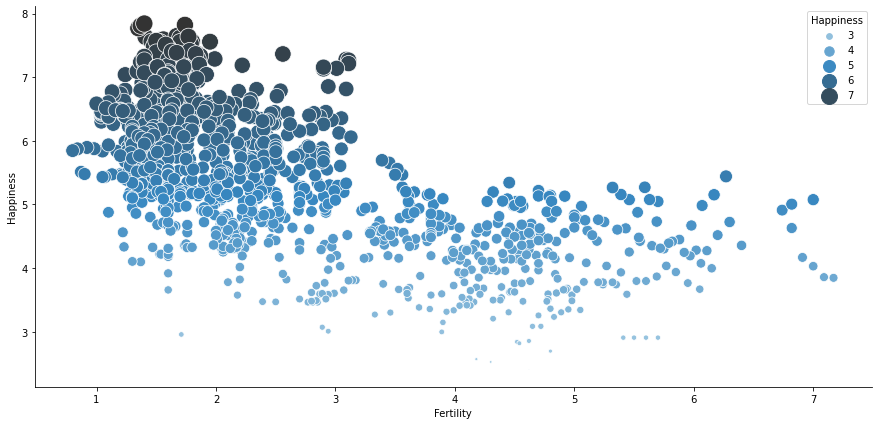

In [96]:
fig, ax = plt.subplots(figsize=(15,7))

sns.scatterplot(x='Fertility', y='Happiness', data=whr, 
                hue='Happiness',palette="Blues_d", 
                size='Happiness', sizes=(0.3, 300))

plt.show()

Jak widać na wykresie największe zadowolenie jest wtedy, gdy liczba urodzonych dzieci jest pomiędzy jednym a trojgiem dzieci.

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

### Sunshine

### Usłonecznienie – sumaryczny czas (w godzinach) w danym okresie (zazwyczaj dzień lub rok), podczas którego na określone miejsce na powierzchni Ziemi padają bezpośrednio promienie Słońca. 

**Wczytanie zbioru sunshine hours by city i usunięcie zbędnych kolumn oraz uzupełnienie medianą wartości dla krajów, w których jest więcej niż 1 odczyt.**

In [97]:
sunshine = pd.read_csv('sunshine hours by city.csv')
sunshine.rename({'Year': 'Annual sunshine'}, axis=1, inplace=True)
sunshine.drop(['City', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
               'Dec'], axis=1, inplace=True)
sunshine = sunshine.groupby(["Country"])[["Annual sunshine"]].median()
sunshine.reset_index(inplace = True)
sunshine

,Country,Annual sunshine
0,Afghanistan,3175.1
1,Albania,2544.0
2,Algeria,3266.5
3,Angola,2341.0
4,Argentina,2404.2
...,...,...
135,Uzbekistan,2823.9
136,Venezuela,2894.8
137,Vietnam,2210.0
138,Zambia,2935.7


In [98]:
fig = px.choropleth(sunshine.sort_values("Annual sunshine"), 
                    locations = "Country", 
                    color = "Annual sunshine",
                    locationmode = "country names")
fig.update_layout(title = "Annual sunshine")
fig.show()

Powyższe zestawienie pokazuje usłonecznienie poszczególnych krajów świata znajdujących się w naszym zbiorze.

**Połączenie zbiorów whr i sunshine**

In [99]:
whr = pd.merge(whr, sunshine, on='Country', how='left')
whr

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals,Fertility,Annual sunshine
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738,44.602427,87.479056,1.54,2003.5
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201,37.680133,98.200000,1.80,1326.0
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204,42.276164,96.330502,1.71,1912.0
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531,39.433167,96.810326,1.72,1265.0
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176,36.404624,90.000000,1.60,2051.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1225,2022,Botswana,3.471,1.50300,0.81500,0.28000,0.57100,0.01200,0.10200,0.18700,1.756953,37.312050,2.39,3371.0
1226,2022,Rwanda,3.268,0.78500,0.13300,0.46200,0.62100,0.18700,0.54400,0.53600,0.126077,18.000000,3.33,NaN
1227,2022,Zimbabwe,2.995,0.94700,0.69000,0.27000,0.32900,0.10600,0.10500,0.54800,1.266664,22.742818,3.89,3065.4
1228,2022,Lebanon,2.955,1.39200,0.49800,0.63100,0.10300,0.08200,0.03400,0.21600,4.611091,74.000000,1.71,NaN


In [100]:
summary = pd.DataFrame(whr.dtypes, columns=['Dtype'])
summary['Nulls'] = pd.DataFrame(whr.isnull().any())
summary['Sum_of_nulls'] = pd.DataFrame(whr.isnull().sum())
summary['Per_of_nulls'] = round((whr.apply(pd.isnull).mean()*100), 2)
summary.Dtype = summary.Dtype.astype(str)
summary

,Dtype,Nulls,Sum_of_nulls,Per_of_nulls
Year,int64,False,0,0.00
Country,object,False,0,0.00
Happiness,float64,False,0,0.00
GDP per capita,float64,False,0,0.00
Social support,float64,False,0,0.00
Life Exp,float64,False,0,0.00
Freedom,float64,False,0,0.00
Generosity,float64,False,0,0.00
Gov Corruption,float64,False,0,0.00
Dystopia Residual,float64,False,0,0.00


In [101]:
print(str(round(whr['Annual sunshine'].isnull().sum()/whr['Annual sunshine'].shape[0]*100,2))+
      '% obserwacji w kolumnie Annual sunshine zawiera braki w danych.')

22.93% obserwacji w kolumnie Annual sunshine zawiera braki w danych.


Zdecydowaliśmy o zastąpieniu wartości nullowych w kolumnie Annual sunshine medianą (median)

In [102]:
median_Annual_sunshine = whr['Annual sunshine'].median()

In [103]:
whr['Annual sunshine'] = whr['Annual sunshine'].fillna(median_Annual_sunshine)

In [104]:
summary = pd.DataFrame(whr.dtypes, columns=['Dtype'])
summary['Nulls'] = pd.DataFrame(whr.isnull().any())
summary['Sum_of_nulls'] = pd.DataFrame(whr.isnull().sum())
summary['Per_of_nulls'] = round((whr.apply(pd.isnull).mean()*100), 2)
summary.Dtype = summary.Dtype.astype(str)
summary

,Dtype,Nulls,Sum_of_nulls,Per_of_nulls
Year,int64,False,0,0.0
Country,object,False,0,0.0
Happiness,float64,False,0,0.0
GDP per capita,float64,False,0,0.0
Social support,float64,False,0,0.0
Life Exp,float64,False,0,0.0
Freedom,float64,False,0,0.0
Generosity,float64,False,0,0.0
Gov Corruption,float64,False,0,0.0
Dystopia Residual,float64,False,0,0.0


**Zależność szczęśliwości od stopnia usłonecznienia obrazuje poniższy wykres**

In [105]:
fig = px.sunburst(data_frame=whr,
                  path=["Annual sunshine", "Country"],
                  values="Annual sunshine",
                  color="Happiness",
                  width=950, 
                  height=950)
fig.show()

Jak widać nie zawsze zalowolenie jest uzależnienione od ilości dni słonecznych. Wpływają na nią także inne czynniki.

In [106]:
whr.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,1230.0,2018.447154,2.282716,2015.000000,2016.000000,2018.000000,2020.000000,2022.000000
Happiness,1230.0,5.430092,1.115361,2.404000,4.584500,5.410500,6.226225,7.842000
GDP per capita,1230.0,0.976255,0.435247,0.000000,0.668250,1.013580,1.295961,2.209000
Social support,1230.0,1.032984,0.329526,0.000000,0.824771,1.069168,1.273395,1.644000
Life Exp,1230.0,0.608132,0.241249,0.000000,0.439250,0.639427,0.790795,1.141000
Freedom,1230.0,0.440833,0.154415,0.000000,0.344250,0.458135,0.559000,0.740000
Generosity,1230.0,0.201583,0.115522,0.000000,0.118000,0.186984,0.258494,0.838075
Gov Corruption,1230.0,0.130702,0.110789,0.000000,0.056000,0.095833,0.163940,0.587000
Dystopia Residual,1230.0,2.039667,0.573982,0.184000,1.686035,2.062335,2.421914,3.837720
Broadband,1230.0,12.553548,13.704750,0.000426,0.270966,7.197071,23.627081,46.901104


In [107]:
%%html
<div class='tableauPlaceholder' id='viz1656796056825' style='position: relative'><noscript><a href='#'><img alt='Dashboard 1 ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;wh&#47;whr-full&#47;Dashboard1&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='path' value='views&#47;whr-full&#47;Dashboard1?:language=en-US&amp;:embed=true&amp;publish=yes' /> <param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;wh&#47;whr-full&#47;Dashboard1&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1656796056825');                    var vizElement = divElement.getElementsByTagName('object')[0];                    if ( divElement.offsetWidth > 800 ) { vizElement.style.minWidth='950px';vizElement.style.maxWidth='1000px';vizElement.style.width='100%';vizElement.style.minHeight='727px';vizElement.style.maxHeight='1107px';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';} else if ( divElement.offsetWidth > 500 ) { vizElement.style.minWidth='950px';vizElement.style.maxWidth='1000px';vizElement.style.width='100%';vizElement.style.minHeight='727px';vizElement.style.maxHeight='1107px';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';} else { vizElement.style.width='100%';vizElement.style.height='1577px';}                     var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

![green-divider](https://i.postimg.cc/BvHNGMgG/blue.png)

## 4. Tworzenie modeli uczenia maszynowego.

Happiness będzie naszym y, pozostałe cechy są naszym X.

Zobaczymy jak wygląda rozkład danych dla naszego y czyli dla kolumny Happiness:

In [108]:
whr['Happiness'].describe()

count    1230.000000
mean        5.430092
std         1.115361
min         2.404000
25%         4.584500
50%         5.410500
75%         6.226225
max         7.842000
Name: Happiness, dtype: float64


Mediana jest na poziomie 5.41 a śrdnia to 5.43 czyli y będzie minimalnie skośny.

Nasze dane są szeregiem czasowym. Zobaczmy jak poziom szczęścia zmienia się w czasie


<AxesSubplot:xlabel='Year'>

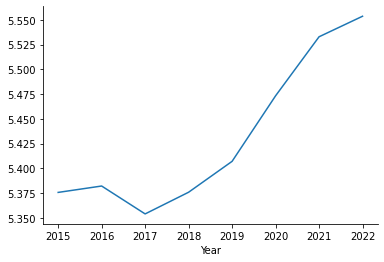

In [109]:
whr.groupby(['Year'])['Happiness'].mean().plot()

Jak widać na powyższym wykresie, średni poziom szczęśliwości oscyluje w przedziale 5.3 - 5.6. Od 2017 roku poziom szczęśliwości notuje trend wzrostowy.

### Histogram

Rozkład naszej zmiennej:

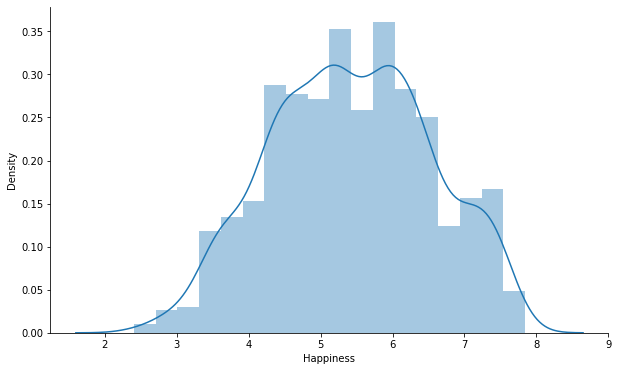

In [110]:
plt.figure(figsize=(10, 6))
sns.distplot(whr['Happiness'])
plt.show()

Sprawdzamy wpływ zmiennych objaśniających na zmienną objaśnianą.

Jak widać największe gęstość zadowolenia jest pomiędzy 4 i 7.

### Wskazujemy, które zmienne są naszym X, a które są naszym y

In [111]:
numeric_features = ['GDP per capita', 'Social support', 'Life Exp', 'Freedom', 'Generosity', 
                    'Gov Corruption', 'Dystopia Residual', 'Broadband', 
                    'Internet individuals', 'Fertility', 'Annual sunshine']
categorical_features = ['Year', 'Country']
target = 'Happiness' 

In [112]:
X = whr[numeric_features].copy()

y = whr[target].copy()

display(X.iloc[:3])
display(y.iloc[:3])

,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals,Fertility,Annual sunshine
0,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738,44.602427,87.479056,1.54,2003.5
1,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201,37.680133,98.200000,1.80,1326.0
2,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204,42.276164,96.330502,1.71,1912.0


0    7.587
1    7.561
2    7.527
Name: Happiness, dtype: float64

Sprawdzimy korelację dla naszych cech numerycznych:

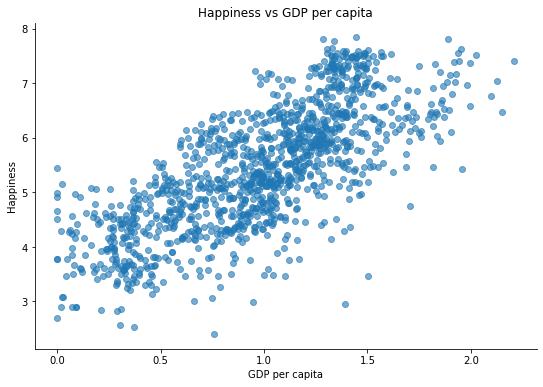

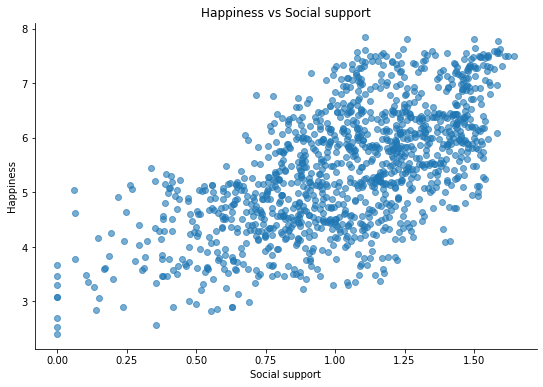

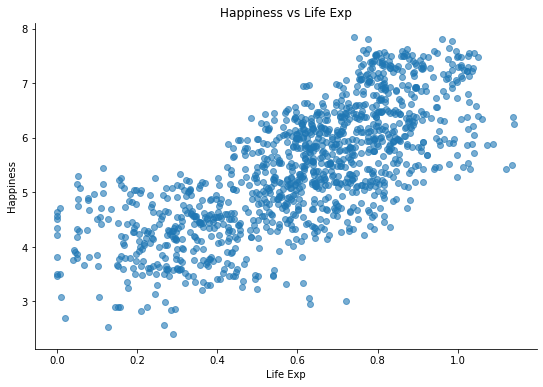

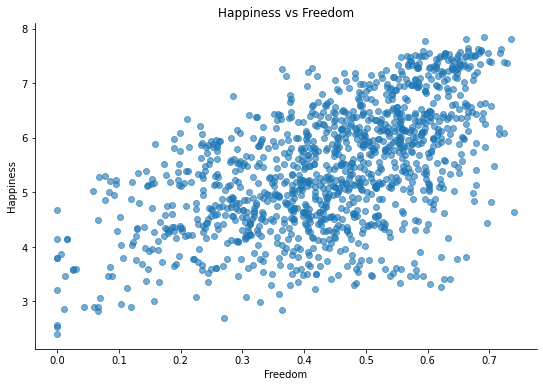

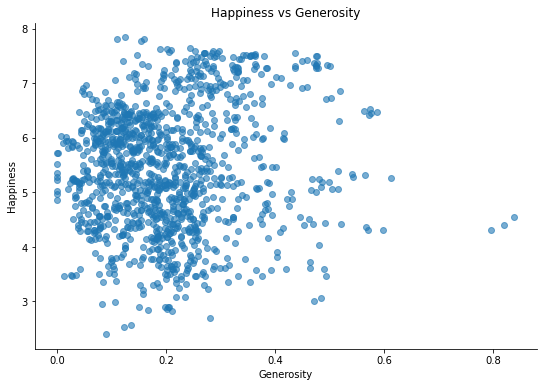

...

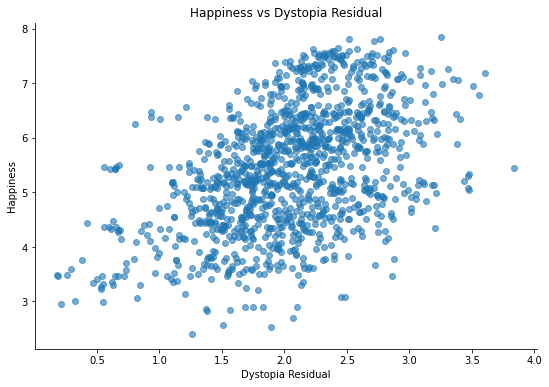

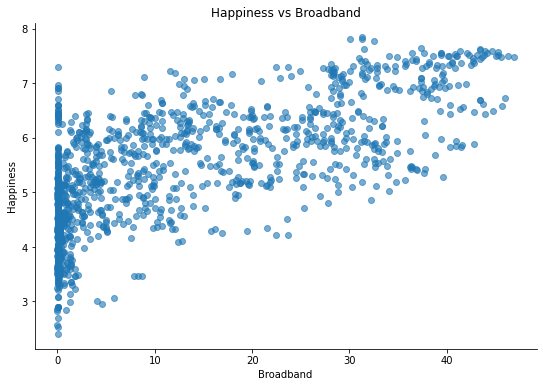

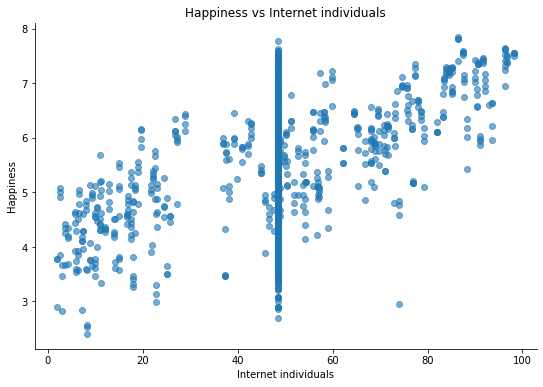

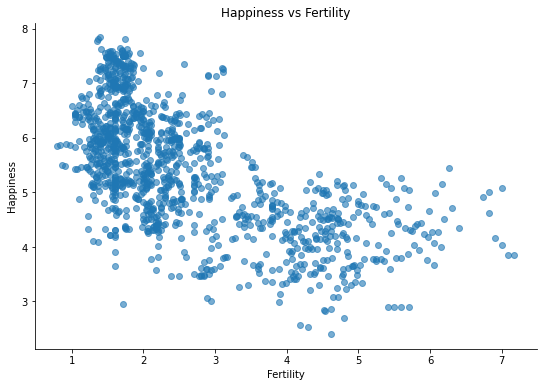

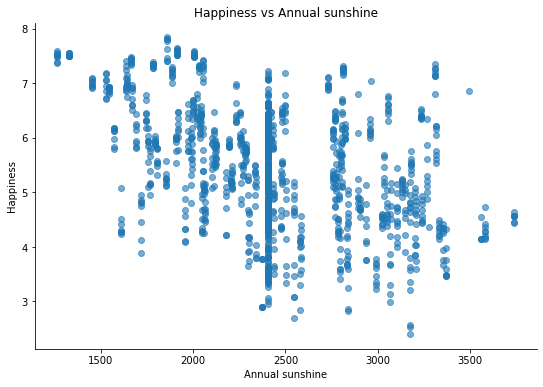

In [113]:
for numeric_feature in numeric_features:
    fig = plt.figure(figsize=(9, 6))
    
    plt.scatter(whr[numeric_feature], whr[target], alpha=0.6)
    plt.xlabel(numeric_feature)
    plt.ylabel('Happiness')  
    plt.title(f'Happiness vs {numeric_feature}') 
    plt.show()

Sprawdzimy czy występuje zależność pomiędzy naszymi cechami:

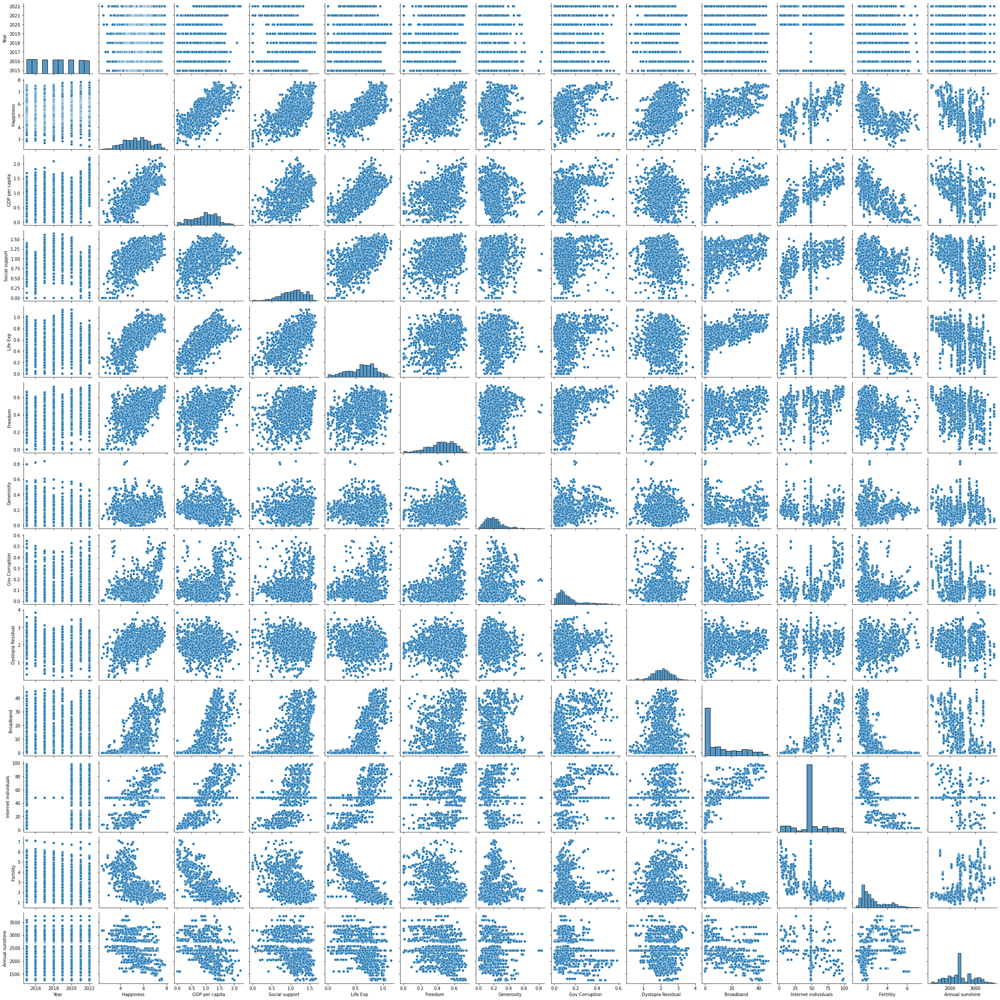

In [114]:
sns.pairplot(whr)

**Tworzymy macierz korelacji dla naszych zmiennych numerycznych:**

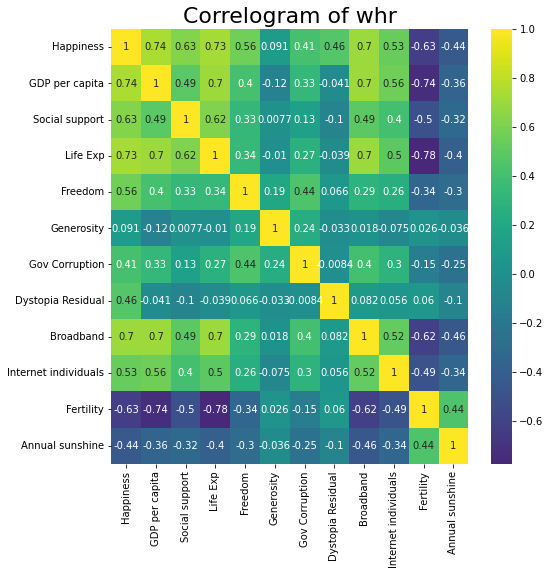

In [115]:
plt.figure(figsize=(8, 8))
ax = sns.heatmap(whr[[target]+numeric_features].corr(), cmap='viridis', center=0, annot=True)    
plt.title('Correlogram of whr', fontsize=22)
plt.show()

Z wykresu korelacji wynika, że najbardziej skorelowane z Happiness są GDP per capita, Life exp, Broadband, Social support oraz Fertility (ujemna korelacja).

Teraz sprawdzimy naszą zmienną kategoryczną Year:

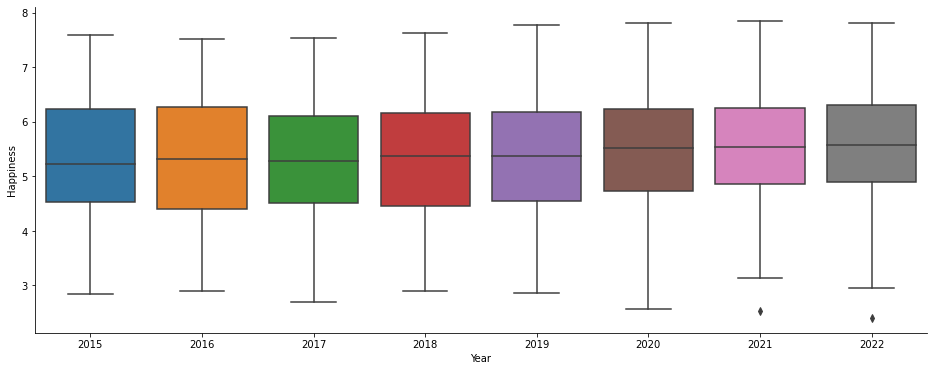

In [116]:
plt.figure(figsize=(16, 6))
sns.boxplot(y=whr[target], x=whr['Year'])
plt.show()

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

### Podział na zbiory treningowy i testowy

In [117]:
X_train = whr.drop(['Happiness'], axis=1)
X_train = X_train.loc[X_train['Year']<2021]

X_test = whr.drop(['Happiness'], axis=1)
X_test = X_test.loc[X_test['Year']>=2021]

y_train = whr.loc[whr['Year']<2021]
y_train = y_train['Happiness']

y_test = whr.loc[whr['Year']>=2021]
y_test = y_test['Happiness']

**Standaryzacja**

In [118]:
X_train = X_train.drop(['Year','Country'], axis=1)
X_test = X_test.drop(['Year','Country'], axis=1)

In [119]:
X_train

,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals,Fertility,Annual sunshine
0,1.396510,1.349510,0.941430,0.665570,0.296780,0.419780,2.517380,44.602427,87.479056,1.54,2003.5
1,1.302320,1.402230,0.947840,0.628770,0.436300,0.141450,2.702010,37.680133,98.200000,1.80,1326.0
2,1.325480,1.360580,0.874640,0.649380,0.341390,0.483570,2.492040,42.276164,96.330502,1.71,1912.0
3,1.459000,1.330950,0.885210,0.669730,0.346990,0.365030,2.465310,39.433167,96.810326,1.72,1265.0
4,1.326290,1.322610,0.905630,0.632970,0.458110,0.329570,2.451760,36.404624,90.000000,1.60,2051.0
...,...,...,...,...,...,...,...,...,...,...,...
930,0.041072,0.000000,0.000000,0.292814,0.253513,0.028265,2.860198,0.013637,2.900000,4.57,2546.5
931,0.343243,0.522876,0.572383,0.604088,0.235705,0.485542,0.548445,0.033344,18.000000,3.93,2404.2
932,0.425564,1.047835,0.375038,0.377405,0.151349,0.080929,0.841031,0.263682,22.742818,3.46,3065.4
933,0.289083,0.553279,0.208809,0.065609,0.209935,0.111157,1.378751,0.001175,3.000000,4.54,2841.3


In [120]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [121]:
# Po standaryzacji:

whr['Happiness'].agg(['min','max','mean','std'])

min     2.404000
max     7.842000
mean    5.430092
std     1.115361
Name: Happiness, dtype: float64

**Regresja Liniowa**

**Trenujemy nasz model**

In [122]:
from sklearn.linear_model import LinearRegression

In [123]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

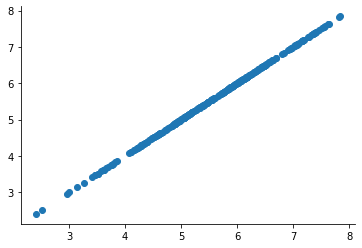

In [124]:
plt.scatter(lr_model.predict(X_test), y_test)

**Robimy predykcje dla zbioru treningowego i testowego**

In [125]:
y_predict_train = lr_model.predict(X_train)
y_predict_test = lr_model.predict(X_test)

**Dummy model**

In [126]:
dummy_model = DummyRegressor(strategy='mean')  
dummy_model.fit(X_train, y_train)

DummyRegressor()

**Predykcja na trenigowym i testowym**

In [127]:
y_train_dummy = dummy_model.predict(X_train)
y_test_dummy = dummy_model.predict(X_test)

**Błędy dla modelu dummy**

In [128]:
MAE_dummy_train = mean_absolute_error(y_train, y_train_dummy)
MAE_dummy_test = mean_absolute_error(y_test, y_test_dummy)
MAPE_dummy_test = mean_absolute_percentage_error(y_test, y_test_dummy)*100
MSE_dummy = mean_squared_error(y_test, y_test_dummy)
RMSE_dummy = sqrt(MSE_dummy)

**Test dummy modelu**

In [129]:
y_test_dummy[:5] 

array([5.39443604, 5.39443604, 5.39443604, 5.39443604, 5.39443604])

**Testowego**

In [130]:
y_predict_test[:5]

array([7.84169399, 7.61967613, 7.56948909, 7.55338132, 7.46350475])

**Współczynniki regresji**

In [131]:
lr_model.intercept_

5.394436041883378

In [132]:
lr_model.coef_

array([ 4.01135818e-01,  3.24132551e-01,  2.50962134e-01,  1.52130433e-01,
        1.19365634e-01,  1.07020516e-01,  5.57558748e-01, -3.31388244e-06,
        7.91185156e-05, -1.26956810e-04,  1.58857515e-05])

**Błędy**

**MAE**

In [133]:
MAE_rl_model_train = mean_absolute_error(y_train, y_predict_train)
MAE_rl_model_test = mean_absolute_error(y_test, y_predict_test)

print('Train:')
print(f'MAE Dummy: {MAE_dummy_train}')
print(f'MAE RL Model: {MAE_rl_model_train}')
print('\nTest:')
print(f'MAE Dummy: {MAE_dummy_test}')
print(f'MAE RL Model: {MAE_rl_model_test}')

Train:
MAE Dummy: 0.9348458158942521
MAE RL Model: 0.0004052732823592803

Test:
MAE Dummy: 0.8871266263911254
MAE RL Model: 0.0008919485434621864


In [134]:
(0.0009031060450573293 - 0.00040196006352908437) / 0.00040196006352908437

1.2467556531072739

Czyli średni błąd bezwzględny to ok 1,246 - jest to różnica pomiędzy wartością prawdziwą i naszą prognozą

**MAPE (%)**

In [135]:
MAPE_rl_model_test = mean_absolute_percentage_error(y_test, y_predict_test)*100

print('Test:')
print(f'MAPE Dummy: {MAPE_dummy_test}%')
print(f'MAPE RL Model: {MAPE_rl_model_test}%')

Test:
MAPE Dummy: 17.1152071365751%
MAPE RL Model: 0.016696443062697408%


**MSE**

In [136]:
MSE_rl_model = mean_squared_error(y_test, y_predict_test)   

print('Test:')
print(f'MSE Dummy MSE: {MSE_dummy}')
print(f'MSE RL Model MSE: {MSE_rl_model}')

Test:
MSE Dummy MSE: 1.1814226728291994
MSE RL Model MSE: 1.2522978600924872e-06


**RMSE (pierwiastek z MSE)**

In [137]:
RMSE_rl_model = sqrt(MSE_rl_model)

print('Test:')
print(f'RMSE Dummy: {RMSE_dummy}')
print(f'RMSE RL Model: {RMSE_rl_model}')

Test:
RMSE Dummy: 1.0869326901097416
RMSE RL Model: 0.0011190611511854422


In [138]:
mean_squared_error(y_test, y_predict_test, squared=False)

0.0011190611511854422

Widzimy, że Dummy model myli się o około 1.086932 natomiast nasz model o około 0.001119

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

### Wizualizacyjna ocena modelu

**Porównanie wartości prawdziwej z predykcją**

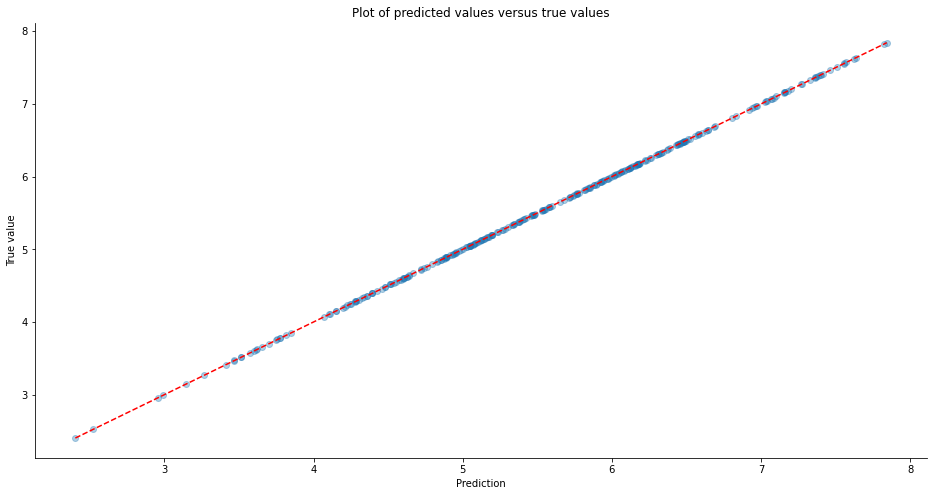

In [139]:
fig = plt.figure(figsize=(16,8))
plt.scatter(x = y_predict_test, y = y_test, alpha=0.35)

xmin, xmax = y_test.min(), y_test.max()
x_line = np.linspace(xmin, xmax, 10)   
y_line = x_line

# Oczekiwana linia trendu

plt.plot(x_line, y_line, 'r--')  


plt.xlabel('Prediction')
plt.ylabel('True value')
plt.title('Plot of predicted values versus true values')
plt.show()

Model regresji liniowej przewiduje wyniki z dokładnością bliską 100%.

### Wykres reszt

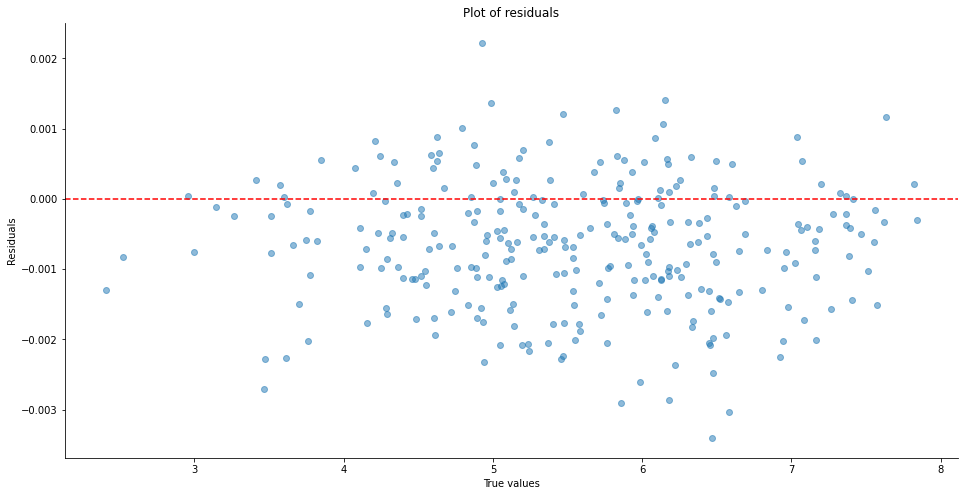

Error mean: -0.0006713282423767257


In [140]:
errors = y_predict_test - y_test
fig = plt.figure(figsize=(16,8))
plt.scatter(x = y_test, y= errors, alpha=0.5)
plt.axhline(0, color='r', linestyle='--')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.title('Plot of residuals')
plt.show()
print(f'Error mean: {errors.mean()}')

### Histogram reszt

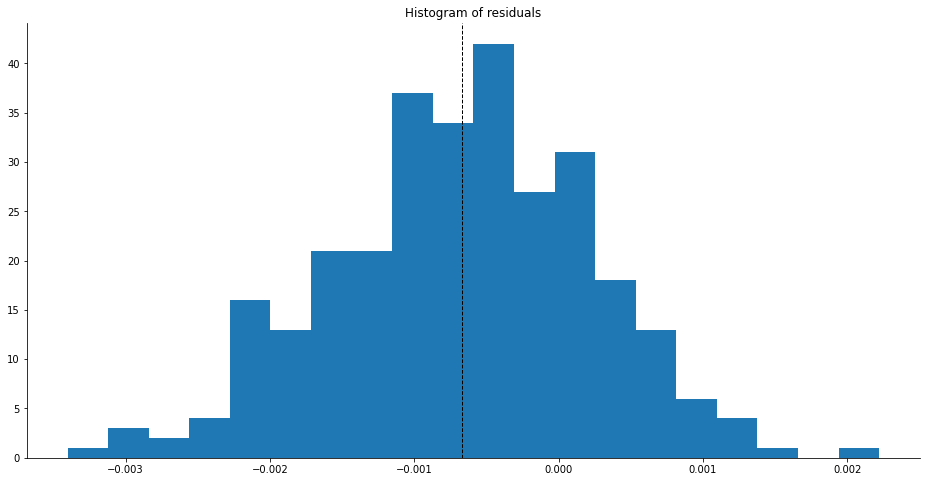

In [141]:
fig = plt.figure(figsize=(16,8))
plt.hist(errors, bins=20)

plt.axvline(errors.mean(), color='k', linestyle='dashed', linewidth=1)
plt.title('Histogram of residuals')
plt.show()

### Drzewo decyzyjne

In [142]:
X = whr[numeric_features].copy()
y = whr[target].copy()

**Trenujemy model**

In [143]:
model_tree = DecisionTreeRegressor()
model_tree.fit(X_train, y_train)

DecisionTreeRegressor()

**Predykcja**

In [144]:
y_predict_train_tree = model_tree.predict(X_train)
y_predict_test_tree = model_tree.predict(X_test)

In [145]:
y_predict_train_tree[:5]

array([7.587, 7.561, 7.527, 7.522, 7.427])

In [146]:
y_predict_test_tree[:5] 

array([7.632     , 7.64559984, 7.509     , 7.6       , 7.6       ])

**Porównanie wartości prawdziwej z predykcją**

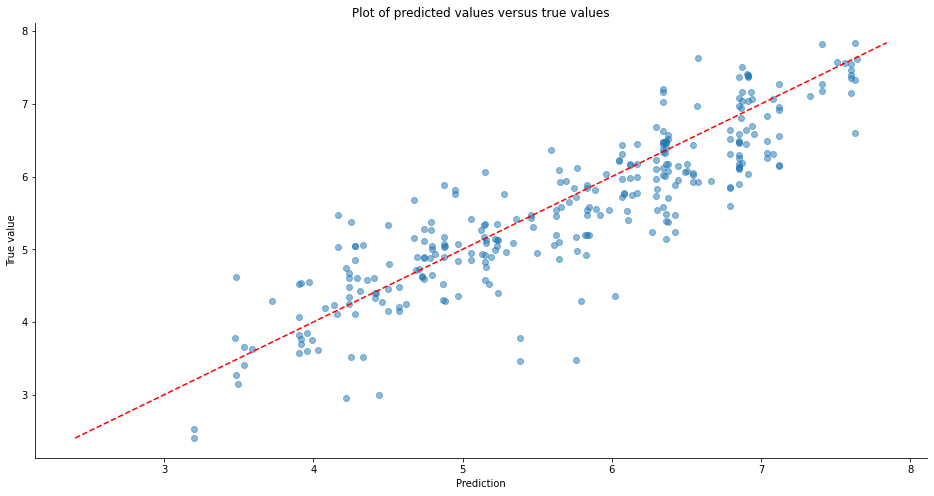

In [147]:
fig = plt.figure(figsize=(16,8))
plt.scatter(x = y_predict_test_tree, y = y_test, alpha=0.5)


xmin_tree, xmax_tree = y_test.min(), y_test.max()
x_line_tree = np.linspace(xmin_tree, xmax_tree, 10)   
y_line_tree = x_line_tree

# Oczekiwana linia trendu

plt.plot(x_line_tree, y_line_tree, 'r--')  


plt.xlabel('Prediction')
plt.ylabel('True value')
plt.title('Plot of predicted values versus true values')

plt.show()

Model drzewa decyzyjnego okazuje się niedobrym wyborem wobec tego problemu.

**Błędy**

**MAE dla drzewa decyzyjnego**

In [148]:
MAE_rl_model_train_tree = mean_absolute_error(y_train, y_predict_train_tree)
MAE_rl_model_test_tree = mean_absolute_error(y_test, y_predict_test_tree)

print('Train')
print(f'MAE Dummy: {MAE_dummy_train}')
print(f'MAE RL Model_tree: {MAE_rl_model_train_tree}')

print('\nTest:')
print(f'MAE Dummy: {MAE_dummy_test}')
print(f'MAE RL Model_tree: {MAE_rl_model_test_tree}')

Train
MAE Dummy: 0.9348458158942521
MAE RL Model_tree: 6.130035022666795e-10

Test:
MAE Dummy: 0.8871266263911254
MAE RL Model_tree: 0.4094501747617261


**MAPE (%) dla drzewa decyzyjnego**

In [149]:
MAPE_rl_model_test_tree = mean_absolute_percentage_error(y_test, y_predict_test_tree)*100

print('Test:')
print(f'MAPE Dummy: {MAPE_dummy_test}%')
print(f'MAPE Model_tree: {MAPE_rl_model_test_tree}%')

Test:
MAPE Dummy: 17.1152071365751%
MAPE Model_tree: 8.000332136554164%


**MSE dla drzewa decyzyjnego**

In [150]:
MSE_rl_model_test_tree = mean_squared_error(y_test, y_predict_test_tree) 

print('Test')
print(f'MSE Dummy: {MSE_dummy}')
print(f'MSE Model_tree: {MSE_rl_model_test_tree}')

Test
MSE Dummy: 1.1814226728291994
MSE Model_tree: 0.2940039646234844


**RMSE (pierwiastek z MSE) dla drzewa decyzyjnego**

In [151]:
RMSE_rl_model_tree = sqrt(MSE_rl_model_test_tree)

print('Test:')
print(f'RMSE Dummy: {RMSE_dummy}')
print(f'RMSE Model_tree: {RMSE_rl_model_tree}')

Test:
RMSE Dummy: 1.0869326901097416
RMSE Model_tree: 0.5422213243902202


**Wykres reszt dla drzewa**

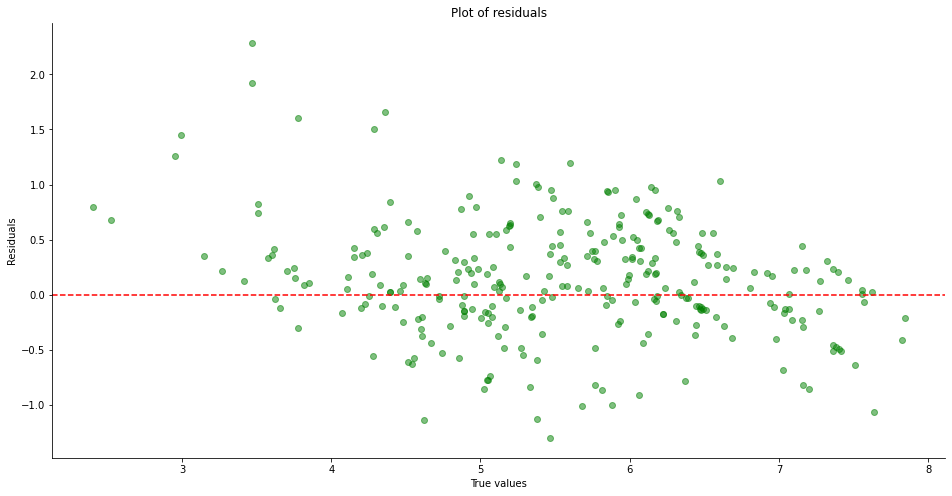

Error mean: -0.0006713282423767257


In [152]:
errors_tree = y_predict_test_tree - y_test
fig = plt.figure(figsize=(16,8))
plt.scatter(x = y_test, y= errors_tree, color='g', alpha=0.5)
plt.axhline(0, color='r', linestyle='--')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.title('Plot of residuals')
plt.show()
print(f'Error mean: {errors.mean()}')

**Histogram reszt dla drzewa decyzyjnego**

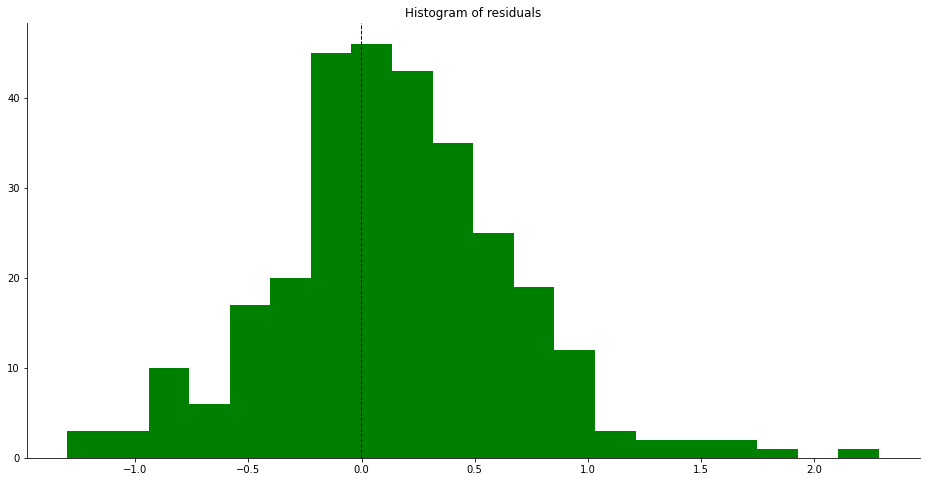

In [153]:
fig = plt.figure(figsize=(16,8))
plt.hist(errors_tree, color='g', bins=20)
plt.axvline(errors.mean(), color='k', linestyle='dashed', linewidth=1)
plt.title('Histogram of residuals')
plt.show()

Powyższy wykres pokazuje jednoznacznie, że model drzewa decyzyjnego znacznie bardziej się myli niż model regresji liniowej.
Dla regresji liniowej błąd jest bardzo mały.

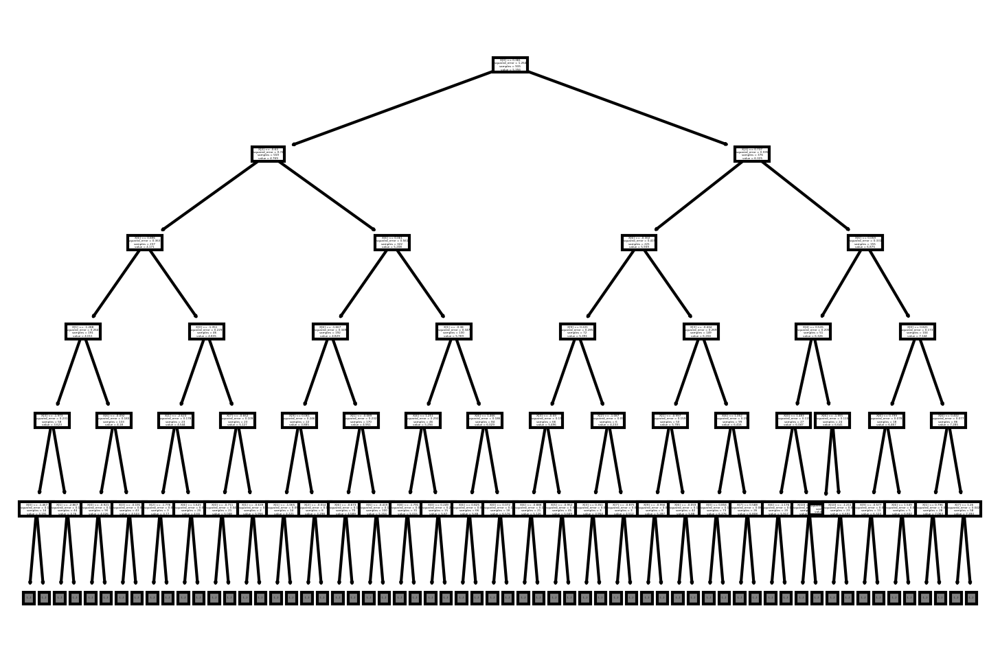

In [154]:
from sklearn.tree import plot_tree
plt.figure(dpi=300)      
plot_tree(model_tree, max_depth=5)
plt.show()

### Współczynnik determinacji

Sprawdźmy jaką część zmienności y wyjaśnia nasz model.
W pierwszej kolejności sprawdźmy to dla naszego prostego modelu

In [155]:
print(f'Dummy Train R^2: {r2_score(y_train, y_train_dummy)}') 
print(f'RL Model Train R^2: {r2_score(y_train, y_predict_train)}')

Dummy Train R^2: 0.0
RL Model Train R^2: 0.999996625100716


R^2 przekazuje nam informację o ile lepiej nasz model wyjaśnia zmienność niż średnia, stąd też R^2 dla modelu który jest średnią daje wynik 0. Jako, że z założenia nie znamy średniej ze zbioru testowego to i również nie powinniśmy dla tego zbioru liczyć R^2.

R-squared jest metryką korelacji. Korelacja jest mierzona przez "r" i mówi nam jak silnie dwie zmienne mogą być ze sobą powiązane. Korelacja bliższa +1 oznacza silny związek w kierunku dodatnim, natomiast -1 oznacza silniejszy związek w kierunku przeciwnym. Wartość bliższa 0 oznacza, że między zmiennymi nie ma zbyt dużego związku. R-squared jest ściśle związany z korelacją.

**Random Forest**

**Trenujemy model**

In [156]:
model_rf = rfr(n_estimators=35, max_depth=None, random_state = 40)
model_rf.fit(X_train, y_train)

RandomForestRegressor(n_estimators=35, random_state=40)

**Predykcja**

In [157]:
y_predict_test_rf = model_rf.predict(X_test)
y_predict_train_rf = model_rf.predict(X_train)

**Porównanie wartości prawdziwej z predykcją**

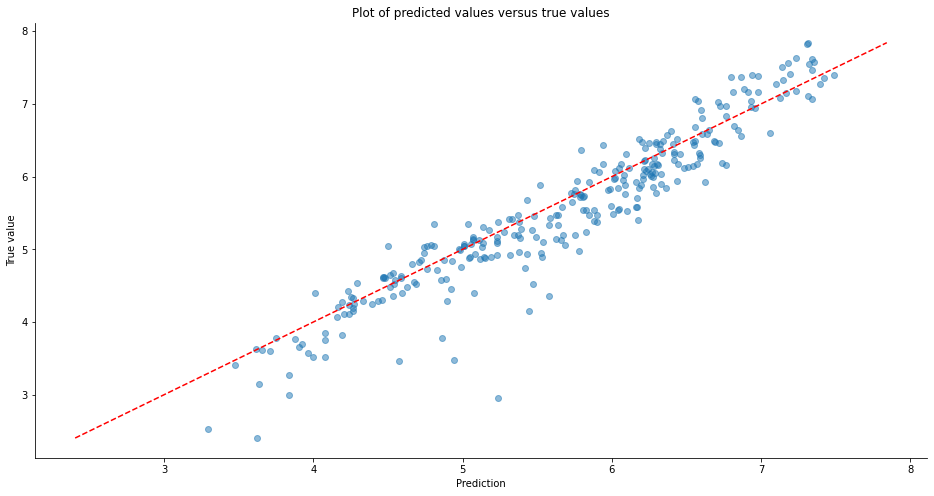

In [158]:
fig = plt.figure(figsize=(16,8))
plt.scatter(x = y_predict_test_rf, y = y_test, alpha=0.5)

xmin_rf, xmax_rf = y_test.min(), y_test.max()
x_line_rf = np.linspace(xmin_rf, xmax_rf, 10)   
y_line_rf = x_line_rf

# Oczekiwana linia trendu

plt.plot(x_line_rf, y_line_rf, 'r--')  

plt.xlabel('Prediction')
plt.ylabel('True value')
plt.title('Plot of predicted values versus true values')

plt.show()

Model Random Forest jest zdecywonie lepszy od Decision Tree, nie przewiduje jednak wyników z taką dokładnością 
jak regresja liniowa.

**Błędy**

**MAE dla Random Forest**

In [159]:
MAE_model_train_rf = mean_absolute_error(y_train, y_predict_train_rf)
MAE_model_test_rf = mean_absolute_error(y_test, y_predict_test_rf)

print('Train')
print(f'MAE Dummy: {MAE_dummy_train}')
print(f'MAE RL Model_rf: {MAE_model_train_rf}')

print('\nTest:')
print(f'MAE Dummy: {MAE_dummy_test}')
print(f'MAE RL Model_rf: {MAE_model_test_rf}')

Train
MAE Dummy: 0.9348458158942521
MAE RL Model_rf: 0.06120465176832903

Test:
MAE Dummy: 0.8871266263911254
MAE RL Model_rf: 0.26360030734776546


**MAPE (%) dla Random Forest**

In [160]:
MAPE_model_test_rf = mean_absolute_percentage_error(y_test, y_predict_test_rf)*100

print('Test:')
print(f'MAPE Dummy: {MAPE_dummy_test}%')
print(f'MAPE Model_rf: {MAPE_model_test_rf}%')

Test:
MAPE Dummy: 17.1152071365751%
MAPE Model_rf: 5.3395206041594685%


**MSE dla Random Forest**

In [161]:
MSE_model_test_rf = mean_squared_error(y_test, y_predict_test_rf) 

print('Test')
print(f'MSE Dummy: {MSE_dummy}')
print(f'MSE Model_rf: {MSE_model_test_rf}')

Test
MSE Dummy: 1.1814226728291994
MSE Model_rf: 0.13789323971272133


**RMSE (pierwiastek z MSE) dla Random Forest**

In [162]:
RMSE_model_test_rf = sqrt(MSE_model_test_rf)

print('Test')
print(f'RMSE Dummy: {RMSE_dummy}')
print(f'RMSE Model_rf: {RMSE_model_test_rf}')

Test
RMSE Dummy: 1.0869326901097416
RMSE Model_rf: 0.37133979010162826


In [163]:
model_rf

RandomForestRegressor(n_estimators=35, random_state=40)

**Wykres reszt**

In [164]:
errors_rf = y_predict_test_rf - y_test

mae_rf = mean_absolute_error(y_test, y_predict_test_rf)
mape_rf = mean_absolute_percentage_error(y_test, y_predict_test_rf)*100
mse_rf = mean_squared_error(y_test, y_predict_test_rf)
rmse_rf = sqrt(mse_rf)
print('MAE:', mae_rf)
print('MAPE:', mape_rf)
print('MSE:', mse_rf)
print('RMSE:', rmse_rf)

MAE: 0.26360030734776546
MAPE: 5.3395206041594685
MSE: 0.13789323971272133
RMSE: 0.37133979010162826


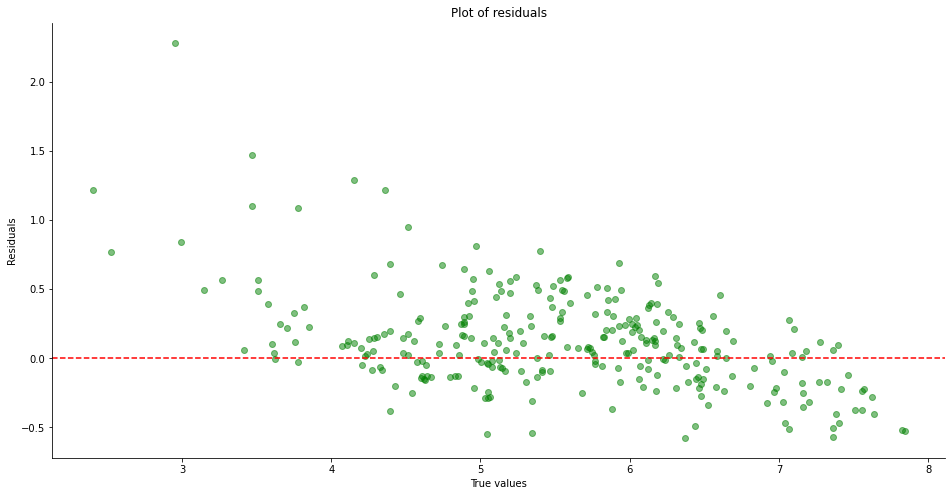

Error mean: 0.12212241731006312


In [165]:
fig = plt.figure(figsize=(16,8))
plt.scatter(x = y_test, y= errors_rf, color='g', alpha=0.5)
plt.axhline(0, color='r', linestyle='--')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.title('Plot of residuals')
plt.show()
print(f'Error mean: {errors_rf.mean()}')

**Histogram reszt**

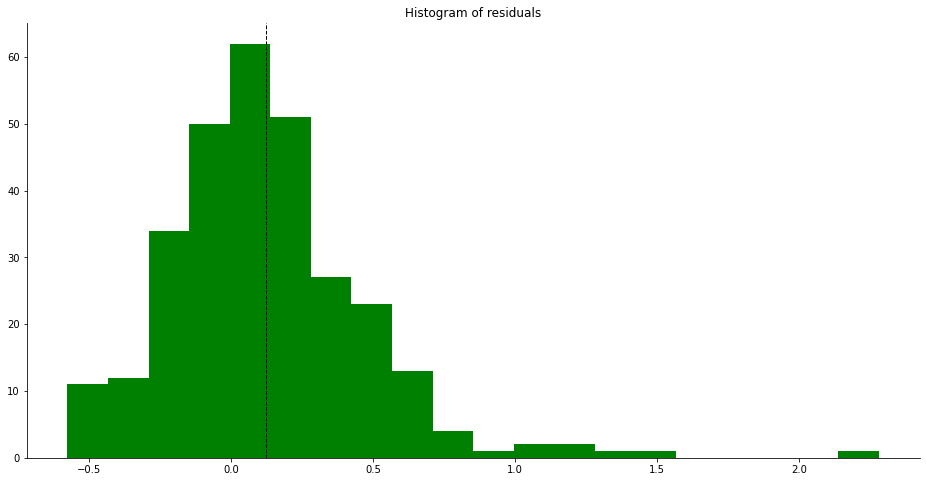

In [166]:
fig = plt.figure(figsize=(16,8))
plt.hist(errors_rf, color='g', bins=20)
plt.axvline(errors_rf.mean(), color='k', linestyle='dashed', linewidth=1)
plt.title('Histogram of residuals')
plt.show()

**Porównianie błędów - Regresja Liniowa, Drzewo Decyzyjne i Random Forest**

In [167]:
data1 = {
    'Model': ['Regresja Liniowa', 'Regresja Liniowa', 'Regresja Liniowa', 'Regresja Liniowa', 
              'Drzewo decyzyjne', 'Drzewo decyzyjne', 'Drzewo decyzyjne', 'Drzewo decyzyjne',
              'Random Forest', 'Random Forest', 'Random Forest', 'Random Forest'],
    'Errors': ['MAE_rl_model_test', 'MAPE_rl_model_test', 'MSE_rl_model', 'RMSE_rl_model', 'MAE_rl_model_test_tree', 
               'MAPE_rl_model_test_tree', 'MSE_rl_model_test_tree', 'RMSE_rl_model_tree', 'MAE_model_test_rf', 
               'MAPE_model_test_rf', 'MSE_model_test_rf', 'RMSE_model_test_rf'],
    'Value': [MAE_rl_model_test, MAPE_rl_model_test, MSE_rl_model, RMSE_rl_model, MAE_rl_model_test_tree, 
               MAPE_rl_model_test_tree, MSE_rl_model_test_tree, RMSE_rl_model_tree, MAE_model_test_rf, 
               MAPE_model_test_rf, MSE_model_test_rf, RMSE_model_test_rf]}

In [168]:
df = pd.DataFrame(data1, columns=['Model', 'Errors', 'Value'])

In [169]:
df

,Model,Errors,Value
0,Regresja Liniowa,MAE_rl_model_test,0.000892
1,Regresja Liniowa,MAPE_rl_model_test,0.016696
2,Regresja Liniowa,MSE_rl_model,0.000001
3,Regresja Liniowa,RMSE_rl_model,0.001119
4,Drzewo decyzyjne,MAE_rl_model_test_tree,0.409450
5,Drzewo decyzyjne,MAPE_rl_model_test_tree,8.000332
6,Drzewo decyzyjne,MSE_rl_model_test_tree,0.294004
7,Drzewo decyzyjne,RMSE_rl_model_tree,0.542221
8,Random Forest,MAE_model_test_rf,0.263600
9,Random Forest,MAPE_model_test_rf,5.339521


**Porównanie błędów wszystkich modeli**

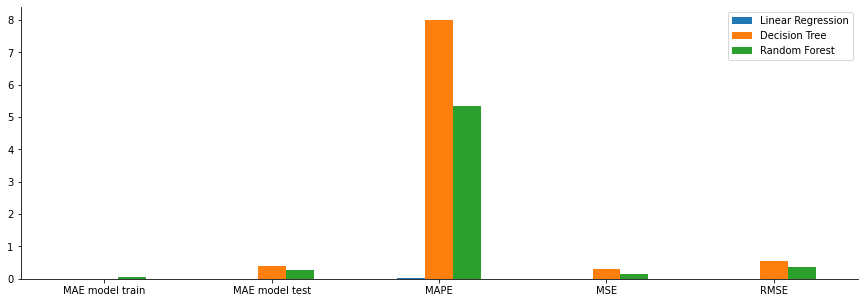

In [170]:
plt.rcParams["figure.figsize"] = (15, 5)

LinearRegression = [MAE_rl_model_train, MAE_rl_model_test, MAPE_rl_model_test, MSE_rl_model, RMSE_rl_model]

DecisionTree = [MAE_rl_model_train_tree, MAE_rl_model_test_tree, 
                MAPE_rl_model_test_tree, MSE_rl_model_test_tree, RMSE_rl_model_tree]

RandomForest = [MAE_model_train_rf, MAE_model_test_rf, MAPE_model_test_rf, MSE_model_test_rf, RMSE_model_test_rf]

index = ['MAE model train', 'MAE model test', 'MAPE', 'MSE', 'RMSE']


df = pd.DataFrame({'Linear Regression': LinearRegression, 
                   'Decision Tree': DecisionTree, 
                   'Random Forest': RandomForest}, index=index)

ax = df.plot.bar(rot=0)

Najlepsze wyniki uzyskała definitywnie regresja liniowa.

**Wartość ważności cech dla poszczególnych modeli, określające ich wpływ na targetr (Happiness).**

In [171]:
importances = pd.DataFrame(data={
    'Attribute': X.columns,
    'Importance': lr_model.coef_[0]
})
importances = importances.sort_values(by='Importance', ascending=False)

def background_color_change(val):
    if (isinstance(val, float)):
        if (val > 0.3):
            background = 'yellow'
        else:
            background = 'white'
        return 'background: %s' % background
 
importances.style.applymap(background_color_change)

,Attribute,Importance
0,GDP per capita,0.401136
1,Social support,0.401136
2,Life Exp,0.401136
3,Freedom,0.401136
4,Generosity,0.401136
5,Gov Corruption,0.401136
6,Dystopia Residual,0.401136
7,Broadband,0.401136
8,Internet individuals,0.401136
9,Fertility,0.401136


In [172]:
importances = pd.DataFrame(data={
    'Attribute': X.columns,
    'Importance': model_tree.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=False)
 
importances.style.applymap(background_color_change)

,Attribute,Importance
0,GDP per capita,0.492540
6,Dystopia Residual,0.189053
2,Life Exp,0.128492
3,Freedom,0.093224
1,Social support,0.054193
9,Fertility,0.015352
4,Generosity,0.009549
10,Annual sunshine,0.006312
7,Broadband,0.005479
5,Gov Corruption,0.003429


In [173]:
importances = pd.DataFrame(data={
    'Attribute': X.columns,
    'Importance': model_rf.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=False)
 
importances.style.applymap(background_color_change)

,Attribute,Importance
0,GDP per capita,0.403487
2,Life Exp,0.239423
6,Dystopia Residual,0.180400
3,Freedom,0.058895
1,Social support,0.049139
5,Gov Corruption,0.022640
9,Fertility,0.019549
4,Generosity,0.010820
7,Broadband,0.009987
10,Annual sunshine,0.004158


Wytłumaczeniem dlaczego dla linear regression wszystkie wartości cech mają tę samą wartość, jest to że model regresji liniowej przewiduje wyniki z bardzo dużą dokładnością. Dlatego wszystkie cechy są w tym modelu równie ważne.

Dla modeli decision tree i random forest jest już inaczej. Na pierwszym miejscu jest 'GDP per capita', z nieznaczną różnicą ważności tej cechy.